# Increasing the sales of mobile based on customer reviews in Amazon

#### positive sentiment: compound score >= 0.5
#### neutral sentiment: (compound score > -0.5) and (compound score < 0.5)
#### negative sentiment: compound score <= -0.5

#### Compound score: is the sum of all of the lexicon ratings which have been standardised to range between -1 and 1

In [1]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
#from nltk.sentiment.util import *
import pandas as pd

In [2]:
data = pd.read_csv('C:\\Users\\Sai Charan Reddy\\Desktop\\APPLIED_AI\\NLP\\Python3.6\\Data\\Amazon_Mobile_Data.csv')
data.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413840 entries, 0 to 413839
Data columns (total 6 columns):
Product Name    413840 non-null object
Brand Name      348669 non-null object
Price           407907 non-null float64
Rating          413840 non-null int64
Reviews         413778 non-null object
Review Votes    401544 non-null float64
dtypes: float64(2), int64(1), object(3)
memory usage: 18.9+ MB


In [4]:
data.isna().sum()

Product Name        0
Brand Name      65171
Price            5933
Rating              0
Reviews            62
Review Votes    12296
dtype: int64

In [5]:
dataset = data.dropna()

In [6]:
dataset.describe()

,Price,Rating,Review Votes
count,334335.000000,334335.000000,334335.000000
mean,222.585019,3.824888,1.474515
std,283.139353,1.541203,9.217348
min,1.730000,1.000000,0.000000
25%,75.410000,3.000000,0.000000
50%,139.000000,5.000000,0.000000
75%,264.100000,5.000000,1.000000
max,2598.000000,5.000000,645.000000


In [7]:
print(len(data))
print(len(dataset))

413840
334335


In [8]:
dataset.isna().sum()

Product Name    0
Brand Name      0
Price           0
Rating          0
Reviews         0
Review Votes    0
dtype: int64

In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 334335 entries, 0 to 413839
Data columns (total 6 columns):
Product Name    334335 non-null object
Brand Name      334335 non-null object
Price           334335 non-null float64
Rating          334335 non-null int64
Reviews         334335 non-null object
Review Votes    334335 non-null float64
dtypes: float64(2), int64(1), object(3)
memory usage: 17.9+ MB


In [10]:
df =  dataset.drop(['Product Name', 'Price', 'Review Votes'], axis = 1)

In [11]:
df.head(3)

,Brand Name,Rating,Reviews
0,Samsung,5,I feel so LUCKY to have found this used (phone...
1,Samsung,4,"nice phone, nice up grade from my pantach revu..."
2,Samsung,5,Very pleased


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 334335 entries, 0 to 413839
Data columns (total 3 columns):
Brand Name    334335 non-null object
Rating        334335 non-null int64
Reviews       334335 non-null object
dtypes: int64(1), object(2)
memory usage: 10.2+ MB


In [13]:
df_sam =  df['Brand Name'] == 'Samsung'
df_sam = df[df_sam]
df_apple = df['Brand Name'] == 'Apple'
df_apple = df[df_apple]
print(df_sam.shape)
df_apple.shape

(63038, 3)


(56101, 3)

In [14]:
df_sam.head(3)

,Brand Name,Rating,Reviews
0,Samsung,5,I feel so LUCKY to have found this used (phone...
1,Samsung,4,"nice phone, nice up grade from my pantach revu..."
2,Samsung,5,Very pleased


In [15]:
df_apple.head(3)

,Brand Name,Rating,Reviews
3081,Apple,5,Was a gift for my husband and he loves it. Rep...
3082,Apple,5,"Great price, extremely fast shipping works as ..."
3083,Apple,4,Moving from Android to Apple...my kids have th...


In [16]:
# df['Brand Name'].unique()
samsung_df = []
nokia_df = []
apple_df = []
hu_df = []
for i in df['Brand Name']:
    if i == 'Samsung':
        samsung_df.append(i)
    if i == 'Nokia':
        nokia_df.append(i)
    if i == 'Apple':
        apple_df.append(i)
    if i == 'Huawei':
        hu_df.append(i)

In [17]:
len(samsung_df)

63038

In [18]:
len(nokia_df)

16166

In [19]:
len(apple_df)

56101

In [20]:
len(hu_df)

3146

In [21]:
df['Brand Name'].unique()

array(['Samsung', 'Nokia', 'HTM', 'Jethro', 'e passion',
       'Cedar Tree Technologies', 'Indigi', 'Phone Baby', 'OtterBox',
       'Lenovo', 'Huawei', 'JUNING', 'Elephone', 'Plum', 'VKworld',
       'NOKIA', 'Ulefone', 'Jiuhe', 'inDigi', 'Acer', 'Aeku', 'Alcatel',
       'TCL Mobile', 'LG', 'amar', 'Amazon', 'Odysseus', 'Digital SNITCH',
       'star', 'Android', 'Yezz', 'Yezz Wireless Ltd.', 'Apple',
       'Apple Computer', 'Certified Refurbished',
       'Amazon.com, LLC *** KEEP PORules ACTIVE ***', 'apple',
       'ARGOM TECH', 'Asus', 'ASUS', 'ASUS Computers', 'asus',
       'BlackBerry', 'Motorola', 'Palm', 'Pantech', 'ZTE', 'ATT', 'Atoah',
       'BlackBerry Storm 9530 Smartphone Unlocked GSM Wireless Handheld Device w/Camera Bluetooth 3.25" Touchscreen LCD',
       'WorryFree Gadgets', 'worryfree', 'iDROID USA', 'Blackberry (Rim)',
       'Research In Motion', 'BLACKBERRY', 'Black Berry', 'Blackberry',
       'blackberry', 'RIM', 'Research in Motion', 'Blackberrry', 'Storm'

In [25]:
reviews = pd.DataFrame(df_apple['Reviews'][:50000])
reviews

,Reviews
3081,Was a gift for my husband and he loves it. Rep...
3082,"Great price, extremely fast shipping works as ..."
3083,Moving from Android to Apple...my kids have th...
3084,It is compatible with Verizon. Not pink but PE...
3085,I love this phone! Thank you so much.
3086,norm!
3087,I got this for my husband and he absolutely lo...
3088,The discription reads that it is a Verizon Wir...
3089,"Basically in the condition described. However,..."
3090,This phone is GREAT! While I didn't hear back ...


In [26]:
import nltk
nltk.download('vader_lexicon')
sentiment = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to C:\Users\Sai Charan
[nltk_data]     Reddy\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


### Sentiment Scores:
#### Compound score: is the sum of all of the lexicon ratings which have been standardised to range between -1 and 1


In [27]:
# only for Zero row of the reviews column
sentiment.polarity_scores(reviews.loc[3087,'Reviews'])['compound']

0.6115

In [28]:
for sentences in reviews['Reviews']:
    s = sentiment.polarity_scores(sentences)
    for k in sorted(s):
        print('{0}: {1}, '.format(k, s[k]))
    print(sentences)

compound: -0.6836, 
neg: 0.159, 
neu: 0.765, 
pos: 0.076, 
Was a gift for my husband and he loves it. Replaced a first gen droid so there was no place to go but up.The phone came in a plain white box with charging cable. It looked brand new and unused.So far it has performed as a new phone with no troubles whatsoever.
compound: 0.6588, 
neg: 0.0, 
neu: 0.614, 
pos: 0.386, 
Great price, extremely fast shipping works as advertized!
compound: 0.6172, 
neg: 0.031, 
neu: 0.874, 
pos: 0.095, 
Moving from Android to Apple...my kids have this phone too and keep me straight on using it. Phone is superb and, while Apple has its moments, it is intuitive to use. Seller was VERY responsive...only reason not a 5 star is "new" phone had been opened for imei verification. Not sure that's industry standard. If it is, seller is 5 star.
compound: 0.8143, 
neg: 0.124, 
neu: 0.593, 
pos: 0.283, 
It is compatible with Verizon. Not pink but PEACH, pretty beaten up...but not bad enough to return. A descent va

neu: 0.8, 
pos: 0.104, 
The iPhone 5c I received is great. The charger and USB cable that came with it have issues. By trial and error I determined the charger barely works. The USB cable has a very small break in it at the edge where it connects with the phone port. It's a disappointment that I have to replace these items immediately.
compound: 0.25, 
neg: 0.105, 
neu: 0.804, 
pos: 0.091, 
According to the local Verizon Wireless branch, the Apple iPhone 5c that I ordered and received was not compatible with Verizon as the description indicated.As a result of the incompatibility, I had to cancel my Verizon wireless contract and pay the contract fee. I purchased the Walmart SIM card kit and their TMobile plan.All in all the phone works great. The compatibility issue was painful and costly to resolve.
compound: -0.6408, 
neg: 0.144, 
neu: 0.856, 
pos: 0.0, 
This phone was NOT compatible with the Verizon network. I had to get a new phone and pay just as much for it. TERRIBLE marketing, do

compound: -0.8338, 
neg: 0.108, 
neu: 0.892, 
pos: 0.0, 
The case was more beat up than expected. We had to remove the screen and unplug and re-plug the 3 screen connections several times to get it to respond consistently, but other than that it's an iPhone and seems to work; now the screen is failing more often and it is past the 30 day warranty, we will likely need to replace it or the phone. Big bummer
compound: 0.4722, 
neg: 0.126, 
neu: 0.678, 
pos: 0.196, 
Product works well so far No problems. Battery life seems to go somewhat fast but in on my phone a lot. So far it's good
compound: 0.6249, 
neg: 0.0, 
neu: 0.745, 
pos: 0.255, 
Phone was in great condition and was able to be activated when received.
compound: 0.88, 
neg: 0.0, 
neu: 0.545, 
pos: 0.455, 
the phone got delivered so fast & the phone is working great! I love it!!
compound: 0.8271, 
neg: 0.081, 
neu: 0.541, 
pos: 0.378, 
Nice phone for the price. Great for a kids first phone. Enough GB and good features at a low pric

compound: 0.9749, 
neg: 0.042, 
neu: 0.83, 
pos: 0.128, 
This may seem really ridiculous but I ordered this last week and got it Saturday. Before I got it activated the other night the screen was messing up on me. I was having a lot of fun trying to put in my WiFi information. Anyway, I got it activated last night and everything was working fine. But now it's back to the way it was before it was activated. The screen was acting like it was possessed or a chipmunk on rd caffeine. It kept going to comments or my messages or previous pages on the Facebook app and it even did it on the Safari app when I decided to just use Facebook on that. Still acted up. I was really looking forward to trying out Apple but I'm really disappointed. Even with that 9.0.2 update or whatever it is, it's still doing it. The phone itself is great but that touchscreen thing, REALLY needs to be fixed. As well as on their future models. The only other positive thing I can say is that it finally showed my music tha

compound: 0.128, 
neg: 0.116, 
neu: 0.741, 
pos: 0.143, 
I still have the phone and no issues at all. Would definitely buy from this seller again.
compound: -0.6705, 
neg: 0.297, 
neu: 0.703, 
pos: 0.0, 
By mistake, I bought a wrong iPhone. It can not work outside America. The refund was 100%.
compound: -0.9343, 
neg: 0.145, 
neu: 0.84, 
pos: 0.016, 
Purchased from CellMania. First phone spent 4 hours at Verizon and could not get activated. Verizon determined the antenna was bad. Returned to CellMania and they sent a new phone after 5 days. Second phone would activate but had no service at home only in town (my son and daughters iphone 5c and iphone 5s have no service issues). Returned second phone and requested a refund. Refund was received next day. Unhappy with the phone quality and the wasted time trying to activate. Refund was quick. Back to my old iphone 4s spoiled by the whole process of trying to upgrade "cheaply"
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great.
compo

compound: 0.2023, 
neg: 0.0, 
neu: 0.357, 
pos: 0.643, 
Works fine
compound: -0.4767, 
neg: 0.383, 
neu: 0.617, 
pos: 0.0, 
Phone was broken when I got it.
compound: -0.4964, 
neg: 0.226, 
neu: 0.774, 
pos: 0.0, 
Home button has a mind of its own working sporadically not very happy
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
very good
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Works great!
compound: 0.6588, 
neg: 0.0, 
neu: 0.646, 
pos: 0.354, 
Received iPhone in a timely manner. The phone works great!
compound: 0.6114, 
neg: 0.0, 
neu: 0.334, 
pos: 0.666, 
Phone was perfect!
compound: 0.7579, 
neg: 0.227, 
neu: 0.306, 
pos: 0.467, 
Awesome exactly as described. Works great, no troubles, received quickly. Thank you.
compound: 0.8074, 
neg: 0.0, 
neu: 0.354, 
pos: 0.646, 
bought it for a friend. works great.
compound: 0.3612, 
neg: 0.0, 
neu: 0.762, 
pos: 0.238, 
It works like new. Got here faster than expected
compound: 0.872, 
neg: 0.0, 
neu: 0.887, 
pos: 0.11

compound: 0.7964, 
neg: 0.0, 
neu: 0.297, 
pos: 0.703, 
Thanks my daughter love it.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Didn't work out, but got a quick refund upon return.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Would not hold a charge. Would get hot when in use. Phone fell short of my expectations
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
great
compound: -0.9048, 
neg: 0.152, 
neu: 0.83, 
pos: 0.019, 
I bought this phone "new" only to find out it is not. The battery percentage was going crazy so I took it into the apple store, only to find that it had been used for the last year and a half and the battery was failing because of it. Also, the software did not pass the apple test when I took it in. So if you want a failing phone with bad software this is the right place for you!
compound: 0.858, 
neg: 0.081, 
neu: 0.549, 
pos: 0.37, 
the iphone is good! but i have an issue the headphones are "fake" plastic not rubbery like the original I expected better 

Loved it!!!
compound: 0.6588, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great!
compound: 0.296, 
neg: 0.0, 
neu: 0.82, 
pos: 0.18, 
The phones has lines goin threw it but works just fine
compound: 0.5719, 
neg: 0.0, 
neu: 0.684, 
pos: 0.316, 
Exactly as described. Knocked and arrived in excellent condition.
compound: 0.8655, 
neg: 0.0, 
neu: 0.34, 
pos: 0.66, 
Great phone. Works well! Arrived safely and promptly.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone arrived on time and looks brand new 😈
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The iPhone is not factory unlocked as advertised
compound: -0.9048, 
neg: 0.152, 
neu: 0.83, 
pos: 0.019, 
I bought this phone "new" only to find out it is not. The battery percentage was going crazy so I took it into the apple store, only to find that it had been used for the last year and a half and the battery was failing because of it. Also, the software did not pass the apple test when I took it in. So if you want a failing phone with bad s

the home button is not operational
compound: -0.0572, 
neg: 0.149, 
neu: 0.851, 
pos: 0.0, 
Home button doesnt work i want my money back
compound: 0.4404, 
neg: 0.0, 
neu: 0.633, 
pos: 0.367, 
Was a gift replacing one he had
compound: 0.1779, 
neg: 0.129, 
neu: 0.702, 
pos: 0.17, 
It was on time product was in good shape and no issues at all
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
Excellent condition
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
very good
compound: 0.2023, 
neg: 0.139, 
neu: 0.696, 
pos: 0.165, 
dont use as a phone no apps no pics all it can do is look cool call and text and be a ipod THATS IT good i pod tho
compound: -0.7964, 
neg: 0.542, 
neu: 0.458, 
pos: 0.0, 
The damaging telefonolo sold. The phone was a fraud.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Geat product.
compound: 0.6808, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
yes it was in good condition and meet all expectations.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
When I 

pos: 1.0, 
good
compound: -0.2755, 
neg: 0.07, 
neu: 0.93, 
pos: 0.0, 
I don't like it because I need ios 7 upgrade and it wont let me upgrade to it so now I need to buy another new phone that will take the ios 7 upgrade
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I paid over $200 for a 16 gb phone and ended up getting an 8 gb.
compound: -0.1326, 
neg: 0.092, 
neu: 0.908, 
pos: 0.0, 
It's beautiful,no real scratches,no cracks.But I may be sending it back,can't access Amazon account on it,or Facebook😱
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
runs soooooooo smoth
compound: 0.7413, 
neg: 0.036, 
neu: 0.803, 
pos: 0.16, 
False advertising . It was stating the phone was factory unlocked and I called in to make sure I was getting the product as advertise the customer service rep assured me I would received factory unlocked phones and it doesn't seems like no 3rd party people wanted to touch the phones to try and unlocked them.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Pho

pos: 0.31, 
Great condition, reasonable price and will be buying from them again for my audiobook listening for my classroom! Very impressed!
compound: 0.4926, 
neg: 0.0, 
neu: 0.61, 
pos: 0.39, 
The phone was better than expected!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Works great
compound: 0.4588, 
neg: 0.0, 
neu: 0.7, 
pos: 0.3, 
Was exactly what I needed for my daughter :)
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good
compound: 0.9437, 
neg: 0.0, 
neu: 0.878, 
pos: 0.122, 
Got this iPhone for fifty bucks.Yes it's a very old edition, but it still works for the most part. It is a used model, but in good shape..especially the screen,which matters most. The battery life goes quite quick, like in 2 hours with moderate use, a bit more time if standby. I think the battery may need replacing in the near future.I bought a backup battery you plug in..so I am all right, most of e time.You can still get a lot of apps, just not most new ones, as it use iOS 6.?I use t

neu: 1.0, 
pos: 0.0, 
This phone was a replacement used by my daughter.When received she told me the phone wouldn't take andkeep a charge. I was told to put the phone on Airplane modeto charge. It never made a difference.
compound: 0.6956, 
neg: 0.0, 
neu: 0.855, 
pos: 0.145, 
I ordered the 16GB model, but was sent the 8GB model instead. I contacted them via amazon, but haven't heard back from them since.If I wanted the 8GB model, I would have saved a lot of money and ordered it originally.
compound: 0.9694, 
neg: 0.0, 
neu: 0.758, 
pos: 0.242, 
I like my Apple iPhone . This make me able to contact my friends in easy and fast way. The thing that I do not like is the sound of coming call that I barely hear the other side even I put the sound on high level. In addition, this cellphone has clear screen and all icons are under my touch. I showed this Apple iPhone to all my friends and they asked me from where I got it. They surprised that how much I saved because I bought it from Amazon.co

neu: 1.0, 
pos: 0.0, 
Exactly as Described. Used for a few months and then Resold for cost price
compound: -0.3626, 
neg: 0.067, 
neu: 0.933, 
pos: 0.0, 
Phone can in good/great condition however u can't use it without a SIM card. I brought it for my son for music n couldn't use it with get caught up in some contact with my carrier. Kinda a waste of money
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
fast shipping and exactly what was stated in the description
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Camera doesn't work.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Everything that I expected...Thanks Fast Shipping as well...
compound: 0.6124, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
All went well Thanks
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
Love it
compound: 0.6369, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
Was the best
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
when i recieved the phone the sim card reader was not working and phone would not get passed 

neg: 0.067, 
neu: 0.845, 
pos: 0.088, 
I bought this phone for my daughter to enable me to keep in contact with a child who has recently moved out of the house but had lost her phone. She seems to be pleased with some of the newer features.
compound: 0.6588, 
neg: 0.0, 
neu: 0.577, 
pos: 0.423, 
Great phone as stated, very fast shipping!
compound: 0.7091, 
neg: 0.103, 
neu: 0.717, 
pos: 0.181, 
Purchased from Wireless Warehouse, as a gift. It came exactly as described, arrived promptly and in good condition. Hard telling what exactly "reconditioned" consisted of, other than not in factory Jewel Box. Hoping a new battery?It came charged, fired right up and easily replaced an older dying 3GS. Time will tell, but so far so good.
compound: 0.8302, 
neg: 0.0, 
neu: 0.626, 
pos: 0.374, 
This phone is in great condition! It looks like it is new!! Beyond what I expected!
compound: 0.8316, 
neg: 0.0, 
neu: 0.391, 
pos: 0.609, 
My daughter loves it. It is great.
compound: 0.4588, 
neg: 0.0, 
neu

neg: 0.067, 
neu: 0.933, 
pos: 0.0, 
Phone can in good/great condition however u can't use it without a SIM card. I brought it for my son for music n couldn't use it with get caught up in some contact with my carrier. Kinda a waste of money
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
fast shipping and exactly what was stated in the description
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Camera doesn't work.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Everything that I expected...Thanks Fast Shipping as well...
compound: 0.6124, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
All went well Thanks
compound: 0.8612, 
neg: 0.08, 
neu: 0.764, 
pos: 0.155, 
The used Apple iPhone 3GS I ordered from Amazon Warehouse is incredible -- just like new! And it is so far superior to the Motorola Atrix I had. Touch works perfectly -- no accidental strokes, no opening something by mistake. Synced with all my info on computer quickly, so now have ALL contact info including ALL phone #s (not just mo

compound: 0.0, 
neg: 0.079, 
neu: 0.843, 
pos: 0.079, 
I Just received the product, but i am really unable to know if it is working. The SIM CARD TRAY is missing. I can not insert the SIM CARD.Amazon adressed the issue ok so far.
compound: 0.6649, 
neg: 0.095, 
neu: 0.808, 
pos: 0.097, 
my first 3G came severely discounted with the initial 2yr plan. 8mths later it was stolen. i didnt realize i couldnt purchas another at the same 'discounted' price. it was $3-400 to replace it.i got the identical phone through amazone for $150. i've yet to tell any difference, other than i use my password lock and my "find my phone" app...after i was told by AT&T and apple they 'couldnt trace' my original phone without it (which i dont believe). but either way...i'm 'older', not the most techy person, and probably i dont use the phone to its fullest potential, yet. but it serves my purpose thus far, and i have no complaints, yet. seemingly as with most smart phones, its made to be dropped (very slick an

compound: 0.6115, 
neg: 0.0, 
neu: 0.2, 
pos: 0.8, 
Very Happy
compound: 0.7308, 
neg: 0.054, 
neu: 0.806, 
pos: 0.14, 
Too good to be true. When I received this phone (fulfilled by Amazon), it looked new. It was sealed. But upon using it, it's obviously refurbished??? It wouldn't read my wi-fi and sim card. Also it keeps shutting off on its own even when it's fully charged. The browser freezes a lot as well. Beware.
compound: -0.2247, 
neg: 0.126, 
neu: 0.766, 
pos: 0.108, 
The phone described as new and it looked like new when it arrived. The home button was not working as new and few other problems and hence checked with apple with the IMEA. They clearly confirmed its a refurbished phone. So disappointed.
compound: 0.6351, 
neg: 0.051, 
neu: 0.828, 
pos: 0.121, 
Love this phone. it arrived exactly as described and was factory unlocked and not at all jail broken (like my other phone from a cellular service provider). I could set up our new phone plan in about 10 minutes and it is ful

I bought one 3Gs from this page once, but from different seller. That one was faulty. I contacted Amazon, cause that was fulfilled by Amazon. I returned the phone. Amazon immediately gave my money back. Impressed! So, I bought this one from a different seller. This seller is also fulfilled by Amazon. It is working fine till now. I am still in the coverage of 30 days. I hope I do not have to return it. So far so good.
compound: -0.8475, 
neg: 0.315, 
neu: 0.685, 
pos: 0.0, 
I just bought this iphone 3gs. It's such a nightmare. It's a refurbished phone. Defective phone, Defective charger.Not working!! Total waste of money. Don't buy this.
compound: 0.6808, 
neg: 0.0, 
neu: 0.843, 
pos: 0.157, 
I order a iPhone 3GS and i got an use iPhone 3G and the on/off botton is not working properly . I am returnig the product and i hope they send me a new iPhone 3GS wish i paid for.
compound: -0.2959, 
neg: 0.182, 
neu: 0.725, 
pos: 0.093, 
Does not work well with sim card-though unlocked. Buy maybe 

The phone is working great, my husband likes it. Never had an apple phone before, even if it's the older model it works good.
compound: 0.6222, 
neg: 0.09, 
neu: 0.712, 
pos: 0.198, 
I received the phone not in the original box. Definitely it is not genuine. It stopped working after ten days of really careful use. It does not receive a signal no more. I wish I had not bought it from this supplier. Do not buy it or you would be disappointed.
compound: -0.6917, 
neg: 0.122, 
neu: 0.878, 
pos: 0.0, 
As the it says, it came factory unlocked, however, it's been the iphone that has died faster among all I have had so far (4). It lasted only 3 months of normal use. I wouldn't recommend it since I have to buy a new one after three months.
compound: 0.8064, 
neg: 0.136, 
neu: 0.548, 
pos: 0.317, 
I loved this phone it works perfectly no scrashes or finger prints but I do have a little trouble with the battery all though great apple phone!
compound: -0.9434, 
neg: 0.192, 
neu: 0.788, 
pos: 0.019

pos: 0.19, 
Bought from UnlockedCellPhoneKings refurbished. Arrived fast, in excellent conditions, like new.Everything as expected, unlocked, and all original accesories (charger, manual, etc.) were included.Read reviews carefully, you can notice there are a lot of bad experiences with some vendors offering "new" devices.Know the vendor before buying.
compound: 0.4019, 
neg: 0.0, 
neu: 0.899, 
pos: 0.101, 
I bought this iphone as "new" and when i received it i realized it was furbished and it did not work. I ask someone to help in this case.
compound: 0.9242, 
neg: 0.018, 
neu: 0.82, 
pos: 0.162, 
I'm not too interested in having the latest technology I just wanted an iOS device that was a little more portable than my iPad 3 and I happened to be needing a new phone as well, so I decided to go with the iPhone 3GS. It was just as described by the seller, brand new, a great price, works well on iOS 6 and adequately runs all of the apps that I use frequently. Maybe later I will be tempted 

pos: 0.112, 
I ordered two "New" iPhones, what i received were refurbished phones. I was planning to gift it but.....Now I visited apple outlet and bought tow "New" iPhone 4s...
compound: 0.8442, 
neg: 0.0, 
neu: 0.637, 
pos: 0.363, 
Excellent service and easy to use. Would recommend this product to others. plan to use it for a long time
compound: 0.7543, 
neg: 0.048, 
neu: 0.692, 
pos: 0.26, 
iphone keeps an innovate desing, easy to operate, fast in internet an limited with some apps but iphone 3gs is still a good choosefor the price
compound: 0.4215, 
neg: 0.034, 
neu: 0.89, 
pos: 0.077, 
got it last month and it doesnt work any more ... i just cant tur it on .. when i connect it to the wall charger it turns on for a while and after a minute or two or if i unpluge it it dies ----- please need help if anybody knows how to fix it //// im in argentina and theres no apple store here..
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
EL IPHONE ESTA CASI NUEVO ACTUALIZADO A LA VERSION EN O

neu: 0.533, 
pos: 0.385, 
very fine product, its works perfectly, is exactly were i spected good conditions very weel nice deal thanks you at all butthe battery was damage in the trip
compound: 0.5883, 
neg: 0.043, 
neu: 0.827, 
pos: 0.13, 
bought this phone for my husband. Works fine for talk, texting and music. Has had some trouble with the volume going up on it own when listing to music, but for the most part, good phone for the money.
compound: -0.2216, 
neg: 0.205, 
neu: 0.66, 
pos: 0.136, 
Unusable, cellphone always gets a terrible reception, even on areas where everyone else has perfect signal. i'm not satisfy with the product.
compound: 0.9514, 
neg: 0.036, 
neu: 0.799, 
pos: 0.165, 
I needed two phones for my twins who were turning 12. I wanted them to have something nice but reasonably priced. Of course they wanted iPhones. I'm not going to buy a 12 yr.old a $500 phone for their first phone plus I needed two. So I figured the 3GS would be perfect. I ordered two from somewhere

neu: 0.75, 
pos: 0.134, 
I was skeptical about buying the unlock iPhone 3GS from Amazon after seeing the bad reviews, but I checked with the seller and went ahead and purchased it after he confirmed it. I gotta say, I'm very happy with this purchase. It wasn't hard to set up the sim's card into the device. It came in the mail like it was brand new with the original packaging and everything. I love texting and calling my friends and family with it. I have experienced the white screen of death, but I restarted it without a second thought and everything has been fine ever since. I haven't really experience any serious heating problems and I've played some high capacity games on it while being plugged in. It does get rather warm in the hands, but it wasn't enough to be uncomfortable for me. The main reason why I got this phone was because I wanted an easier and more convenient way to call and text my friends and family. The phone I had before was a flip phone without a proper keyboard. Thi

neg: 0.0, 
neu: 0.733, 
pos: 0.267, 
Great phone , but not a contract phone with AT&T
compound: 0.4404, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
A gift. Passed the grandson test.
compound: 0.6588, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
great phone
compound: -0.5959, 
neg: 0.795, 
neu: 0.205, 
pos: 0.0, 
Not happy!!!
compound: 0.8165, 
neg: 0.0, 
neu: 0.484, 
pos: 0.516, 
Got phone in 3 days! Great phone, very like new!
compound: 0.85, 
neg: 0.0, 
neu: 0.779, 
pos: 0.221, 
Love it so far. The Home button doesn't work but the seller told me that at the very beginning. The assisted Home button (setting you have to turn on) works great.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
goods
compound: -0.7273, 
neg: 0.108, 
neu: 0.845, 
pos: 0.047, 
this is one of the worst products i've ever bought from Apple ive had it encased in a otter box for protection and upkeep and it still regularly blips out. so far as the battery is concerned i

neg: 0.127, 
neu: 0.873, 
pos: 0.0, 
The phone does have some very minor cosmetic damage, you wont see it when the case is on and the home button is a bit stubborn but i'll change that soon.
compound: -0.5956, 
neg: 0.117, 
neu: 0.784, 
pos: 0.1, 
I bought this used phone as a Christmas gift and when my wife got around to activating it, it didn't work. Now Amazon was top notch on getting me the cost of the phone and my shipping back but for some reason couldn't get my sales tax back? What kinda ship is that? A full refund is a full refund not a shipping and cost of the phone only refund! The girl who sold the phone had to of known that the phone was defective cause her so called return policy was like 1 or 2 weeks and that was roughly the shipping time. She acted like she had no clue it was defective and told me to bad it's not her policy to take stuff back after that time I should've told her sooner. Thank You Amazon for your standards I just wish that you would have gotten me a FULL 

compound: 0.5716, 
neg: 0.104, 
neu: 0.669, 
pos: 0.227, 
This is all I expected ! Works great looks new I got it on time and didnt have to worry about if it was a fake iPhone
compound: 0.3604, 
neg: 0.0, 
neu: 0.894, 
pos: 0.106, 
bought this for my brother. seems to be completely happy with it. it is an older version, but still serves it's purpose.
compound: 0.4959, 
neg: 0.043, 
neu: 0.88, 
pos: 0.077, 
I ordered a black 32gb iphone 4 but got white instead. Phone didn't look touched and was factory unlocked as needed. The phone is very buggy..im not sure if it's the software that unlocked it or if that's just the iphone's quality. Either way im happy knowing I can use any gsm carrier whenever and have plenty of memory to last till upgrade time.
compound: -0.8151, 
neg: 0.093, 
neu: 0.892, 
pos: 0.015, 
The phone was working fine at first but then we noticed cracks on the back of the phone . Then one morning i checked my phone and it was not turning on the only thing on the screen.wa

neu: 0.711, 
pos: 0.289, 
Worked pretty well for a while but then started to slow down....
compound: 0.9652, 
neg: 0.0, 
neu: 0.597, 
pos: 0.403, 
I enjoyed this phone. It was in great condition and it works really well. I think that Amazon is a great place to purchase products because they have always treated me right. I would recommend Amazon to any body. It is convenient and I like it.
compound: -0.5149, 
neg: 0.122, 
neu: 0.833, 
pos: 0.045, 
The price was good but the phone has much more scratches than I expected. The lense on the camara is so scratched that I cannot take a clear picture, also there was a sticker with the phone info stuck directly on the phone.
compound: -0.4404, 
neg: 0.139, 
neu: 0.861, 
pos: 0.0, 
Waster 130 US to get this phone and its problematic . i spoke to the buyer before i purchased tha phone also
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
just received it, didnt see any scratches as indicated. operates quick, charger cord appeared to be new, i pla

The phone sounds like I am talking in a tunnel. Nobody can ever hear me on the other line. Not to happy with this purchase.
compound: 0.7249, 
neg: 0.0, 
neu: 0.165, 
pos: 0.835, 
Love it!!!
compound: 0.6588, 
neg: 0.0, 
neu: 0.313, 
pos: 0.687, 
It worked great!
compound: 0.6588, 
neg: 0.0, 
neu: 0.864, 
pos: 0.136, 
Use it as an ipod and a backup phone. For 80$ it is an awesome deal! Ipods cost 150+ and this does everything an ipod can do and then some.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I tried to use a different sim card, it wouldn't recognize it, I can't use this phone for anything
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Received a shotty battery with device.
compound: 0.5719, 
neg: 0.0, 
neu: 0.684, 
pos: 0.316, 
I bought it for my mother-in-law and she loves it.
compound: 0.7684, 
neg: 0.0, 
neu: 0.9, 
pos: 0.1, 
I got this for my son to get him started on the IPhone but without having to break the bank. It will last him a couple of years and then we can u

there were multiple issues with the phone that was supposed to be refurbished. this was the first product I purchased through here that I can say was a waste of money and I order a lot.
compound: 0.3182, 
neg: 0.115, 
neu: 0.751, 
pos: 0.134, 
This is clearly the wrong phone and it would be excellent if whomever repackaged this actually looked at the box which clearly states VERIZON not what it was sold as AT&T. The irony here is these 2 different networks also use different carries AT&T is GSM and Verizon is CDMA. So this phone is a complete fail there too.
compound: 0.3182, 
neg: 0.134, 
neu: 0.606, 
pos: 0.259, 
Only one speaker works and it's not unlocked... Other than that it works pretty good but just those problems. Yeah.
compound: 0.8805, 
neg: 0.0, 
neu: 0.662, 
pos: 0.338, 
very happy with the phone it looks great and works well for me this is my first iphone and I will stay with it
compound: 0.0243, 
neg: 0.105, 
neu: 0.786, 
pos: 0.109, 
Looks like new, in addition to the H

pos: 0.284, 
I wasn't able to afford a galaxy s3 or 4 or iPhone yet. I was so happy to see this deal. The used phone was pretty much new, no scratches working properly. The shipping was fast I just connected with AIO(great plan they have by the way). I am very satisfied. I haven't had no issues with amazon yet anyway. Love love the phone
compound: 0.8709, 
neg: 0.063, 
neu: 0.747, 
pos: 0.19, 
Our 1st time to order a cell phone on line. We've always gone into our AT&T store directly. This iphone is like new. No trouble getting personal contact info transfered and having the phone activated. Only wish we had ordered 2 phones from the same seller... Now I on the hunt for another great deal for our 2nd iphone 4s. Wish I could find more from A&Z. Thank You
compound: -0.4842, 
neg: 0.053, 
neu: 0.895, 
pos: 0.052, 
I ordered a new iPhone from "One Time Cell" last week and when I received my phone I noticed that it wouldn't get fully charged so I took it to the Apple store. They connected my

pos: 0.22, 
I was very skeptical about purchasing a used phone, especially an iPhone. But I found myself in a desperate situation to replace my old cell phone in a hurry. So I took a chance, hoping for the best, but expecting the worst. However, when I opened box I couldn't have been more pleasantly surprised.The device is not only in "good" condition, as described by the seller, it suprassed my expectations! There wasn't a scratch on it and it looks and works like new. And it even came with the free case as promised. The delivery was speedy. In fact the package arrived lot quicker than I expected. All in all, I am very happy with my purchase. I would highly recommend anyone to buy from this seller.
compound: -0.7724, 
neg: 0.144, 
neu: 0.856, 
pos: 0.0, 
defective, did not disclosed was having problems, took it to apple and is not repairable, ended up buying new one, should have gone that route from the beginning, ended up paying him over 250 and for new one for 500.will not recommend

neu: 0.826, 
pos: 0.141, 
The instructions are very difficult to follow. I was finally able to get the battery charged and at least turn it on. Now I'm still trying to get it connected to my telephone service so at least I can make calls. Next , I'm going to try to get some better on-line help in continuing with set-up procedures. I'll also have valuable help from my Son who is a Senior Computer Scientist and my Grandsons, all of whom are very computer and Smart-Phone knowledgeable. As a matter of fact, I'm pretty computer experienced myself having begun with the very first Apple II+ and a long career as a Professional Architect-Engineer with major Aero Space and Defense Corporations responsible for Scientific and Engineering computer systems.One way or another, I'll get this thing working yet!
compound: 0.9477, 
neg: 0.0, 
neu: 0.66, 
pos: 0.34, 
I just got my iPhone 4 and it looks pretty much new. I didn't know hat it was going to come with a charger and ear buds which is nice, I rec

neu: 0.812, 
pos: 0.107, 
Could have been better charger cord had a short in it FaceTime needs wifi and no finger print scanner and it should have been 4g
compound: 0.4404, 
neg: 0.0, 
neu: 0.435, 
pos: 0.565, 
Bargain item and works well
compound: 0.7906, 
neg: 0.0, 
neu: 0.222, 
pos: 0.778, 
Great cellphone. Good seller.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Wouldn't even charge when I plugged my charger into the charging port.
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
Good phone
compound: 0.6249, 
neg: 0.0, 
neu: 0.494, 
pos: 0.506, 
everything as expected. great product
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
Good product
compound: 0.6588, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Sound doesn't work
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
excellent
compound: 0.6369, 
neg: 0.0, 
neu: 0.877, 
pos: 0.123, 
The IPhone 4 does the job I need it to do. I use mine as a phone, GTD apps, and 

neg: 0.0, 
neu: 0.838, 
pos: 0.162, 
The mic of the earphone is not work. Just got it two days and the price is cheaper now. I like iPhone 4. Beautiful. Bit my SIM card is big one. How can I make it smaller
compound: 0.7579, 
neg: 0.137, 
neu: 0.57, 
pos: 0.293, 
i bought it for a xmas gift. I think he would have cried if no one was in the room. he was that happy. and loves it still
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Great job!
compound: 0.6115, 
neg: 0.0, 
neu: 0.334, 
pos: 0.666, 
Absolutely perfect condition
compound: -0.296, 
neg: 0.109, 
neu: 0.891, 
pos: 0.0, 
Delivered quick and phone had no issues besides the flash does not work, that wasnt stated in the post.
compound: 0.9577, 
neg: 0.0, 
neu: 0.415, 
pos: 0.585, 
First iphone I've ever had. Great price, great customer service! Came super fast and I love it!
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
excellent product
compound: 0.4738, 
neg: 0.0, 
neu: 0.764, 
pos: 0.236, 
It was exactly what 

neg: 0.0, 
neu: 0.519, 
pos: 0.481, 
Still working until now, excellent
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excellant
compound: -0.5256, 
neg: 0.253, 
neu: 0.747, 
pos: 0.0, 
The phone I bought would only hold a charge for 6 hours, very disappointed.
compound: -0.3814, 
neg: 0.092, 
neu: 0.847, 
pos: 0.061, 
No one can hear you talk on it. Can only talk with the speaker phone or via Wifi with another device.Totally bummed. Returning it as soon as I find another phone!Thought the "deal" was too good. And it came wrapped in a Iphone 4 box and all, and it sure looked New!Too bad it does not work. I can't walk around using the speaker phone, and I am not using an ear piece.Perfect if you dont actually want to talk on it!
compound: 0.5859, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Amazing
compound: 0.8716, 
neg: 0.137, 
neu: 0.541, 
pos: 0.322, 
The phone is in perfect condition, it looked pretty much brand new! No scratches, no dents, no blemishes at all.The phone operates flawlessly.

compound: -0.4767, 
neg: 0.114, 
neu: 0.886, 
pos: 0.0, 
It was sad the only reason I bough it was to stream my disney movies at that time you could only do it with an IPhone
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.7579, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great value
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Not unlocked
compound: 0.9736, 
neg: 0.019, 
neu: 0.795, 
pos: 0.186, 
I wouldn't have purchased this phone. It was used and had negative reviews. BUT I bought it for my grandson with HIS money and thought at the time that I would be teaching him a lesson. Instead HE taught me a lesson. The phone looked new. It does everything it's supposed to do. He LOVES it!! What more can you ask? It arrived quickly and the transaction was effortless. He always wanted an IPhone and after going through many other brands of less quality finally decided to get one he could afford. 5 stars for delivering as promised in a condition better than promised and for maki

compound: 0.3612, 
neg: 0.116, 
neu: 0.688, 
pos: 0.196, 
in excellent condition other than normal wear and tear. my only thing is no siri
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
Thank you.
compound: 0.3818, 
neg: 0.123, 
neu: 0.705, 
pos: 0.172, 
Yes I Have now. All is perfect, but I made a mistake, that cellphone is CDMA and in my contry does not work, but is may fault. Any way is perfect . I am going to buy something called gmate and with that is going to workl here.
compound: 0.6653, 
neg: 0.164, 
neu: 0.603, 
pos: 0.234, 
needed a phone badly since I lost mine. when I got it, it wasn't in perfect condition but it was pretty good with some minor scuffs around the edges.
compound: 0.9323, 
neg: 0.0, 
neu: 0.519, 
pos: 0.481, 
Cheaper than an ipod! I love it. Bought it refurbished and it came in awesome condition. Works great!
compound: 0.6249, 
neg: 0.0, 
neu: 0.661, 
pos: 0.339, 
Gave it to my granddaughter for Christmas. Works great.
compound: 0.636, 
neg: 0.0, 
ne

This used iphone 4 was in ridiculously great condition. The price was similar or better than other used or refurbished iphones with less GB storage. My teenage son was getting this as a replacement phone until our contract is up for renewal and he can get a new one. Now he's not sure he wants a new one.
compound: 0.5, 
neg: 0.076, 
neu: 0.743, 
pos: 0.181, 
Wasn't able to activate it the phone is still under someone else contract so it was useless . Had to return . Still waiting on my refund. Please make sure esn is clean before u sell another
compound: 0.9646, 
neg: 0.062, 
neu: 0.741, 
pos: 0.198, 
Wonderful phone altogether for a wonderful price....Very very satisfied.....Purchased w. a SquareTrade 1-Year Accident Protection Plan for Prepaid Cell Phone just to make sure everything was covered....As of yet have not had to use it *fingerscrossed :-D Again, a very wonderful device! Came quickly and had no signs of flaws or wear and tear (the phone literally looked brand new!) Just keep

Works like a dream.... very very nice
compound: 0.91, 
neg: 0.0, 
neu: 0.736, 
pos: 0.264, 
It's an iPhone- there's not too much more to say. It works great with all our other Apple products and the price was excellent for the large memory. I've been happy with it so far.
compound: 0.806, 
neg: 0.0, 
neu: 0.452, 
pos: 0.548, 
This phone is AMAZING It works so well
compound: -0.3182, 
neg: 0.398, 
neu: 0.602, 
pos: 0.0, 
It freezes up 2 much and stop working
compound: 0.8316, 
neg: 0.0, 
neu: 0.204, 
pos: 0.796, 
Great iphone, excellent price.
compound: 0.8834, 
neg: 0.049, 
neu: 0.671, 
pos: 0.28, 
Everything is great. Phone works good no scratches or anything. All the buttons work ... Doesn't move slow (yet). But honestly I will buy phones like this from now on. 80 bucks you can't beat that.
compound: 0.6369, 
neg: 0.119, 
neu: 0.575, 
pos: 0.305, 
Phone did not work right and the seller took care of problem fast happy with result
compound: 0.4404, 
neg: 0.0, 
neu: 0.868, 
pos: 0.132,

pos: 0.112, 
Bought this very inexpensive phone for a teenager who loves it. Had a difficult time getting it activated following instructions from seller. Happy with product, but very disappointed with seller. Would not buy from this seller again.
compound: 0.8395, 
neg: 0.0, 
neu: 0.62, 
pos: 0.38, 
Bought this used however it didn't have a scratch on it wonderful deal! Daughter loves it!
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
great
compound: 0.9115, 
neg: 0.057, 
neu: 0.734, 
pos: 0.21, 
came on early looks great brand new even came with the iphone box works great with the prepaid company. works well the battery doesn't stay charged for many then a couple hours but thats not a big deal because it charges really fast, at first i was a little worried about getting this phone due to some of the comments but i like it an i m happy i got it. i would say its okay to buy if your looking for a phone
compound: 0.5994, 
neg: 0.0, 
neu: 0.204, 
pos: 0.796, 
loved it
compound: 0.051

pos: 0.339, 
Recieved today... was NOT Straight Talk applicable? Thanks for ABSOLUTELY NOTHING! Disappointed and Ripped Off!
compound: 0.1154, 
neg: 0.0, 
neu: 0.964, 
pos: 0.036, 
Wanted it for use with Straight Talk, but it wasn't compatible. I was unable to get it to work at all. This one at least was unlocked so even though I can't use it as a phone, I can use it as a backup Ipod.
compound: 0.3604, 
neg: 0.0, 
neu: 0.896, 
pos: 0.104, 
Really nice phone. Should have checked if it could be used in area first. Said it was for straight talk but couldn't use it for any of the companies in the area.
compound: 0.8481, 
neg: 0.0, 
neu: 0.594, 
pos: 0.406, 
Been a great little phone , nothing fancy but face time works great calls and texts
compound: 0.4023, 
neg: 0.064, 
neu: 0.814, 
pos: 0.122, 
I had the iphone 4 a few years ago and loved it so i bought it again but i didnt know it could not update to ios 8 so i couldnt download some popular apps like instagram and twitter and some other

neu: 1.0, 
pos: 0.0, 
Gracias excelente
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
great item!
compound: -0.2377, 
neg: 0.319, 
neu: 0.441, 
pos: 0.241, 
No scratches looks completely new! No problems with it at all it's been working perfectly fine!
compound: 0.3703, 
neg: 0.158, 
neu: 0.639, 
pos: 0.203, 
bought this phone for my daughters birthday, and the phone looks untouched very clean and so far no problems with it. My daughter is very happy.
compound: 0.4927, 
neg: 0.0, 
neu: 0.687, 
pos: 0.313, 
My granddaughter is very pleased with her Iphone4.
compound: -0.5994, 
neg: 0.38, 
neu: 0.62, 
pos: 0.0, 
I have been using Iphone 4 for 4 years. Have no complaints whatsoever.
compound: -0.3707, 
neg: 0.061, 
neu: 0.939, 
pos: 0.0, 
This phone didn't last 2 months. When I checked to view the return policy, it was only for 30 days. That's not fair. The speaker isn't working and the phone shuts down unexpectedly. I believe this phone was never a new phone!. Buyers beware!
co

neu: 1.0, 
pos: 0.0, 
Todo muy bien. Me gusto... Fue lo que pedi... llego a tiempo... Excelente, recomendando 100%...Saludos desde Valencia - Venezuela...
compound: 0.8788, 
neg: 0.0, 
neu: 0.687, 
pos: 0.313, 
All I can say is that this is a great product and works propertly. It arrived on time! I am so happy with this purchase.
compound: -0.6591, 
neg: 0.049, 
neu: 0.936, 
pos: 0.015, 
Check out this facebook page that outlines their shady business practices: [...]The 1-star rating is not for the iphone itself - that would be a 5-star. The 1-star rating is for the seller - WIREOVIAI bought this in March 2012, seeing that it was "Factory Unlocked by Apple, Never Opened" and "New In Shrink-Wrap and Original Packaging".Just yesterday, a little over 2 months of having the phone, the speaker stopped working so I bring it into Apple, thinking it would be covered under warranty.The apple employee informs me that the iphone was owned and registered in September 2010 - 17 months before I boug

neg: 0.175, 
neu: 0.825, 
pos: 0.0, 
Excelente vendedor recomendado al cien porciento. Excelente equipo y excelentes precios recomiendo al 100 % sin mas que agregar. ...
compound: 0.855, 
neg: 0.0, 
neu: 0.694, 
pos: 0.306, 
The package arrived in time and in perfect conditions! I had an awesome feed back, I completely recomend to buy with this guy!
compound: -0.1862, 
neg: 0.018, 
neu: 0.949, 
pos: 0.033, 
This product was an OLD re-built iPhone pieced together and sold for WAY too much money! I bought this product specifically for traveling overseas so I could substitute SIM cards in different countries. I had problems with it and took it into an Apple Store. They examined it and said the serial number had been changed as well as the components. I had to buy a REAL iphone from them. The warranty period was very short but I plan to discuss this with Amazon.com to see if anything can be done to refund my money.This seller is a total rip-off - don’t buy from Ross Cellular!
compound: 0.9

neg: 0.0, 
neu: 0.606, 
pos: 0.394, 
Phone came in perfect condition, also came unlocked as promised(I'm writing this straight from the iPhone on straight talk) very satisfied.
compound: 0.1779, 
neg: 0.148, 
neu: 0.692, 
pos: 0.161, 
soon u will be in prison i already contacted general attorney just remember where ever you hide we can always find you ,, i hope u scared of what your doing i think ur not believing of bad karma just remember bad karma its always back to you
compound: 0.9115, 
neg: 0.0, 
neu: 0.795, 
pos: 0.205, 
This was a used item but was in excellent condition. It was factory unlocked as promised. Just had to insert a micro sim card and we were up and running with our Tmobile account. The charger included did not work but we had an extra charger so it wasn't a problem.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
the front button does not work.
compound: 0.2382, 
neg: 0.0, 
neu: 0.925, 
pos: 0.075, 
Good phone but when you call someone or get a call you can't talk

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The keyboard are working properly.
compound: 0.34, 
neg: 0.0, 
neu: 0.902, 
pos: 0.098, 
Item was not brand new as advertised. This is quite deceptive selling reconditioned items as brand new. My phone is already giving issues.
compound: 0.1531, 
neg: 0.0, 
neu: 0.904, 
pos: 0.096, 
Phone is ok .. but there is a big scratch on camera lense that was not reported
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It is an apple iPhone 4 what to say more.
compound: 0.9508, 
neg: 0.017, 
neu: 0.762, 
pos: 0.221, 
This iPhone was very affordable and so far it's worked pretty well. I've had a few issues with it though. Issues, like it freezing for about 15 mn shutting down and restarting. Or a slow processor. The phone still works to this day and I've had this issue twice. It's been two weeks since it's happened though! Overall it's been a great phone so far and I am very pleased I got it. Good luck:)
compound: 0.9168, 
neg: 0.0, 
neu: 0.786, 
p

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Works as expected.
compound: 0.1531, 
neg: 0.099, 
neu: 0.745, 
pos: 0.156, 
My phone works great, it's definitely a little slower on the touch screen feature than a new phone but I have had no other issues with it.
compound: 0.9269, 
neg: 0.0, 
neu: 0.712, 
pos: 0.288, 
So far it seems to be a great phone for that generation. It came to us with the tiniest of tiny scratches on the face so that is awesome for a recycled phone. It works great.
compound: 0.6249, 
neg: 0.0, 
neu: 0.806, 
pos: 0.194, 
Awesome phone, exactly as described. Looked brand new, came with upgraded charger. I would buy from this company again.
compound: 0.4031, 
neg: 0.0, 
neu: 0.899, 
pos: 0.101, 
First phone didn't recognize at times during the day that it had a battery at all. The second phone's ear speaker didn't work. Tired of paying $35 to have phone number moved to the next phone
compound: -0.8687, 
neg: 0.185, 
neu: 0.815, 
pos: 0.0, 
Worst cell phone ever. 

This was my first ever Iphone purchase.I wanted to compare the difference from android to iphone. This phone in particular when I got it, I was in shock at how fast the phone was, how quick it turned on. I was able to connect to wifi faster then my current phone at the time. I bought this phone as a extra side phone for wifi use mainly only. Games etc... I well spent my moneys worth. I really did like the browser speed when you connect to the internet and get on chrome etc..The updates to the phone let you know they need to be installed, I did like that. Security on the phone i was also impressed with on locking the phone and how easy it was to set it up.Another positive I will add to this, I liked how fast the games played on this.. There were numerous games I downloaded where the speed of the phone kept up with the game. keno games got my quite a few times LOL Speed of the phone seemed to keep up also when I had more then 1 screen. At one point I had so many apps between several scre

Phone was good charger was destroy
compound: 0.9033, 
neg: 0.0, 
neu: 0.451, 
pos: 0.549, 
my nepwe is happy with this iphone, thank you, very good condition like new.
compound: 0.1002, 
neg: 0.108, 
neu: 0.765, 
pos: 0.127, 
Had to return the phone, it was not usable. They credited me all my money. Thank you.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This thing is junk
compound: 0.7841, 
neg: 0.0, 
neu: 0.504, 
pos: 0.496, 
I am very happy, I received the iphone in good condition.
compound: -0.3089, 
neg: 0.184, 
neu: 0.816, 
pos: 0.0, 
The phone would not active on a sprint acct. must be returned
compound: 0.6474, 
neg: 0.0, 
neu: 0.875, 
pos: 0.125, 
Received this phone in a timely manner and the customer service rep really answered my query. Didn't use yet with a SIM card but wifi use is very good. Planning to use abroad .
compound: -0.5719, 
neg: 0.079, 
neu: 0.921, 
pos: 0.0, 
Sometimes the touch screen doesn't respond to my touch, but it's probably nothing major. I really

pos: 1.0, 
Good
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone.
compound: 0.7841, 
neg: 0.0, 
neu: 0.303, 
pos: 0.697, 
Excellent condition. Was very pleased.
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
All is good
compound: 0.765, 
neg: 0.0, 
neu: 0.548, 
pos: 0.452, 
Great phone, was used and came in like new condition
compound: 0.296, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
ok
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
excellent
compound: 0.8783, 
neg: 0.092, 
neu: 0.48, 
pos: 0.428, 
really good no scratches on front or back i love and it came a day early just love it
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It over heated every 5 minutes, and all I would do is text.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Very pleasedExactly as described and shipped immediately
compound: 0.8206, 
neg: 0.037, 
neu: 0.817, 
pos: 0.146, 
I PHONE 4S NEW as described.... Verizon. Everything worked fine . Called Verizon hooked us up and my daughter I 

pos: 0.133, 
This is an EARLY Xmas gift to my 13 yr old granddaughter, as a replacement for the one she had. Her old phone did not work properly anymore. I live in Kansas and she lives in Redwood City, CA...hence I was hopeful that the phone would be as it was described by the Seller. I have learned that except for getting it on their Verizon plan, my granddaughter is thrilled with her like-new phone. I am very grateful to the Seller and Customer Service who answered all of my Questions.
compound: 0.9231, 
neg: 0.0, 
neu: 0.549, 
pos: 0.451, 
Phone is great. Just as described. Was a great sale works great this is rediculous having a limit of words
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
THE phone works as advertised, but it is not possible to charge the battery. I will be sending it back for a replacement.Everet Beckner
compound: -0.5936, 
neg: 0.233, 
neu: 0.767, 
pos: 0.0, 
I got a white phone, while I ordered black. The speaker in the phone is very weak and hard to hear.
co

neu: 0.684, 
pos: 0.149, 
This purchase exceeded my expectations. I was a little afraid of buying a phone other than new but this phone was in great shape and I had no problems with the hook up.
compound: 0.8795, 
neg: 0.0, 
neu: 0.612, 
pos: 0.388, 
the product is very newly,i very like it ,i think it is a good product,it can become my best phone
compound: -0.5423, 
neg: 0.179, 
neu: 0.821, 
pos: 0.0, 
The WIFI has a problem，can`t work.and the battery is very bad,only can work a few hours. is a bad shopping.
compound: -0.5994, 
neg: 0.17, 
neu: 0.83, 
pos: 0.0, 
The only problems is: The I-phone doesn't continue to remind you that you missed a telephone call. The ring tone could be elevated. It is too soft.
compound: -0.34, 
neg: 0.107, 
neu: 0.893, 
pos: 0.0, 
I recieved the phone and it only worked for about a month then it wouldnt ring on the phone text or alarm settings.
compound: 0.955, 
neg: 0.03, 
neu: 0.863, 
pos: 0.107, 
Since there are already a lot of reviews of the phone I

neu: 0.0, 
pos: 1.0, 
Excellent
compound: -0.2263, 
neg: 0.378, 
neu: 0.394, 
pos: 0.228, 
Good phone the only problem volume too low
compound: 0.54, 
neg: 0.0, 
neu: 0.223, 
pos: 0.777, 
very good!
compound: 0.8715, 
neg: 0.0, 
neu: 0.53, 
pos: 0.47, 
fast shipment ! love the phone it works great with my Verizon contract!
compound: 0.6942, 
neg: 0.08, 
neu: 0.673, 
pos: 0.248, 
I have never had a smart phone before and I absolutely love this. It came so quickly and is absolutely a blast to use. Thank you.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
iPhone 4s it does what it is supposed to and was in excellant condition when I got it.
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Great sale!
compound: 0.8805, 
neg: 0.0, 
neu: 0.44, 
pos: 0.56, 
Very nice phone. It is a good as new and works perfectly.
compound: -0.8752, 
neg: 0.208, 
neu: 0.792, 
pos: 0.0, 
It worked for a couple weeks and then one of the speakers went out on it. No one can hear me talk on the phone unle

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Cannot hear caller so must use speaker or earbuds. Now callers can't hear me.
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Nice
compound: 0.8011, 
neg: 0.0, 
neu: 0.358, 
pos: 0.642, 
Great item! Thank you so much!
compound: 0.4215, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
Liked the phone.
compound: 0.8225, 
neg: 0.138, 
neu: 0.513, 
pos: 0.349, 
Came just as listed, no scratches and in perfect condition. Honestly the best you can ask for at such a low price.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Simply put, the phone didn't work. I brought it to Apple who said it wasn't new (as advertised) but rather it was an old phone made to look new. They looked up the details and said they had dealings with this seller before. Don't buy from Vantage Cellular.
compound: 0.4754, 
neg: 0.0, 
neu: 0.393, 
pos: 0.607, 
fascinante, very nice
compound: -0.4317, 
neg: 0.138, 
neu: 0.765, 
pos: 0.096, 
I was pleasantly surprised my 13yr old lost his cell. Ve

Very happy with this purchase. Works with all my iPod equipments, plugs and chargers. The 5s as I understand it has different plugs so this was better for me.
compound: 0.9827, 
neg: 0.084, 
neu: 0.689, 
pos: 0.227, 
First I will begin by saying I purchased this phone through Diamond Wireless, for the reason being that all the reviews are mixed up from different sellers, it was difficult to choose a reliable seller, I love this phone, it is with me 90% of the time, no problems at all! It is what was advertised, delivery was quick! It was indeed new as it was described. No problems connecting to my service provider, if you purchase through Diamond Wireless you get a 90 day store guarantee. I'm watching for the iphone 5C and will purchase from Diamond Wireless again. This phone is easy to use, I've texted, talked, played games, the screen is great! You can still see your screen when your outside! Love it! Don't have one negative thing to say. Highly recommend! I don't regret purchasing t

compound: 0.7351, 
neg: 0.0, 
neu: 0.244, 
pos: 0.756, 
Perfect condition. Thank You
compound: -0.6305, 
neg: 0.096, 
neu: 0.872, 
pos: 0.032, 
I was sold a device that stopped working after just a few days. The device began to randomly turn off. I took it to the Verizon store and they managed to reset it. Their diagnostic found nothing wrong with it. Then it happened again a few days ago. I took it to the Apple store and they said "defective hardware". Apple warranty replaced it for $199.00. Now I am out double the money because this vendor re-sold someone else's defective device.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This phone needs a lot more work than I anticipated.
compound: 0.6588, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great!
compound: -0.4019, 
neg: 0.231, 
neu: 0.769, 
pos: 0.0, 
it have many problem about it ( the speaker have broken)
compound: 0.5106, 
neg: 0.043, 
neu: 0.832, 
pos: 0.126, 
4 plus year old model works as expected. Good solid feel. Replacing same era W

compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
perfect phone
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
Works real good
compound: 0.4657, 
neg: 0.229, 
neu: 0.504, 
pos: 0.267, 
Excellent product. No signs of usage. In 100% perfect condition. Does not come with original charger. No headphones also.
compound: 0.8115, 
neg: 0.0, 
neu: 0.67, 
pos: 0.33, 
This is so much better than my old 4s. It upgraded seamlessly to os9 and works perfectly.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Sending it back. Apps can not download as this phone can only take up to ios 7, and all the new apps are now using ios 9
compound: 0.6249, 
neg: 0.0, 
neu: 0.687, 
pos: 0.313, 
The phone works great, I'm just not an iPhone person.
compound: -0.8199, 
neg: 0.123, 
neu: 0.877, 
pos: 0.0, 
Lasted for around 27 days now it won't hold a charge. I loved it when it first game updated it to ios 9.1.2 and it screwed me over not even a month what it. I don't even know what to do.EDIT: Produ

The woman who hates technological changes really loves the upgrades from 4 to 4S. There are nice little things, that maybe did not need to be done, but they are great. Yet so many things are exactly as they were before. No crazy upgrades or learning curves. I maybe sold on iPhones for life. I will admit my most favorite upgrade from the 4 is that I get emojis-- and I JUST Love having emojis and not having to make them up from characters.
compound: 0.8248, 
neg: 0.0, 
neu: 0.892, 
pos: 0.108, 
Instruction book would be nice to see what this phone has to offer and how to use I am 73 yrs old and It would be nice to know what my phonehas to offer to where I can rate this a 5 star. I could have gone with the JITTERBUG instead without bells and whistles for a lot less. I know thephone that was sent does a lot of good things but since I don't have a book to tell me what this phone can do I'm right back to the Jitterbug.It's just OK
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
com

The mobile is Ok but in the description said that it is able to work with 4G, that is wrong. I'll kindly suggest to delete this point form the page description
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Great phone!
compound: -0.7164, 
neg: 0.214, 
neu: 0.786, 
pos: 0.0, 
Just after the return window ended my phone ceased function! The speaker and microphone no longer work nor does the headphone jack. Very displeased!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great condition
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
bien
compound: 0.1208, 
neg: 0.187, 
neu: 0.649, 
pos: 0.164, 
Need headphones other than. That the phone is amazing almost no problems non at all to be exact
compound: 0.5242, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
NICE!!
compound: -0.5388, 
neg: 0.303, 
neu: 0.697, 
pos: 0.0, 
The iphone dis not worked ... So upset !!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Battery doesn't work
compound: -0.8251, 
neg: 0.271, 
neu: 0.672, 
pos: 0.057,

pos: 0.0, 
It's not sold by Apple
compound: 0.9253, 
neg: 0.0, 
neu: 0.801, 
pos: 0.199, 
The phone looks great and was well packaged. At first I was concerned that the phone was not fully unlocked because it was a verizon phone but everything works great. I dont know why some customers had issues with this phone being an old verizon phone unless they just never tried putting a sim card in it but im satisfied with everything
compound: -0.9366, 
neg: 0.207, 
neu: 0.793, 
pos: 0.0, 
After about three weeks of use, I noticed the battery running out very quickly. Now, sometimes it goes from 68% to dead instantaneously, and sometimes it will stay on 1% for hours.I know it was refurbished, but I didn't expect the battery to fail that quickly. I'm disappointed, to say the least, and the phone is no longer eligible for return.
compound: 0.7906, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
In great condition. Grade school graduation gifts, my kids will be pleased
compound: 0.6588, 
neg: 0.0, 
neu: 0.4

pos: 0.264, 
OMG what a great buy! This phone is in perfect condition. We were able to set it up without even contacting the carrier, just switched over the sim card. For a teenager wanting an iphone, this was a great investment/starter.
compound: 0.6319, 
neg: 0.0, 
neu: 0.576, 
pos: 0.424, 
Good deal and after two months not one problem
compound: -0.4215, 
neg: 0.085, 
neu: 0.915, 
pos: 0.0, 
Phone is not unlocked as described. It is a Verizon phone. Waited a long time for this phone as I live in Central America and can't return it. What a waste of time and money.
compound: -0.5538, 
neg: 0.417, 
neu: 0.583, 
pos: 0.0, 
PHONE WON'T EVEN SWITCH ON!!!Complete nonsense.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This phone is not unlocked!!! Sold by BuySPRY
compound: 0.4754, 
neg: 0.0, 
neu: 0.244, 
pos: 0.756, 
So nice
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
My granddaughter is deliighted with the phone.
compound: 0.6369, 
neg: 0.05, 
neu: 0.803, 
pos: 0.147, 
The phone 

I really like this phone，This is a good phone，High cost,，The main thing is that it is very cheap，So, I am very satisfied
compound: 0.5522, 
neg: 0.076, 
neu: 0.739, 
pos: 0.185, 
In the description it stated that it was like new almost flawless and that it didnt have any problems. When i got it and went to activate it with AT&T they said it had water damage.
compound: 0.7137, 
neg: 0.0, 
neu: 0.76, 
pos: 0.24, 
Very good shape and very fast delivery i would recommend thesr people to anyone you could buy elseware but the value is right here i guarntee it
compound: 0.6218, 
neg: 0.066, 
neu: 0.767, 
pos: 0.168, 
I was very well satisfied by this product. Not only did it arrive days before it was expected, but it came with THIRTEEN different screen protectors. The iphone was only very minimally scratched, little enough to be mistaken for new. I was very impressed
compound: 0.8741, 
neg: 0.0, 
neu: 0.719, 
pos: 0.281, 
this phone is perfect! is fast! is strong!with tha ios7 update the ipho

neu: 1.0, 
pos: 0.0, 
I wanted an iPhone 4s that was used on verizon network that works with Tracfone. This is the one.
compound: -0.3983, 
neg: 0.217, 
neu: 0.675, 
pos: 0.109, 
Arrived on time & as described; excellent refurbished phone for the price --- could not be happier. Easy to connect & setup to existing phone account; no issues encountered.
compound: 0.7767, 
neg: 0.0, 
neu: 0.47, 
pos: 0.53, 
It was in good condition! Glad I got it!!
compound: -0.8271, 
neg: 0.372, 
neu: 0.628, 
pos: 0.0, 
The phone won't connect to wifi. I don't know what the hell is wrong with it.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The phone I received was not a verizon phone as labeled.
compound: -0.2023, 
neg: 0.078, 
neu: 0.842, 
pos: 0.08, 
I purchased this phone and it worked fine for few months, but now it constantly makes a loud sound like every few minutes. I have to turn the volume/ringer off when going to sleep so it will not wake me up. I think this phone was refurnished and it was

neg: 0.0, 
neu: 0.881, 
pos: 0.119, 
Apple iPhone 4S 32GB (White) - AT&T -Like new.When I got the phone first time, I found the accessory headphone wire was bent, but test the function OK. I have used it for 2 months, the IOS 7 system is very reliable.No big scratch was found on the Cell phone.
compound: 0.9273, 
neg: 0.0, 
neu: 0.525, 
pos: 0.475, 
It's work like new. It's looks new. Excellent . I love it .its come on time.also was las money. Very good.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
excelente
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I bought this phone to use it in Venezuela, it came locked to be used only with AT&T "Not as Advertised"
compound: -0.3839, 
neg: 0.062, 
neu: 0.914, 
pos: 0.024, 
I bought a BRAND NEW Iphone 4s 32gb about a week ago, I just received it in the mail a few days ago. I looked at it, looked into the ports (charging ports and head phone port), There was dirt within it, it was all warn down. On the site it said they had new ones they s

neg: 0.0, 
neu: 0.642, 
pos: 0.358, 
I am quite satisfied with this purchase. It is OK. Rate price/product is good and really it was as new.
compound: -0.2617, 
neg: 0.078, 
neu: 0.867, 
pos: 0.054, 
I ordered a refurbished version of the phone thinking it would be fine. The customer service I received through the process, like when I had to cancel the order and re-order it was amazing, both from amazon and the seller. However once I received the phone, the camera on it was all out of whack, making pictures turn green or other strange colors. I live overseas in Korea now and there are no apple stores here, so I took it to someone who did repairs who had to take out the camera and put in a new one because the one it had was a fake. Next time I'll go for the new one. Besides this no issues except a crap battery but that seems to be common with iPhones.
compound: 0.2998, 
neg: 0.058, 
neu: 0.83, 
pos: 0.111, 
It was in great shape but i didn't want a international phone without facetime a

compound: -0.6664, 
neg: 0.179, 
neu: 0.821, 
pos: 0.0, 
Big cheater. Item described as new sealed in box , iPhone 4s . Received the item. It's used even the box not the original and those accessories are old.
compound: -0.2755, 
neg: 0.209, 
neu: 0.791, 
pos: 0.0, 
Was not like they said it was not unlocked
compound: -0.7905, 
neg: 0.205, 
neu: 0.758, 
pos: 0.037, 
Im not exactly happy with this purchase as II believe that i received a dead battery. All I have ever been able to do with the phone is forward it to another number .
compound: 0.9035, 
neg: 0.0, 
neu: 0.496, 
pos: 0.504, 
excellent product, exactly as it offered and very attentive and outstanding salesman my agreement
compound: 0.5859, 
neg: 0.0, 
neu: 0.513, 
pos: 0.487, 
lovely phone now and tomorrow
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
i like it
compound: 0.9654, 
neg: 0.0, 
neu: 0.709, 
pos: 0.291, 
I just received the iPhone 4s i bought and it is in great shape, just as i read in the product details

compound: -0.5204, 
neg: 0.138, 
neu: 0.862, 
pos: 0.0, 
Everything came as described! I was able to use the iphone on a T-Mobile network and couldn't be happier to finally have an iphone!
compound: 0.9112, 
neg: 0.046, 
neu: 0.667, 
pos: 0.287, 
The IPHONE 4S 32 G I bought is just like NEW! No scratches at all (films are still on it) and works perfect with my local company here in the Caribbean. The delivery was super fast too!! Thank you!
compound: 0.7556, 
neg: 0.026, 
neu: 0.886, 
pos: 0.088, 
I cannot talk about the product as it is not working. I bought it on September 7th with transformers and gsm phones as an unlocked phone worldwide and it is LOCKED by orange UK. I have been exchanging e-mails with the company and until now I was not able to have my money back and return the i-phone. They said they would send me a label for me to return it to the USA and now they say that they cannot send the label outside USA. I would like Amazon to help us out with this issue because the mon

Phone works Great No complaints with the phone. When I tried to get the Apple Care for my Phone the customer service told my this serial number was registered by a dealer as being broken and non repairable so I was unable to get apple care for it.
compound: 0.9001, 
neg: 0.0, 
neu: 0.536, 
pos: 0.464, 
this product is interesting and good product. good factory. this product help for complete anything. is important have this product
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
excelente equipo, es un tremendo telefono, me encanta mi iphone, puedo hacer de todo con el por la capacidad que tiene
compound: 0.7874, 
neg: 0.064, 
neu: 0.67, 
pos: 0.266, 
No word to describe this iPhone! Amazing. And don't buy any other storage! The 64GB is totally necessaryif you want to enjoy all features of your iPhone.
compound: 0.7783, 
neg: 0.0, 
neu: 0.688, 
pos: 0.312, 
i just love this phone with 64 gb storage what more can i ask for i will cherish this one.
compound: 0.296, 
neg: 0.0, 
neu: 0.90

Love it ,works great
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
excellent
compound: 0.6096, 
neg: 0.0, 
neu: 0.924, 
pos: 0.076, 
I purchased this phone 7 months ago. It really looked like new, came in packaging that looked like original. The phone worked well until a few weeks ago when the battery started not to hold a charge for longer than a few minutes. I contacted Apple because this should be covered under warranty for 1 year, but guess what? They said this phone had been activated one year before I purchased it, and it had probably been refurbished and sold as new. I contacted the seller but did not hear back. So now I am basically on my own.
compound: 0.9062, 
neg: 0.044, 
neu: 0.722, 
pos: 0.234, 
Came as described. Has lasted 6 months so far. That's the longest my teenager has ever owned a phone without breaking it. I was leery buying a phone through Amazon as I have heard some horror stories but this was a great purchase. Great buy at th right price.
compound: 0.2732

pos: 0.354, 
Using this one on the T-Mobile network. Awesome Phone!
compound: -0.1695, 
neg: 0.077, 
neu: 0.923, 
pos: 0.0, 
DONT BUY FROM HERE.it's not worth it. The phone I got couldn't charge. I cost me 50 dollars if I wanted to fix it.
compound: 0.7661, 
neg: 0.041, 
neu: 0.811, 
pos: 0.149, 
I am a first time iphone user. The phone is great, I see why they are so popular. I am concerned about battery life though. It seems to get low with moderate use in just a half day. I don't know if this is normal or my "new" battery is weak..
compound: 0.8975, 
neg: 0.08, 
neu: 0.656, 
pos: 0.265, 
This is our 2nd iPhone 5 from this seller. The first phone came with almost no battery life, but was pleasantly returned & replaced. The replacement phone has more limited battery life than I would like, but not nearly as bad as the original.
compound: 0.4213, 
neg: 0.062, 
neu: 0.824, 
pos: 0.114, 
The phone is exactly as described although the battery life of the phone is not great. I suggest the 

pos: 0.0, 
The phone is damaged, the batery doesnt work.
compound: 0.9561, 
neg: 0.044, 
neu: 0.788, 
pos: 0.168, 
Arrived on time, it looks like new! Works great, holds a charge, recharges quickly. Went ahead and ordered one for my husband! After a couple of weeks the home button stopped working. My son pointed out to me that it wasn't an original button, they are refurbished phones so it is not unexpected that the home button would have been repaired. I returned the phone and they issued a refund. I ordered another one from them the same day I shipped the first one back. This replacement phone is working great, holds a charge for a long time, charges quickly, all the buttons work great. When I'm ready to upgrade to a 6 I hope this company has refurbished phones, I wouldn't hesitate to buy from them again.
compound: 0.4199, 
neg: 0.0, 
neu: 0.264, 
pos: 0.736, 
I like it!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone did not come with SIM card or Manual for phone
compound: 0.

neu: 0.21, 
pos: 0.79, 
So far excellent! :)
compound: 0.6249, 
neg: 0.0, 
neu: 0.328, 
pos: 0.672, 
Great quality phone
compound: 0.8588, 
neg: 0.0, 
neu: 0.452, 
pos: 0.548, 
Great price and works great. Meets all my expectations!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Wasn't white and battery dies very quickly. Have disabled everything and the battery still dies within a couple hours. If I use Siri or wifi or Bluetooth battery drains in minutes.
compound: 0.6588, 
neg: 0.0, 
neu: 0.715, 
pos: 0.285, 
Product was in great condition however the battery life is non existent!
compound: -0.5974, 
neg: 0.208, 
neu: 0.704, 
pos: 0.089, 
It came broken. Battery is overheating. Home button doesn't work. It was a gift and it was sent far away so I can't return it anymore. Very disappointed!
compound: 0.7893, 
neg: 0.151, 
neu: 0.602, 
pos: 0.247, 
I ordered this phone for the price. I was a little nervous about it being refurbished, but as it turns out, it's perfect. I have had no p

neu: 0.0, 
pos: 1.0, 
Perfect
compound: -0.875, 
neg: 0.256, 
neu: 0.744, 
pos: 0.0, 
The phone would not hold a charge. We charged all night and within two hours it would die after unplugging. Twice it went dead with over 40% battery life. Returned after one day.
compound: -0.5439, 
neg: 0.311, 
neu: 0.689, 
pos: 0.0, 
The battery is messed up. Wouldn't recommend that anyone else buy it.
compound: -0.1546, 
neg: 0.095, 
neu: 0.833, 
pos: 0.071, 
Battery wasn't good so I had to go to the Apple Store and get a brand new battery. Other then that the phone was fine.
compound: 0.765, 
neg: 0.0, 
neu: 0.476, 
pos: 0.524, 
It has been working great I would recommend this
compound: 0.8394, 
neg: 0.0, 
neu: 0.7, 
pos: 0.3, 
Very happy with my new iphone! Had to reboot it, but all went well with getting it turned on with my carrier. Thank you!
compound: 0.9382, 
neg: 0.0, 
neu: 0.383, 
pos: 0.617, 
Great product for an amazing price..perfect gift for my daughter. .she loves it
compound: 0.431, 

neg: 0.062, 
neu: 0.874, 
pos: 0.064, 
The unit is associated with whoever bought them on tmobile. Using the IMEI, they can call the carrier to have this blocked. They can do this after the 120 days after you bought it here. A timeframe needed to return the item. So whoever sold me(Amazon seller: Cali-Wholesale)the unit also applied a claim for replacement on the insurance. It has been working since May until today which I no longer have service due to a blocked imei. Amazon guarantee program is currently trying to assist me with this, I will keep you posted. I advice anyone to buy at apple if you plan to keep it for peace of mind.
compound: -0.8126, 
neg: 0.402, 
neu: 0.598, 
pos: 0.0, 
Bad battery I have to keep the on the charger or itll die immediately
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
GOOD
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good
compound: 0.8639, 
neg: 0.0, 
neu: 0.367, 
pos: 0.633, 
great phone, a bit small but love it!
compound: 0.8316, 
neg: 0

neg: 0.234, 
neu: 0.766, 
pos: 0.0, 
Unfortunately this device did not meet my expectations. Within 3 days the battery would not keep a charge and we were extremely disappointed.
compound: 0.9152, 
neg: 0.0, 
neu: 0.484, 
pos: 0.516, 
Perfect. Was just like new. It works really well. My first "smart" phone and I love it.
compound: 0.6748, 
neg: 0.0, 
neu: 0.52, 
pos: 0.48, 
Nice phone worked so well I bought another one.
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
Good product
compound: 0.9186, 
neg: 0.044, 
neu: 0.535, 
pos: 0.421, 
Phone was in excellent condition only one tiny spot that you REALLY had to look hard to find definitely a great phone thanks
compound: -0.6369, 
neg: 0.088, 
neu: 0.889, 
pos: 0.023, 
I waited a week to receive this phone. It came with no sim card. This phone will not connect to the Verizon network. I can text and receive texts, however, all calls go straight to voice mail and cannot make out going calls. Trip to Verizon store and hours spent o

compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.9777, 
neg: 0.082, 
neu: 0.768, 
pos: 0.15, 
I am not sure why the negative reviews but I believe most of them are due to the seller and not the actual product, or maybe the product because of the seller. Either way I ordered mine from EOG distribution and they were amazing with every question I had regarding my order. My iPhone 5 was in fact a Verizon phone, it took me minutes to set up. I had to purchase a Nano sim card separate which I also bought on Amazon for a low price that turned out perfect. The phone came with a new charger and cord and looked in great shape. There were very minor nicks on it. Since I bought a refurbished one it was to be expected. But it works great. I did have an issue with the battery not holding a charge and this is very common with older iPhone 5's and probably any phone, as I have read all over the internet. I contacted EOG Distribution and they said they would refund me $20 which

compound: 0.4767, 
neg: 0.065, 
neu: 0.832, 
pos: 0.103, 
When I got it there was dust and skin particles in the charging port and it wouldn't charge AT ALL I had to use a needle to remove all of the crap in there, the charger that came with it broke like a week later and there was a light purple splotch in the middle of the screen, now a few months later the spot is gone (it faded away or something) and I mean it works perfectly fine now so...
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The phone is scratched all over.
compound: 0.3324, 
neg: 0.062, 
neu: 0.845, 
pos: 0.094, 
I bought this used and it had few noticeable scratches that weren't mentioned. I enjoy this product, it works faster than the iPhone 4s and came with new fully functional charger, headphones and cord. I am very happy with my purchase.
compound: 0.5719, 
neg: 0.0, 
neu: 0.575, 
pos: 0.425, 
For my wife. She loves it
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
it was good
compound: 0.8687, 
neg: 0.

When I got it there was dust and skin particles in the charging port and it wouldn't charge AT ALL I had to use a needle to remove all of the crap in there, the charger that came with it broke like a week later and there was a light purple splotch in the middle of the screen, now a few months later the spot is gone (it faded away or something) and I mean it works perfectly fine now so...
compound: 0.9319, 
neg: 0.091, 
neu: 0.79, 
pos: 0.119, 
I bought this phone as a replacement for my iPhone 5C that had an unfortunate spin cycle in the washer when my wife washed my pants. I guess that's what happen when you make the no insurance gamble. Being faced with buying a brand new phone at full price was not exactly something I was happy about. I looked at the price for an iPhone 6 or 6S, but was not prepared to pay $800+ for a phone. Even replacing my 5C turned out to be over $400. In desperation for a replacement iPhone I began looking at used devices and came across this one which I purcha

Apple iPhone 5 16GB (White) - Verizon Wireless ..... this iphone can spport gsm wcdma cdma200 i like it very much !!
compound: -0.6361, 
neg: 0.098, 
neu: 0.902, 
pos: 0.0, 
The battery is faulty. Dies randomly when there's plenty of battery life left and drains from 50% to 20% in minutes. The lock button is temperamental. I have to push it 5 times before it actually locks. Very dissatisfied with my purchase as none of these details were disclosed in item description.
compound: 0.4215, 
neg: 0.0, 
neu: 0.263, 
pos: 0.737, 
nice people
compound: 0.5647, 
neg: 0.093, 
neu: 0.663, 
pos: 0.244, 
Battery was bad from the start. I would have returned but Apple has a free battery replacement on this model number.
compound: 0.8375, 
neg: 0.101, 
neu: 0.563, 
pos: 0.336, 
The phone has given me nothing but problems not holding a charge shutting on & off truly dissatisfied however cosmetically pleasing despite the technical issues
compound: 0.9022, 
neg: 0.0, 
neu: 0.427, 
pos: 0.573, 
Thank you

pos: 0.2, 
Great seller! The phone was exactly as described, no issues at all!Took it to Verizon as soon as I received it to activate and it was on and fully functional in a few minutes. The camera, buttons, microphone and speaker are all working like it came out of the box.This phone came with a generic charging wire, that also works like it should.I love Apple, and my other Apple was destroyed by a lot of use and abuse, I was very surprised and happy when I found this Iphone5 for the price asked and the condition of the phone. It's a used phone that works and looks like brand new.Thank you Happybook1!! You made me a happy girl!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Gave it to my daughter for Christmas and she hasn't put it down! This is exactly what the description said it would be!
compound: 0.6369, 
neg: 0.0, 
neu: 0.488, 
pos: 0.512, 
Arrived quickly and works perfectly
compound: 0.7845, 
neg: 0.0, 
neu: 0.695, 
pos: 0.305, 
Good transaction. Phone is good, works well, 

pos: 0.0, 
After 4 days charger stopped working. I had an extra
compound: 0.8505, 
neg: 0.0, 
neu: 0.73, 
pos: 0.27, 
I would recommend this to anyone. I got the white iPhone 5 and it's amazing for a certified refurbished phone. I don't usually write reviews but this product is so good I had to
compound: 0.6059, 
neg: 0.075, 
neu: 0.69, 
pos: 0.235, 
Great purchase had a bit of problem getting FaceTime but eventually it was sorted out with couple tries. Working like new
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
Good phone
compound: -0.5854, 
neg: 0.141, 
neu: 0.823, 
pos: 0.036, 
Phone did not work: home button did not work at all and phone turned off randomly even when fully charged. Since it was "Certified Refurbished," I find that unacceptable. Buy at your own risk. Also beware, the positive reviews seem fake. I would normally rebuy a defective product but given my experience I'm going to go another route when buying a new phone.
compound: 0.5719, 
neg: 0.0, 
neu: 0.65

neu: 0.385, 
pos: 0.615, 
very good phone
compound: 0.765, 
neg: 0.0, 
neu: 0.515, 
pos: 0.485, 
My mom loves her iphone5s for Mother's Day gift.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Buenisimo!!!
compound: 0.9432, 
neg: 0.034, 
neu: 0.708, 
pos: 0.259, 
The phone is almost new in the outside and functions perfectly. The only drawback on my side is that the battery is very weak but of course I couldn't expect everything on the phone to be perfect for half its price so overall I am very happy with my Iphone :-)
compound: -0.3071, 
neg: 0.184, 
neu: 0.816, 
pos: 0.0, 
Bad battery but I guess that's what I get for buying an iPhone 5
compound: 0.7995, 
neg: 0.023, 
neu: 0.853, 
pos: 0.124, 
I have no idea why I didn't check the reviews before I purchased from this vendor, but I wish I had. As others have mentioned, the battery dies almost immediately and certain apps do not work at all. I can't believe that this device was actually checked out and "certified" before they shipped

neu: 0.809, 
pos: 0.191, 
This is a replacement and upgrade to a previous version. The price was affordable and given my past experience as a iPhone holder, as well as iPhone's sterling track record, I know I'd get good mileage from this item. I'm very happy with my purchase.
compound: 0.8217, 
neg: 0.0, 
neu: 0.569, 
pos: 0.431, 
Worked great. I just transfered my information and wham i was good to go!!
compound: 0.6597, 
neg: 0.0, 
neu: 0.156, 
pos: 0.844, 
good job recommend
compound: 0.4588, 
neg: 0.143, 
neu: 0.584, 
pos: 0.273, 
Works Great💯Looks Brand New. Had No Marks or Scratches. I love it💕
compound: 0.5719, 
neg: 0.0, 
neu: 0.893, 
pos: 0.107, 
I received a phone that was already activated and locked so i had to wait an extra week and a half for a new phone. The second time around everything was perfect as far as I can tell.
compound: 0.2023, 
neg: 0.0, 
neu: 0.69, 
pos: 0.31, 
arrived on time. works fine
compound: -0.4215, 
neg: 0.189, 
neu: 0.811, 
pos: 0.0, 
Phone did not

neg: 0.089, 
neu: 0.809, 
pos: 0.102, 
I ordered a used iPhone from CellularStream for about 275$ and overall, I am very pleased with my purchase. I will update if anything bad happens with the phone. First off, the phone was delivered on time and it was repackaged. I was a bit weary at first buying a used phone off of Amazon, but I really took a chance after looking at reviews and finding a seller with a 30 day money back guarantee. That was a bonus.The phone was repackaged quite nicely, secured so that it didn't slide around during shipment, and it came with its own charger and ear phones. Those two were fakes, but it wasn't expected and a nice gesture because I only expected the phone and a charger. I don't use the ear buds since they broke about when I first used them.Charging the phone, it was already charged partially when I got it, set up was fast, and the phone was running smoothly. The phone was cleaned off, and all the minor scratches that I saw were only around the edges of 

neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
just what I wanted
compound: -0.296, 
neg: 0.423, 
neu: 0.577, 
pos: 0.0, 
No issues so far.
compound: 0.7723, 
neg: 0.0, 
neu: 0.551, 
pos: 0.449, 
The iphone was in mint condition, GREAT BUY!!!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
⭐️⭐️⭐️⭐️⭐️
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
AwesomeLove it!
compound: 0.8016, 
neg: 0.0, 
neu: 0.796, 
pos: 0.204, 
Nice phone. I do everything on it--shopping lists, workout videos, emails. What can't this thing do? Oh, and it's now my main camera I make collages and videos with--Magisto app is great!
compound: 0.8548, 
neg: 0.058, 
neu: 0.709, 
pos: 0.233, 
This phone first off was shipped promptly and packaged very nicely. The phone has been working really well except sometimes while texting it will glitch out to where it won't type or type wrong letters. For the price it's a great phone, thank you!
compound: 0.8934, 
neg: 0.0, 
neu: 0.

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Didn't work with Verizon Sim card as it advertised it would
compound: -0.2023, 
neg: 0.14, 
neu: 0.785, 
pos: 0.075, 
The phone is nice..... Although My callers have a hard time hearing me, I just plug in headphones and that stops the problem.P.s. I didn't read the description correctly and thought it was a 5s but like I said it was my error.
compound: 0.7184, 
neg: 0.0, 
neu: 0.778, 
pos: 0.222, 
it worked perfectly find then it ut off while music was playing and the screen went black and it wont turn back on
compound: 0.6369, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
I love my Iphone %
compound: 0.891, 
neg: 0.0, 
neu: 0.816, 
pos: 0.184, 
This phone met all my expectations. It seems to work great so far. The phone arrived two days earlier than expected, and in great shape. It has a few scratches on the body, but I expected that. After all it is a used phone. The price was right and the phone is outstanding
compound: -0.5994, 
neg: 0.495, 

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone came with more scratches then expected and after a day or two of use the back camera has these tiny purple specks on every picture you take while using the back camera.
compound: 0.4754, 
neg: 0.0, 
neu: 0.492, 
pos: 0.508, 
What I expected very nice
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Fast reliable and in condition described!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
great product
compound: 0.7269, 
neg: 0.0, 
neu: 0.836, 
pos: 0.164, 
The phone is in great condition but the battery dies 15 minutes after being fully chartered.. I feel ripped off. I wish I could get a refund or exchange cause I have all the stuff even the box...
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
i am happy.
compound: 0.6357, 
neg: 0.0, 
neu: 0.794, 
pos: 0.206, 
This is not the iPhone that I chose it's pretty banged up on the corners but everything else is ver

it worked just like new I couldn't believe it was already used but I had absoulty no problems
compound: 0.9061, 
neg: 0.0, 
neu: 0.756, 
pos: 0.244, 
they considered it in good condition it was actually in excellent condition just one little scuff mark on the back and I had it before 12 noon the next day can't beat that I have recommend them already and will order again very pleased
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.1531, 
neg: 0.061, 
neu: 0.833, 
pos: 0.106, 
The phone had no home button the phone was locked and couldn't use it. Picture on Amazon did not match the product screen has punctures in it as well. DON'T BUY THIS PRODUCT
compound: 0.6588, 
neg: 0.0, 
neu: 0.695, 
pos: 0.305, 
Awesome price for this phone. Set up with AT&T in minutes!
compound: 0.8573, 
neg: 0.074, 
neu: 0.631, 
pos: 0.296, 
Didn't come with the actual box like it said but other than that it's a good phone no scratches or nothing on it. The phone is in great condition
compo

Didn't hold a charge and kept blinking off and on.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
still running
compound: 0.0516, 
neg: 0.0, 
neu: 0.95, 
pos: 0.05, 
Phone continues to turn off as it reaches ~40% battery life. It will turn on and off until the battery has been completely depleted.
compound: 0.8402, 
neg: 0.0, 
neu: 0.333, 
pos: 0.667, 
Super fast delivery and works great
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Does not work on AT&T
compound: -0.6571, 
neg: 0.814, 
neu: 0.186, 
pos: 0.0, 
bad deal!!!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
excelent product
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
As described....prompt delivery!
compound: 0.1744, 
neg: 0.021, 
neu: 0.936, 
pos: 0.044, 
Two screws at the bottom on the outside! iphone ever been apart. The sim card into the phone can not search signal（Shows no sim card）, the same sim card into another phone has a signal. Until now the phone can not be activated, you can not use the iphone。I cont

pos: 0.0, 
Delivered as advertised on time.
compound: 0.9684, 
neg: 0.025, 
neu: 0.748, 
pos: 0.227, 
Absolutely love my new Iphone. Has been working exactly like it should, and the phone came in better condition that i thought it would. It was like new. The charger on the other hand, is what made me give it a 4 star rating. It was packaged like new but it works extremely slowly. It does charge, but just too slowly. I compared with my roommates charger and hers worked a lot faster. Other then my charger complaint, the phone is awesome. I highly recommend. It also came faster then expected. It even came with a free phone screen and back cover.
compound: 0.3054, 
neg: 0.0, 
neu: 0.853, 
pos: 0.147, 
Service is good, but the commodity quality is not okey, perhaps it is accacident!
compound: 0.3384, 
neg: 0.0, 
neu: 0.676, 
pos: 0.324, 
Works really well within the US.
compound: -0.5216, 
neg: 0.304, 
neu: 0.696, 
pos: 0.0, 
The phone wasn't in good condition. It didn't have the original c

pos: 0.0, 
First of all it came without a charger, which is deceiving. Second, the battery sucks! The phone keeps dying on me after just a couple hours - I can't have it plugged in all the time! Seriously disappointed by the quality of the phone.
compound: 0.4404, 
neg: 0.0, 
neu: 0.847, 
pos: 0.153, 
Simple, it's better than expected. The price is too cheap compares to the quality.Would by again here.
compound: 0.9322, 
neg: 0.0, 
neu: 0.847, 
pos: 0.153, 
The phone came as expected; 32 G Iphone 5 black and charger for 200 bucks. Phone is in nearly perfect condition. A little bit of ear funkyness in the ear speaker, one itty bitty scratch on the top, and a very, very dim pink box on the screen that you can only see when the entire screen is white, but all buttons work. Apart from minute imperfections (due to being a used phone), this thing is incredible. I saved several hundred dollars buying this over a new one and highly recommend this seller! Thank you!
compound: 0.4215, 
neg: 0.0,

neu: 0.703, 
pos: 0.269, 
The merchandise was achieved, this was received by the service lady and had saved, her arrived of travel and said that these packages were saved. I'm sorry for this issue, my more sincerely apologize.EXCELLENT ITEM AND GOOD BUYING
compound: 0.9062, 
neg: 0.0, 
neu: 0.594, 
pos: 0.406, 
Excellent. Exactly as described in the desription. Good Product, nice and easy to use. Un opened box, enclosed with all the accessories.
compound: 0.6115, 
neg: 0.0, 
neu: 0.808, 
pos: 0.192, 
It is thin , fast , and good looking .The most important thing about apple product is the high quality material that they are using .
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
great phone
compound: 0.836, 
neg: 0.0, 
neu: 0.721, 
pos: 0.279, 
It is a good phone.My wife had an android now she sees the difference.She says it is a cool phoneThe touch screen works perfect.And everything works perfect too.
compound: 0.6588, 
neg: 0.0, 
neu: 0.406, 
pos: 0.594, 
Great Phone! Accura

neu: 0.804, 
pos: 0.108, 
I purchased 2 of these, they arrived in 2 days! One is working perfect, one had a bad battery and had to be returned. They had my refund processed the same day! I will be ordering another one soon
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Thanks
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
As described
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
camera is not working till now
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Wouldn't connect to wifi. I spent SO much money on this and for what? A phone that wouldn't connect to wifi. Rip off.
compound: -0.4404, 
neg: 0.744, 
neu: 0.256, 
pos: 0.0, 
came damaged.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
10-Oct
compound: 0.6988, 
neg: 0.0, 
neu: 0.807, 
pos: 0.193, 
Got it for my niece, who lives outside the USA. Has not got it yet. I know she will love it, thought!!
compound: 0.9182, 
neg: 0.029, 
neu: 0.756, 
pos: 0.215, 
Arrived way before expected date which was a huge plus.We were ab

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
ok.good phone
compound: 0.4215, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
Its a nice cellphone
compound: 0.5859, 
neg: 0.0, 
neu: 0.345, 
pos: 0.655, 
It was amazing
compound: 0.6597, 
neg: 0.0, 
neu: 0.597, 
pos: 0.403, 
Thank you for the services. It was better than I expected
compound: 0.5068, 
neg: 0.0, 
neu: 0.81, 
pos: 0.19, 
The phone was exactly as stated in the description! I'm very excited about the item!
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
very good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
bueno
compound: 0.4927, 
neg: 0.0, 
neu: 0.61, 
pos: 0.39, 
I'm very pleased with my purchase
compound: 0.6249, 
neg: 0.0, 
neu: 0.728, 
pos: 0.272, 
its a great phone, and it has last compared with my other phones
compound: 0.2732, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
Works well
compound: 0.7003, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
good thanks for anythink
compound: 0.7003, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good thanks
compound: 

neg: 0.0, 
neu: 0.722, 
pos: 0.278, 
This is a great product and with the amount of storage I can save all my music and pics., the phone was as explained by the seller so i highly recommend this seller....
compound: 0.9887, 
neg: 0.025, 
neu: 0.827, 
pos: 0.148, 
This Iphone was a replacement for my non-smart phone and 64gb Ipod touch.It's slim enough to fit into your pocket with the right protector and is very, very light.I can get the battery to last a full day with moderate data usage, some calling, and a bunch of text messages.I went the unlocked route with a monthly carrier, and am going to save over $1000 in 2 years when compared to a 2-year contracted carrier.Headphone jack is on the left underside, and not the right side like the 4th generation.Camera is great with an auto-focus feature, editing, and great resolution.There is a switch right above the volume controls on the left side of the device that changes the phone from vibrate to ringer or vice versa, which has come in han

compound: -0.6093, 
neg: 0.306, 
neu: 0.694, 
pos: 0.0, 
It is not in apple box! Fake charger and cable!!
compound: 0.92, 
neg: 0.0, 
neu: 0.592, 
pos: 0.408, 
The phone was unlocked as advertised and it great condition. Was super easy to get activated and all in all was worth buying!
compound: 0.944, 
neg: 0.033, 
neu: 0.682, 
pos: 0.284, 
I love it! I was so glad it wasn't stolen, otherwise I wouldn't have been able to get service on it. The only downside is that it dies faster when there are too much changes with turning on the wifi and other stuff. Pretty good price for what was given.
compound: 0.8766, 
neg: 0.0, 
neu: 0.285, 
pos: 0.715, 
Works great very good phone. Thank ypu
compound: 0.6249, 
neg: 0.0, 
neu: 0.728, 
pos: 0.272, 
Great iphone had just one dent on the side. Thankyou very much
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
Thank you.
compound: 0.3802, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Cool!
compound: 0.69, 
neg: 0.0, 
neu: 0.468, 
pos: 0.532, 
it was in 

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone was not working correctly
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.882, 
neg: 0.0, 
neu: 0.384, 
pos: 0.616, 
Very good phone like new at very good price, works well
compound: 0.9607, 
neg: 0.039, 
neu: 0.752, 
pos: 0.209, 
In order to avoid scams, you must buy any electronic equipment NEW. This fact even hold true to the IPhone. It was expensive yes, but I got the product that I wanted. It came shrink wrapped in new condition and like the seller promised it was unlocked. As for the phone itself I bought it in order to replace the one that I had which was blacklisted and therefore could not be unlocked. Being that the phone I had prior was the same phone it is awesome and works brilliantly.
compound: 0.9259, 
neg: 0.0, 
neu: 0.572, 
pos: 0.428, 
The iPhone is great. Just like it appeared, that's how I got it. It's a great product. I would absolutely recommend this company to anybody.
compound: 0.936

They r cheater ..the phone battery is dead!!and the screen broken and it has alot of scraches everywhere
compound: 0.8934, 
neg: 0.0, 
neu: 0.359, 
pos: 0.641, 
Great phone great price would recommend it to anyone
compound: -0.5472, 
neg: 0.078, 
neu: 0.893, 
pos: 0.029, 
I got cheated. It was not an Apple Iphone according to an expert at an Apple store at Glendale CA, where I had to take the phone to in the first place because I received a notice right after I bought it from Amazons that the phone belonged to a series of potential low life battery Iphones made and that Apple will changed for free which was not true neither. Yesterday I found out it was not an Apple Iphone, I have not used the phone at all, I was waiting for an appointment at apple to do the battery change that was not done, obviously as it was not a genuine Apple phone. . Carlos Torres.
compound: -0.6742, 
neg: 0.109, 
neu: 0.854, 
pos: 0.037, 
Phone can't be activated, can't be restored. Took the phone to 5th ave/ 59

Hi, I got the new iPhone before 45 days but certainly i have a problem with display of iPhone . It doesn't display anything, it is like power off. When somebody called me i heard the ringtone but i cannot see who is calling me. What's wrong with my iPhone?
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
perfect
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
My daughter bought this phone , and she luvs it
compound: 0.296, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Ok
compound: 0.2382, 
neg: 0.0, 
neu: 0.782, 
pos: 0.218, 
Good but the battery run down very fast.
compound: 0.5704, 
neg: 0.025, 
neu: 0.925, 
pos: 0.05, 
I give four stars, because I think the box was previously opened but then closed again. However it doesn't mean phone was used or there were cracks or something. I have a new iPhone 5 white with 64 gb and A1428 model. I'm really happy, tried it in two different carriers and the one which I'm using in US is working on LTE in CA (T-Mobile). AT&T doesn't seem to work on LTE, act

pos: 0.529, 
Phone was in great condition and works very well. My daughter LOVES IT!
compound: 0.9832, 
neg: 0.056, 
neu: 0.691, 
pos: 0.253, 
The phone was a Christmas gift for my daughter and it said it was Sprint ready, which is my cell phone carrier. So, on Christmas day, I planned to have the phone activated so she could enjoy her gift. What I discovered was that the phone did not come with a SIM card. So, I had to go to a special, Sprint manufacturer store, get the card (which was free from Sprint), have it installed and activated at the store. If the advertisement said it didn't come with a SIM card, I sure missed it! That was a pain in the butt and disappointing for my daughter on Christmas. Other than that, the phone works great and as always, Amazon did a great job getting the phone delivered. Thanks for the great service Amazon!!
compound: 0.9118, 
neg: 0.0, 
neu: 0.241, 
pos: 0.759, 
Great just what I hoped for. Love Amazon marketplace.
compound: 0.5719, 
neg: 0.0, 
neu: 0.

pos: 0.103, 
Very disappointed the iphone 5c eye received already been activatied and has an outstanding bill So Not Happy it was 4 my daughters 16th b-day she is so sad
compound: 0.9022, 
neg: 0.077, 
neu: 0.491, 
pos: 0.432, 
Phone in Great condition bit it also came with no SIM card . Otherwise a great buy at a great price
compound: 0.7106, 
neg: 0.072, 
neu: 0.675, 
pos: 0.253, 
Quick and easy! Got it fast and activated it without a problem. I liked it so much I bought another for my wife from this company. I highly recommend them.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This phone wasn't for sprint , however they return money
compound: 0.8074, 
neg: 0.028, 
neu: 0.848, 
pos: 0.124, 
This Sprint iPhone 5c works great when it has service. Unfortunately, Sprint only has roaming service where I moved to in northern Michigan so I had to switch to AT&T. My specific phone has an electronic serial number (ESN) that has a financial obligation with a previous owner. So, the "new" p

neu: 0.872, 
pos: 0.041, 
I purchased this phone in May. By August, the battery was shot and could not hold a charge. The seller would not help me because it has been over 60 days. So now I'm stuck with this phone that constantly has to be plugged in. I might as well have a landline.
compound: 0.8439, 
neg: 0.0, 
neu: 0.65, 
pos: 0.35, 
Great phone - my daughter loves it! She on it all the time - in mom's opinion too much.
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
Perfect all
compound: 0.6361, 
neg: 0.0, 
neu: 0.488, 
pos: 0.512, 
I'm really loving the phone
compound: 0.9339, 
neg: 0.0, 
neu: 0.438, 
pos: 0.562, 
Bought this for a friend was great she loves it I've never seen her so excited.
compound: 0.2225, 
neg: 0.121, 
neu: 0.727, 
pos: 0.152, 
horrible reception in rural area because of design of antenna of all 5's! Stay away my 4 im back to cause its 3 g and amazing!
compound: -0.4404, 
neg: 0.172, 
neu: 0.828, 
pos: 0.0, 
Phone didn't work at all. Took it to Apple 

compound: 0.54, 
neg: 0.0, 
neu: 0.845, 
pos: 0.155, 
I am very pleased with my iphone 5C so much when I am able, I am ordering one for my daughter in white!
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
It's work good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This phone has been reset several times without working correctly, very disappointingCompany "fixed" and still hardly works!!!
compound: -0.7098, 
neg: 0.146, 
neu: 0.786, 
pos: 0.069, 
I bought this refurbished phone because mine was old and wouldn't hold a charge for more than a 4-5 hours and I didn't want to spend a ridiculous amount of money on a brand new phone. I was skeptical after reading some reviews, but the refurbished phone works great! No visible damages, either. The only problem is that it didn't come with a sim card. I called my carrier to have one shipped, but they needed some number that was not included with the phone so I had to go into the local store to have a sim card installed.
compound: -0

neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
exactly what I was looking for!
compound: -0.5006, 
neg: 0.163, 
neu: 0.74, 
pos: 0.097, 
The phone arrived and the touch on the screen is messed up. :( It works okay sometimes but most of the time if I touch something, it reads like I touched another part of the screen and something else opens instead. Very frustrating.
compound: 0.4404, 
neg: 0.0, 
neu: 0.931, 
pos: 0.069, 
it has a glitch that drops wifi, and you can't simply turn it back on. shut it off, then reboot, and wifi capability returns. otherwise, it's been a good phone. it's used, after all. even a new one can have a glitch, over time.
compound: 0.1154, 
neg: 0.107, 
neu: 0.744, 
pos: 0.149, 
It's ok but it freezes up from time to time.
compound: -0.5994, 
neg: 0.246, 
neu: 0.754, 
pos: 0.0, 
Minor wear, looks brand new. Months after purchase I have had no problems at all with the phone.
compound: 0.6249, 
neg: 0.0, 
neu: 0.814, 


neg: 0.158, 
neu: 0.736, 
pos: 0.106, 
Admittedly, I was a rank amateur, but with a PhD in computer science, at researching iPhones and I was in a hurry, I had used Unlocked as my primary search key, and then honed the search down to this phone that included as the third point in the product listing, to the side of the maiin picture, a discussion of how unlocked phones were useful, blah, blah, blahSo I hit buy it now, and rush it to me, as I was preparing to leave for Europe. Much to my shock when I went to put the T-Mobile SIM card in it that would give me access to the new T-Mobile internationsl services, the phone rejected the SIM card, and the seller was rude about accusing me of making a mistake. And failed to ever admit that it was a glaring marketing bait-and-switch that his listing would come up when I marked Unlocked as my first level search key, AND the listing contained a discussion of the benefits of unlocked phones.Not wanting to be further abused by and obvious bully, I c

compound: 0.7906, 
neg: 0.0, 
neu: 0.5, 
pos: 0.5, 
Much better and great upgrade from an iPhone 3gs.
compound: 0.5994, 
neg: 0.0, 
neu: 0.204, 
pos: 0.796, 
I loved it
compound: 0.8934, 
neg: 0.0, 
neu: 0.318, 
pos: 0.682, 
excellent condition, better than expected, arrived early. great
compound: 0.6369, 
neg: 0.0, 
neu: 0.543, 
pos: 0.457, 
Love my phone .works with sprint
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I thought it was unlocked, and I wrote many times to ask the pin phone or online and never answered
compound: -0.3392, 
neg: 0.179, 
neu: 0.821, 
pos: 0.0, 
Very bad said could use but screen busted couldn't even see it
compound: 0.765, 
neg: 0.0, 
neu: 0.663, 
pos: 0.337, 
Works great. Looks like new. Ad had said some scratches, however, did not see any m
compound: 0.6892, 
neg: 0.0, 
neu: 0.681, 
pos: 0.319, 
Great phone and it was in a Grest Conditions.My Daughter Love's It!!
compound: -0.7506, 
neg: 0.139, 
neu: 0.818, 
pos: 0.043, 
The package came and the plast

compound: 0.8519, 
neg: 0.0, 
neu: 0.735, 
pos: 0.265, 
Love my new IPhone and it was a great price there was a small issue with the phone and the seller didn't have a replacement in my color.
compound: -0.5255, 
neg: 0.214, 
neu: 0.682, 
pos: 0.104, 
Exactly what I wanted! Phone is in great condition.. Only problem was the SIM card was reported lost or stolen, so had to go to the sprint store and get a new one..
compound: -0.7506, 
neg: 0.204, 
neu: 0.796, 
pos: 0.0, 
Product I returned it , it was locked because it was reported stolen. Sprint the informed me the device will not work because it's looked because it's stolen item.
compound: 0.4559, 
neg: 0.106, 
neu: 0.67, 
pos: 0.224, 
Nice phone as described.....quick shipping!! Connected to Sprint without an issue...just needed a SIM Card from Sprint....No problems at all :-)
compound: 0.7684, 
neg: 0.0, 
neu: 0.614, 
pos: 0.386, 
Had a few more scratches than anticipated but still a great buy.
compound: 0.7351, 
neg: 0.0, 
neu: 0.24

I had recently lost my old iPhone 5c and was in desperate need for a new phone. I just recieved a used iphone 5c 32gb from Dutchmoney10. Although it did come in ahead of time i am not happy with the condition and further problems that came with this iPhone. The seller neglected to notify that the phone did not come with an "active" sim card which was told to me while i was attempting to set up the new phone through at&t at my house. Now i will have to pay an extra 36 dollars to purchase and activate the new sim card. I don't understand why they would deactivate the previous sim card so that it is completely useless and basically trash and then proceed to not notify me and to make it my problem to dispose of. The product description listed that the phone had a few minor blemishes and scratches on the back but come to find out all four corners are chipped and the back side is is torn up like it was thrown across pavement. also the on/off button is loose and is difficult to press. I am no

It looks beautiful. I could not find any scratches on it. It works great and is clean.
compound: 0.7772, 
neg: 0.0, 
neu: 0.228, 
pos: 0.772, 
Perfect and as promised!!
compound: 0.1397, 
neg: 0.0, 
neu: 0.866, 
pos: 0.134, 
It works completely fine, but there were more scratched than I thought
compound: 0.4754, 
neg: 0.0, 
neu: 0.244, 
pos: 0.756, 
Very satisfied
compound: -0.4767, 
neg: 0.256, 
neu: 0.744, 
pos: 0.0, 
the time is wrong on the phone do not buy
compound: 0.5994, 
neg: 0.0, 
neu: 0.204, 
pos: 0.796, 
loved it
compound: -0.4215, 
neg: 0.189, 
neu: 0.811, 
pos: 0.0, 
My phone broke a month after I received it. Whole phone just shut completely down
compound: 0.6908, 
neg: 0.0, 
neu: 0.831, 
pos: 0.169, 
The seller has nothing to do with the shotty craftsmanship of this phone. Screen/phone popped apart in my purse and it just wasn't the same after. Buy a better iPhone lol.
compound: -0.7964, 
neg: 0.194, 
neu: 0.773, 
pos: 0.033, 
This phone was just as I was wishing for, b

pos: 0.405, 
iPhone 5c is fanatic enjoying it.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone was exactly what I ordered. It was a much needed upgrade from a flip phone.
compound: -0.1761, 
neg: 0.111, 
neu: 0.805, 
pos: 0.084, 
I purchased this phone in October (2015). Since then, I have had issues with freezing, lack of responsiveness (especially from my keyboard), the home button not working, and now it won't charge. I have a few friends who also have this phone and they have had issues as well. I would consider my use average, so this is very frustrating.
compound: 0.3521, 
neg: 0.034, 
neu: 0.914, 
pos: 0.052, 
Phone arrived in perfect condition and as expected. However, these phones are not well built and I have had to have several repairs made to the phone without inflicting actual damage. Sometimes my screen won't work, the home button is falling out, vibration sometimes will suddenly not work - all within the first few months of having the phone. I have used iPhones fo

pos: 0.0, 
wouldn't turn on
compound: 0.9495, 
neg: 0.035, 
neu: 0.754, 
pos: 0.212, 
Absolutely love this iPhone!!! My husband and I were in Tanzania and Kenya for two and a half months and the phone performed great. I even dropped it and shattered the screen and it kept on working. I've replaced the screen now and it just keeps on going. Great product and the seller shipped it quite fast! I'd definitely buy again. The price was the cheapest for Sprint iPhone 5c's so their prices are very competitive
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
bogus asl
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
cannot activate
compound: 0.8588, 
neg: 0.0, 
neu: 0.191, 
pos: 0.809, 
Great phone & Great condition !
compound: 0.6486, 
neg: 0.083, 
neu: 0.72, 
pos: 0.197, 
The iPhone is great, it's the connection to sprint that is terrible. I can't believe they won't unlock their phones. I would encourage anyone to stay away from a phone connected to sprint.
compound: 0.7717, 
neg: 0.174, 
neu

neu: 0.353, 
pos: 0.502, 
Nice phone, works great and saved me from AT&T's dreaded "Next" program. Very satisfied.
compound: -0.469, 
neg: 0.09, 
neu: 0.835, 
pos: 0.075, 
I purchased this phone which was advertised as "NEW" in Dec 2015 - It recently became unresponsive so I took it to Apple assuming they would help me under their one year warranty - they informed me that the phone was originally activated in 2013 and on top of that, it had a non-apple replacement screen installed and the sub-screen was damaged and that is why the phone no longer worked. Because of all this, there is nothing Apple could or would do- had it been a "NEW" phone like I thought, they would have fixed or replaced at N/C since it was within one year of activation..... Basically this is a refurbished phone and since it has been 6 months, I am out of luck. Very bad experience :(
compound: -0.827, 
neg: 0.24, 
neu: 0.716, 
pos: 0.043, 
Received a stolen phone.😡 Found out when trying to activate with AT&T. Opened

neu: 0.582, 
pos: 0.382, 
Phone is great!! Love the colorful backs of the iPhone 5c.. 8GB I thought wouldn't be enough storage, but it works out perfectly!
compound: 0.1154, 
neg: 0.0, 
neu: 0.967, 
pos: 0.033, 
The phone came in, and I thought it was okay, but the phone turns off randomly and doesn't turn back on until I plug it in, even if it has charge. I have contacted the seller, and have to wait two business days to hear back.
compound: -0.5106, 
neg: 0.184, 
neu: 0.746, 
pos: 0.07, 
Phone looks fine but i need a sim card just to access the phone. That was a waste of time
compound: 0.6597, 
neg: 0.074, 
neu: 0.705, 
pos: 0.221, 
I bought this phone for my sister she was very exited when she got it. It was in great condition no scratches worked like new.
compound: -0.1027, 
neg: 0.045, 
neu: 0.955, 
pos: 0.0, 
The screen was popped out. It had scratches on the back. Didn't match description. I dropped it on a soft surface and my screen was jacked. I had to pay to get it fixed.
com

neg: 0.046, 
neu: 0.782, 
pos: 0.172, 
this phone is acting up on far too much for me to humor the idea that it is simply the software. I've blown off problems as small tweaks that will be fixed. The phone out of the box was clean. Dare I say it, perfect. Everything worked flawlessly- needless to say, I was a satisfied customer. Had I done a rating then it would've been a 5 star rating titled, "Perfect phone for perfect price!" Only days later I started to notice its sporadic tendency to play sound through the speaker. Headphone jack worked fine. Again, I blew it off as minor problems. I've now had the phone for 2 weeks and 2 days. Today I found the phone no longer is capable of playing music through speaker or jack, acting possessed as skips through songs if they're in a list at all. It continues to act strangely even on the multitask window, and I must close it. Only minutes ago I found that video recording does't work and have connected the dots: video recording stopped working. In 

neg: 0.053, 
neu: 0.751, 
pos: 0.196, 
I owned a Amazon Fire Phone up until this iPhone. After my Fire phone quit working, Amazon refunded me my full amount since it was still warrantied and they no longer make their phone. So I decided to go ahead and purchase an iPhone instead on Amazon since they have such great customer service. I can't say enough about my phone. The picture and video quality is great, it takes a lot more clearer videos and pictures than I thought it would take. I was a little worried about only have 8GB of storage on my phone because I like to download tons of different apps and games, but so far so good. I haven't had any storage problems and haven't had to delete any programs. It was able to upgrade to the new iOS which is awesome. I am really happy with this iPhone it's my first iPhone since the iPhone3 (sad, right?). I am so glad that I went with iPhone instead of Android. They are way better phones!
compound: 0.3987, 
neg: 0.0, 
neu: 0.749, 
pos: 0.251, 
This

compound: -0.0475, 
neg: 0.046, 
neu: 0.899, 
pos: 0.056, 
The phone was locked to At&T only. I had purchased the phone to use on the T-Mobile network. Since the phone was new I tried to unlock the phone through AT&T's website. Since I didn't have the phone on the AT&T network for 6 months they could't unlock the phone for me. Not a problem with their policy but a problem with the person who sold me the phone and said that it was already unlocked. Sheesh, what a waste of my time.
compound: -0.6124, 
neg: 0.417, 
neu: 0.583, 
pos: 0.0, 
Phone broken after a few days, home buttom stopped working.
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Great Phone!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I had to buy a new charger it won't work with the regular 5C chargers
compound: 0.8658, 
neg: 0.027, 
neu: 0.863, 
pos: 0.11, 
I got a Verizon GSM global unlocked product delivered.It did not need a sim to activate the phone. That's good. But when i saw Verizon in the product inf

compound: 0.6696, 
neg: 0.0, 
neu: 0.572, 
pos: 0.428, 
Works perfectly just as i pictured it ! ❤️
compound: 0.855, 
neg: 0.0, 
neu: 0.264, 
pos: 0.736, 
Awesome! 2 days delivery, perfect! *****
compound: 0.6892, 
neg: 0.0, 
neu: 0.176, 
pos: 0.824, 
It's great!!
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
excellent
compound: 0.8481, 
neg: 0.0, 
neu: 0.521, 
pos: 0.479, 
Phone was unlocked as promised and was just like new I love my phone 😬
compound: 0.0772, 
neg: 0.064, 
neu: 0.866, 
pos: 0.069, 
in the description it said it was unlocked but the sim card was locked to att, I had to go to a lot of trouble just to try and unlock the from from att, I had to go in the store presonnally and it took forever. but the phone it self is good.
compound: 0.8999, 
neg: 0.0, 
neu: 0.476, 
pos: 0.524, 
Works great, and is in excellent, almost-new condition. Very pleased with this phone.
compound: -0.525, 
neg: 0.129, 
neu: 0.797, 
pos: 0.075, 
I received the device on time that's the only p

All right
compound: 0.4404, 
neg: 0.0, 
neu: 0.508, 
pos: 0.492, 
Good for the price
compound: 0.5574, 
neg: 0.065, 
neu: 0.766, 
pos: 0.169, 
Ordered this IPhone 5c as a gift. Out of the box it was locked with a Indiana phone number. I brought it to an Apple Store, where they found the phone defective. Luckily they gave me a brand new phone without a hassle.
compound: -0.6607, 
neg: 0.128, 
neu: 0.872, 
pos: 0.0, 
8GB iPhone is USELESS. iOS takes up nearly /2 the storage -- the device is maxed out after few pictures, songs and chats. DON'T BUY AN 8GB IPHONE!!! Expensive lesson learned.
compound: -0.4768, 
neg: 0.152, 
neu: 0.74, 
pos: 0.108, 
I bought this as a Christmas gift for my daughter. I was so worried that it would not be what we expected it to be per online pics, but it was! My 2nd worry was whether or not I could get it activated with Metro PCS and of course I was! MY DAUGHTER HAS NO COMPLAINTS>>What u see is what you get! Love It!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 

Fantastic fast reliable
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It says this phone is none CDMA compatible so why did it come with a Verizon sim card ??
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Buen vendedor. Respondió de manera rápida y eficiente a cada inquietud.
compound: 0.6114, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
perfect!
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
NICE
compound: 0.9382, 
neg: 0.0, 
neu: 0.216, 
pos: 0.784, 
Yes its also im super happy. I love it
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.2732, 
neg: 0.0, 
neu: 0.704, 
pos: 0.296, 
As described, the device works well
compound: -0.4767, 
neg: 0.279, 
neu: 0.721, 
pos: 0.0, 
Disappointed, my phone came in yesterday with a cracked screen.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This phone does NOT work with Virgin Mobile as stated in the answered questions. This is NOT an unlocked phone!!!!
compound: -0.1901, 
neg: 0.101, 
neu: 0.826, 
pos: 0.074, 
The phone 

pos: 0.75, 
Phone Works Perfectly Fine
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
EXCELLENT
compound: 0.6369, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
Love da fone
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
As described
compound: -0.0516, 
neg: 0.314, 
neu: 0.449, 
pos: 0.237, 
excellent service arrived on time and exact item no problem
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The Iphone battery goes down quickly, it isnt new
compound: 0.4404, 
neg: 0.0, 
neu: 0.847, 
pos: 0.153, 
Phone was in good condition, with the only exception being that the ear piece was not working.
compound: 0.793, 
neg: 0.07, 
neu: 0.771, 
pos: 0.159, 
This product came earlier than the expected date. Mines were as cheap as 85 dollars , the only difficult is that i needed a sim card to activate my Phone luckily my cousin was there to let me borrow hers . phone came perfectly no scratches or nothing , a charger came with it so i recommend any body to purchase from this seller
compound: -0.3

pos: 0.244, 
Thus far, the phone works great, as advertised. Glad I bought it for my son rather than doing $150+ more in installments through our carrier.
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.8439, 
neg: 0.0, 
neu: 0.782, 
pos: 0.218, 
Initially had some issues with the phone not being unlocked, seller contacted me and rectified the situation. Phone works great and I am very happy with the product, especially the customer service.
compound: 0.6346, 
neg: 0.057, 
neu: 0.841, 
pos: 0.102, 
This phone is not strong enough. The phone I wanted to replace is a 16GB. I don't live in the United States and purchased the phone to pick up while I was on vacation in the U.S. Could not get all my Aps and info on the phone so had to go back to using the old phone. I will use this phone when I'm in the United States about 5 weeks a year and I'll make sure I don't have many aps on it. Sorry I bought it but it was my fault, not anything wrong with the phone. Whe

neu: 0.829, 
pos: 0.171, 
I would have given it 5 stars except the bezel has a noticable scratch and I bought the device to use on T-Mobile in which it was advertised for.It had a Verizon sticker on it but seems to work OK so far. Otherwise its a decent iPhone and arrived on time through Amazon Prime which is a terrific service
compound: 0.4215, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
My son likes his i-phone
compound: 0.8268, 
neg: 0.0, 
neu: 0.281, 
pos: 0.719, 
Excellent phone, Daughter loves it!
compound: 0.4265, 
neg: 0.0, 
neu: 0.881, 
pos: 0.119, 
good phone, but the charger cable isn't compatible with the phone: it's not a apple cable!!! i must buy a new apple cable: 30$.... :((
compound: -0.5346, 
neg: 0.2, 
neu: 0.727, 
pos: 0.073, 
The phone works fine but it came with a charger & a block piece that doesn't work at all
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The phone is NOT unlocked, locked with AT&T and will not work with any other service provider.
compound: 0.5719

neu: 0.61, 
pos: 0.39, 
Very good, authentic unopened iPhone 5c
compound: 0.7351, 
neg: 0.0, 
neu: 0.53, 
pos: 0.47, 
It came in great time and is working well.
compound: -0.2411, 
neg: 0.082, 
neu: 0.918, 
pos: 0.0, 
Was not please the phone was not unlocked so I had to send it back which made me be with out a phone even longer.
compound: 0.6115, 
neg: 0.0, 
neu: 0.556, 
pos: 0.444, 
Very happy with products and prices
compound: 0.9311, 
neg: 0.0, 
neu: 0.419, 
pos: 0.581, 
Phone looked like new and worked great. It made my grand daughter very happy!
compound: 0.6696, 
neg: 0.0, 
neu: 0.64, 
pos: 0.36, 
I have it for almost one year and I love it!
compound: -0.4215, 
neg: 0.105, 
neu: 0.85, 
pos: 0.044, 
I want to know how to have a feedback or return a product that went wrong , buy a iPhone 5c and the start button and a front camera that I do not work
compound: 0.8924, 
neg: 0.0, 
neu: 0.319, 
pos: 0.681, 
I Love My Phone Works Perfectly Not One Problem.
compound: 0.9287, 
neg: 0.0, 

neg: 0.0, 
neu: 0.426, 
pos: 0.574, 
Good product and delivered as promised.
compound: -0.4075, 
neg: 0.092, 
neu: 0.908, 
pos: 0.0, 
Got my phone a little while ago and had a little bit of trouble with getting it over and working on Metro PCS . But I got it and am finally #teamiphone !
compound: 0.4404, 
neg: 0.0, 
neu: 0.674, 
pos: 0.326, 
It was exactly as described. Good price.
compound: 0.296, 
neg: 0.0, 
neu: 0.312, 
pos: 0.688, 
Everything ok
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good
compound: 0.5719, 
neg: 0.0, 
neu: 0.821, 
pos: 0.179, 
Minor blemishes on the back for a "New Factory Unlocked GSM IPhone 5C" but all in all I'm satisfied
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
I like it
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Ex acelera product
compound: 0.636, 
neg: 0.0, 
neu: 0.488, 
pos: 0.512, 
My granddaughter loved her replacement!
compound: 0.9263, 
neg: 0.0, 
neu: 0.307, 
pos: 0.693, 
Thank you guys, looks like new! and i love it :D

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This phone claims to be unlocked. DO NOT BELIEVE IT. THIS PHONE IS NOT UNLOCKED. I inserted my Verizon sim card and it wold not work. I went online for assistance to switch the lines and they could not figure it out. I called Verizon and they could not figure it out and finally took it to a Verizon store where they told me it was not Verizon compatible. DO NOT BUY THIS PRODUCT.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
8 g was never big enough.
compound: 0.7964, 
neg: 0.0, 
neu: 0.297, 
pos: 0.703, 
Love the phone thanks guys
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Perfect
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Great deal!
compound: 0.5053, 
neg: 0.0, 
neu: 0.892, 
pos: 0.108, 
recieved this phone today, when i started to set it up I couldnt as it told me it had to be activated by a certain icloud account which was not mine!!!!!!!
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.0, 
neg: 0.0, 
neu

compound: 0.8555, 
neg: 0.0, 
neu: 0.427, 
pos: 0.573, 
I BOUGHT IT FOR A FRIEND AND SHE LOVES IT, THANK YOU
compound: 0.6369, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
I love this phone. It exactly what I wanted
compound: 0.8999, 
neg: 0.0, 
neu: 0.56, 
pos: 0.44, 
This phone is awesome, and the price was excellent. My daughter is very pleased with this phone.
compound: 0.793, 
neg: 0.055, 
neu: 0.684, 
pos: 0.261, 
Works well. No scratches or sign of use. Only a little flaws but they work themselves out. Love this phone more than my android!
compound: 0.1007, 
neg: 0.221, 
neu: 0.541, 
pos: 0.238, 
Excellent phone for my needs... Does everything I want it too plus more... no problems at all !
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: -0.7177, 
neg: 0.093, 
neu: 0.858, 
pos: 0.049, 
Came as advertised and in time, not much to say about this known product.My first review was positive but I am modifying my review. I needed an Unlocked Cell phone to be able 

compound: 0.7841, 
neg: 0.0, 
neu: 0.685, 
pos: 0.315, 
the fhone looks ,and works perfect in argentia, really good deal, exellent seller and the shippment too
compound: 0.9575, 
neg: 0.0, 
neu: 0.389, 
pos: 0.611, 
Thank you for the wonderful phone. I was giving this phone as a gift and I really appreciate the great service
compound: 0.6249, 
neg: 0.0, 
neu: 0.631, 
pos: 0.369, 
Fast shipping , the phone was great snd unlocked
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
excelente
compound: 0.5103, 
neg: 0.149, 
neu: 0.589, 
pos: 0.262, 
Good! I just didn't like about the recharger, cause is not original but the rest is ok!
compound: -0.5994, 
neg: 0.38, 
neu: 0.62, 
pos: 0.0, 
This phone was for my daughter, no complaints so far
compound: 0.6784, 
neg: 0.0, 
neu: 0.778, 
pos: 0.222, 
Perfect! exactly how they describe & pictures . & Very Very fast shipping! Got mines within 2 days with basic shipping!
compound: -0.6486, 
neg: 0.085, 
neu: 0.878, 
pos: 0.038, 
I bought this phone 

Got a great price for iphone 5c. Was delivered in two days, brand new as advertised and my daughter loves it. It works great with AT&T and I get to keep the same plan without having to do the AT&T upgrade for my daughter which is even better deal.
compound: 0.8585, 
neg: 0.0, 
neu: 0.488, 
pos: 0.512, 
Quick delivery as promised! Phone as promised unlocked came with a few extras nice surprise!
compound: 0.6908, 
neg: 0.0, 
neu: 0.467, 
pos: 0.533, 
i got as unlocked phone. Just nice. thanks
compound: 0.8481, 
neg: 0.0, 
neu: 0.631, 
pos: 0.369, 
The phone works great. Just got it activated with T-mobile today. The phone has great quality
compound: 0.8697, 
neg: 0.0, 
neu: 0.799, 
pos: 0.201, 
Interestingly, the phone actually came with a Verizon simcard though it claims it will not work with Verizon. My from the big apple is model A1532 which is prossibly an verizon unlocked version. I tested it with my H2O prepaid card and it works well though. Hope this help.
compound: 0.0, 
neg: 0.0

It is as it was advertised. I am using it without any problem so far.
compound: 0.8519, 
neg: 0.0, 
neu: 0.265, 
pos: 0.735, 
Great phone , I'm in love.
compound: 0.1779, 
neg: 0.011, 
neu: 0.971, 
pos: 0.018, 
I bought this for my daughter less than 1 yr ago.. phone was working fine & up until a few days ago starts going haywire-- calling multiple people at once, hanging up on phone calls she has made, texting random letters to various contacts in her phone, screen freezes, etc.. She took it to a phone repair store to pinpoint these sudden issues with her phone.. only to find this is NOT a legitimate iPhone-- & I quote "the insides are refurbished, refurbished parts to make up this phone AND some parts are even MISSING... That is likely why your phone is going down so suddenly."
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
10 puntos
compound: 0.7579, 
neg: 0.0, 
neu: 0.235, 
pos: 0.765, 
Nice phone working perfect
compound: 0.8481, 
neg: 0.0, 
neu: 0.395, 
pos: 0.605, 
Goog value 

pos: 0.273, 
yes, came on time, and it don't have big scratches, is fine over all.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It's a goodbye phone but I got 5 GB on it even though it say 8 GB
compound: 0.875, 
neg: 0.0, 
neu: 0.656, 
pos: 0.344, 
Good Phone. I mean great one, but if you're looking for battery life, don't buy it. It last like four hours for a busy woman like me.
compound: 0.6656, 
neg: 0.0, 
neu: 0.85, 
pos: 0.15, 
ordered it and it came on time, nothing wrong with the phone. it only cost $15 for a sim card to activate your phone or switch phones (same carrier). truly decent.((my carrier is t-mobile))
compound: 0.7645, 
neg: 0.0, 
neu: 0.431, 
pos: 0.569, 
I really love it and it works well.
compound: 0.6114, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Perfect!
compound: 0.8779, 
neg: 0.0, 
neu: 0.829, 
pos: 0.171, 
I would have given it 5 stars except the bezel has a noticable scratch and I bought the device to use o

pos: 0.512, 
Quick delivery as promised! Phone as promised unlocked came with a few extras nice surprise!
compound: 0.6908, 
neg: 0.0, 
neu: 0.467, 
pos: 0.533, 
i got as unlocked phone. Just nice. thanks
compound: 0.8481, 
neg: 0.0, 
neu: 0.631, 
pos: 0.369, 
The phone works great. Just got it activated with T-mobile today. The phone has great quality
compound: 0.8697, 
neg: 0.0, 
neu: 0.799, 
pos: 0.201, 
Interestingly, the phone actually came with a Verizon simcard though it claims it will not work with Verizon. My from the big apple is model A1532 which is prossibly an verizon unlocked version. I tested it with my H2O prepaid card and it works well though. Hope this help.
compound: 0.8617, 
neg: 0.0, 
neu: 0.511, 
pos: 0.489, 
Yes it came very fast perfect condition everything my teenager daughter wanted thanks
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone had worked with an att.and orange U.K. SIM cards.
compound: -0.624, 
neg: 0.203, 
neu: 0.717, 
pos: 0.081, 
I purchase

neu: 0.517, 
pos: 0.483, 
Nice phone fast shipping
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
excellent phone
compound: 0.9531, 
neg: 0.0, 
neu: 0.236, 
pos: 0.764, 
Perfect. Love it! Great price, and super fast shipping.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
not new... i'll return it...
compound: 0.4926, 
neg: 0.0, 
neu: 0.61, 
pos: 0.39, 
Product was just as described. Thanks!
compound: 0.9402, 
neg: 0.0, 
neu: 0.472, 
pos: 0.528, 
The cellphone arrived in excellent conditions. Very nice nice and better than what I thought for an used phone. Thanks.
compound: 0.4902, 
neg: 0.0, 
neu: 0.386, 
pos: 0.614, 
So far,so good.
compound: 0.6901, 
neg: 0.0, 
neu: 0.345, 
pos: 0.655, 
Like new. very good item
compound: 0.911, 
neg: 0.083, 
neu: 0.644, 
pos: 0.273, 
I was nervous about buying a used iPhone online, but when I received this there wasn't a scratch on it! It looked brand new. Placed my SIM card , charged it and it works great!!! Very happy customer!
compound

neu: 1.0, 
pos: 0.0, 
As expected.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Works as described, fast shipping.
compound: 0.5994, 
neg: 0.134, 
neu: 0.654, 
pos: 0.213, 
I purchased this for my mom, after several weeks of use she has had no problems or bugs with it. It arrived in great condition and she loves it.
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
PERFECT
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Just what we were looking for at a reasonable price.
compound: 0.6588, 
neg: 0.0, 
neu: 0.646, 
pos: 0.354, 
Great Phone! Reasonable price. Not Green it is YELLOW
compound: 0.5267, 
neg: 0.0, 
neu: 0.595, 
pos: 0.405, 
iPhone 5c is fanatic enjoying it.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone was exactly what I ordered. It was a much needed upgrade from a flip phone.
compound: -0.1761, 
neg: 0.111, 
neu: 0.805, 
pos: 0.084, 
I purchased this phone in October (2015). Since then, I have had issues with freezing, lack of responsiveness (especially from

neg: 0.043, 
neu: 0.603, 
pos: 0.353, 
I was cautious about ordering a phone from a second party like this, but I was very pleasantly surprised at the service and the quality of the phone. The phone is very nice. There are no scratches anywhere. It works perfectly. I was also contacted by the company about a week after I received the phone just to be sure that it was received fine. They were very professional. I have recommended them to my friends.
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great condition
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The phone is new. Everything is included in the package. However, the ICCID of the SIM was identified by AT&T as permanently disabled. So instead of being able to activate it online, I'm going to have to the nearest AT&T store an hour away.5 stars for the phone itself. 3 starts for the BS SIM card.
compound: 0.9165, 
neg: 0.0, 
neu: 0.457, 
pos: 0.543, 
love it! loved the extras that the seller sent with it, too! thanks!
c

neg: 0.0, 
neu: 0.42, 
pos: 0.58, 
Phone is like new, everything works great!
compound: -0.34, 
neg: 0.211, 
neu: 0.789, 
pos: 0.0, 
Phone was received messed up more glitches than I can count
compound: 0.7227, 
neg: 0.0, 
neu: 0.691, 
pos: 0.309, 
The phone works great my husband likes it just fine not the charger I thought was coming with it but it's fine too
compound: 0.3612, 
neg: 0.0, 
neu: 0.8, 
pos: 0.2, 
Exceeded my expectations. It was like new and arrived very fast.
compound: -0.2278, 
neg: 0.224, 
neu: 0.647, 
pos: 0.129, 
Charges very quick. However the battery doesnt hold as good of a charge as i would have hoped.
compound: 0.4404, 
neg: 0.135, 
neu: 0.613, 
pos: 0.252, 
Phone was in the condition described. Works great, no issues at all.
compound: 0.8779, 
neg: 0.149, 
neu: 0.395, 
pos: 0.456, 
Great phone. No problems with the phone. In great condition.It was nice doing business with you. Well worth what I paid
compound: -0.34, 
neg: 0.154, 
neu: 0.769, 
pos: 0.077, 
Thi

compound: 0.8519, 
neg: 0.0, 
neu: 0.696, 
pos: 0.304, 
The phone was great it just seemed a little small to me then I upgraded to the iPhone 6 Plus and fell in love
compound: -0.4767, 
neg: 0.307, 
neu: 0.693, 
pos: 0.0, 
It was jail broken and couldnot be fix
compound: -0.7003, 
neg: 0.42, 
neu: 0.58, 
pos: 0.0, 
The damn thing was broken when it came to me
compound: -0.6705, 
neg: 0.297, 
neu: 0.703, 
pos: 0.0, 
By mistake, I bought a wrong iPhone. It can not work outside America. The refund was 100%.
compound: -0.9343, 
neg: 0.145, 
neu: 0.84, 
pos: 0.016, 
Purchased from CellMania. First phone spent 4 hours at Verizon and could not get activated. Verizon determined the antenna was bad. Returned to CellMania and they sent a new phone after 5 days. Second phone would activate but had no service at home only in town (my son and daughters iphone 5c and iphone 5s have no service issues). Returned second phone and requested a refund. Refund was received next day. Unhappy with the phone 

compound: -0.9032, 
neg: 0.277, 
neu: 0.68, 
pos: 0.042, 
Phone is great no problems with that. Sims card is the problem and sprint is the biggest problem on getting one. Not the phone guys problem but sprint is just a pain to deal with period. finally after 2 weeks of fighting with sprint they are sending me a new sims card.
compound: 0.9811, 
neg: 0.015, 
neu: 0.745, 
pos: 0.239, 
When my phone broke and I wasn't eligible for an upgrade, I thought I was out of luck. Then I searched on Amazon and found this little thing, and I am so happy!!! Buying it refurbished it a lot better than used because it's basically a brand new phone. It looks and works perfect. It doesn't come with a SIM card, but I just went to a Sprint store and asked for one and they gave it to me for free!! I'm so happy with my purchase of this phone and I would definitely recommend buying from this company if you need a new phone but don't have an upgrade. Very fast shipping too!!
compound: 0.0, 
neg: 0.0, 
neu: 1.0,

Great price, extremely fast shipping works as advertized!
compound: 0.6172, 
neg: 0.031, 
neu: 0.874, 
pos: 0.095, 
Moving from Android to Apple...my kids have this phone too and keep me straight on using it. Phone is superb and, while Apple has its moments, it is intuitive to use. Seller was VERY responsive...only reason not a 5 star is "new" phone had been opened for imei verification. Not sure that's industry standard. If it is, seller is 5 star.
compound: 0.8143, 
neg: 0.124, 
neu: 0.593, 
pos: 0.283, 
It is compatible with Verizon. Not pink but PEACH, pretty beaten up...but not bad enough to return. A descent value for anyone who doesn't want to spend a fortune on a phone!
compound: 0.7901, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
I love this phone! Thank you so much.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
norm!
compound: 0.6115, 
neg: 0.0, 
neu: 0.693, 
pos: 0.307, 
I got this for my husband and he absolutely loves it.
compound: 0.7506, 
neg: 0.0, 
neu: 0.821, 
pos: 0.179,

The iphone works great!
compound: 0.871, 
neg: 0.0, 
neu: 0.415, 
pos: 0.585, 
The phone was like new, and works perfect, thank YOU!!!!
compound: 0.8421, 
neg: 0.0, 
neu: 0.799, 
pos: 0.201, 
I received the phone on time. The phone works really good, but there is a scratch on the back but its not really a big deal for me. I would recommend this phone and the apple outlet store. 100% satisfied on this phone.
compound: 0.7964, 
neg: 0.019, 
neu: 0.843, 
pos: 0.138, 
Great price for working product in good condition. They did leave out the fact that you need to buy new sim card with this phone, which may have been common sense but it still would have been nice to know. The charger cord that came with it also quit working within a couple of days.
compound: 0.5719, 
neg: 0.0, 
neu: 0.778, 
pos: 0.222, 
This phone was received as if it was brand new and excellent working order.
compound: -0.3195, 
neg: 0.127, 
neu: 0.803, 
pos: 0.071, 
The phones screen broke right away, and just keeps crack

pos: 0.016, 
Purchased from CellMania. First phone spent 4 hours at Verizon and could not get activated. Verizon determined the antenna was bad. Returned to CellMania and they sent a new phone after 5 days. Second phone would activate but had no service at home only in town (my son and daughters iphone 5c and iphone 5s have no service issues). Returned second phone and requested a refund. Refund was received next day. Unhappy with the phone quality and the wasted time trying to activate. Refund was quick. Back to my old iphone 4s spoiled by the whole process of trying to upgrade "cheaply"
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great.
compound: 0.4754, 
neg: 0.0, 
neu: 0.808, 
pos: 0.192, 
Although the sender was very helpful the product was not compatible with my carrier
compound: 0.8519, 
neg: 0.0, 
neu: 0.717, 
pos: 0.283, 
Great phone, works perfectly. It has a fast operating system, and I have had it for about a month and never had an issue with it.
compound: 0.0, 
neg

pos: 0.597, 
It works great! very pleased with this item, thank you !
compound: 0.6221, 
neg: 0.088, 
neu: 0.704, 
pos: 0.208, 
I bought one for myself and one for my sister, and they are absolutely perfect! We were in dire need of upgraded phones, and they fit the bill!
compound: -0.2732, 
neg: 0.323, 
neu: 0.493, 
pos: 0.184, 
Phone works great. No problems getting access to AT&T network. A cost-effective upgrade for lost 4s.
compound: 0.9031, 
neg: 0.072, 
neu: 0.568, 
pos: 0.36, 
The description said it was in 'very good' condition, but when I actually received the phone it was in perfect condition. No nicks or scratches period. Definitely recommend.
compound: 0.3612, 
neg: 0.0, 
neu: 0.872, 
pos: 0.128, 
The phone was just like described . Not a single scratch on the screen and it was shipped within a week.
compound: -0.5037, 
neg: 0.109, 
neu: 0.848, 
pos: 0.042, 
Gave 3 stars because it did not come with a charger or box. The battery was already half way gone. When I first turne

neu: 0.355, 
pos: 0.298, 
I love it and had no problems activating it
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The phone is everything I expected! I have been an IPhone user since 2011 and I am not going anywhere!
compound: 0.9556, 
neg: 0.0, 
neu: 0.747, 
pos: 0.253, 
It was exactly what I wanted and what it said it was, few very minor scuffs but basically brand new and works perfectly so far.. The company it came from was nice to put two chargers and a set of earbuds in with it, made a really good impression on me to go to them again
compound: -0.204, 
neg: 0.182, 
neu: 0.704, 
pos: 0.115, 
It has worked with no problems so far. I did have to go to AT&T to get a new sims card. Very nice phone.
compound: -0.3252, 
neg: 0.206, 
neu: 0.794, 
pos: 0.0, 
I was not satisfied with this phone so I sent phone back.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
You can barely hear when you are talking to someone
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great deal.
com

neu: 0.662, 
pos: 0.0, 
Minor, very annoying glitch when texting. Not a like new purchase at all.
compound: -0.7156, 
neg: 0.285, 
neu: 0.715, 
pos: 0.0, 
Broke within two weeks and couldn't turn it back on!! Also time zone was stuck on Austria!!!!
compound: 0.9656, 
neg: 0.071, 
neu: 0.755, 
pos: 0.174, 
I got the phone in a very timely manner! :) It was exactly in the shape they said it would be. "A few wear and tear scratches, but looks very good." They were right, the back had a few scratches, but nothing that my Otterbox would not cover over anyways! :) The screen was perfect, not one scratch on it! I am NOT a technology person, and I didn't understand the "No SIM card" thing. I had no clue that it was a needed thing for my phone. However, I took my phone to Verizon to get it activated and they just gave me one, no problem, no charge. It was simple.THANK YOU VERY MUCH, for the great service and the phone. It was a great price for the item that I needed and I will be sure to come b

neg: 0.229, 
neu: 0.234, 
pos: 0.537, 
Excellent ! Used phone! No problem to active it Love it!
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
This was a gift.
compound: 0.9087, 
neg: 0.061, 
neu: 0.662, 
pos: 0.277, 
Not only was the phone a great price but even more than that was the person that sold it to me. I will never forget her kindness and caring. Probably one of the best experiences I have ever had on any online store
compound: -0.7552, 
neg: 0.293, 
neu: 0.707, 
pos: 0.0, 
Not sure I can even use this phone as it's been reported as lost or stolen. Not what I would call a reliable retailer.
compound: 0.128, 
neg: 0.116, 
neu: 0.741, 
pos: 0.143, 
I still have the phone and no issues at all. Would definitely buy from this seller again.
compound: 0.9656, 
neg: 0.018, 
neu: 0.708, 
pos: 0.274, 
I bought a white Verizon 5c 16Gb from K&K Reality Enterprises. Fulfilled by Amazon. Exactly as advertised. Hardware was fine and functional, no significant scratches on phone (I 

neg: 0.0, 
neu: 0.784, 
pos: 0.216, 
there was a scratch on the screen, but it's little and in the corner; otherwise I love this phone and it worked for Verizon.
compound: 0.5927, 
neg: 0.0, 
neu: 0.852, 
pos: 0.148, 
There have been a few quirks now and again but a solid tool, especially for those of us who are curious about a lot of things and need to be looking things up.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Arrived quickly and as advertised!
compound: 0.6996, 
neg: 0.063, 
neu: 0.71, 
pos: 0.227, 
iphone came in original Apple packaging and in only two days with standard shipping. Works with Verizon just like the ad says. New condition, no scuffs or anything. Thanks!
compound: 0.2023, 
neg: 0.0, 
neu: 0.357, 
pos: 0.643, 
works fine.
compound: -0.4767, 
neg: 0.437, 
neu: 0.563, 
pos: 0.0, 
Received garbage its defeated phones
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This phone came on time and as it was described.
compound: 0.7138, 
neg: 0.083, 
neu: 0.763, 
pos

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
exactly what I was looking for!
compound: 0.6011, 
neg: 0.147, 
neu: 0.617, 
pos: 0.236, 
I was happy I got a case and a charger that was in the description but I was told the phone works perfectly fine but it doesn't. The phone twitches which is beyond annoying. I don't appreciate that
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The back was scratched and beat up
compound: 0.2732, 
neg: 0.0, 
neu: 0.704, 
pos: 0.296, 
Works well and just as new
compound: 0.8217, 
neg: 0.0, 
neu: 0.116, 
pos: 0.884, 
Awesome phone! THanks!
compound: 0.2725, 
neg: 0.039, 
neu: 0.908, 
pos: 0.053, 
I've been using this phone for about a month and it's working great for a refurbished iPhone 5c! There is a small, minor scratch on the screen that isn't noticeable when the screen is on, and a small portion of the apple logo is scratched off of the back. But I can't complain because they do warn that there will be minor damage on the exterior of the phone.

compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
All good
compound: 0.4926, 
neg: 0.0, 
neu: 0.61, 
pos: 0.39, 
Product was just as described. Thanks!
compound: 0.9402, 
neg: 0.0, 
neu: 0.472, 
pos: 0.528, 
The cellphone arrived in excellent conditions. Very nice nice and better than what I thought for an used phone. Thanks.
compound: 0.4902, 
neg: 0.0, 
neu: 0.386, 
pos: 0.614, 
So far,so good.
compound: 0.6901, 
neg: 0.0, 
neu: 0.345, 
pos: 0.655, 
Like new. very good item
compound: 0.911, 
neg: 0.083, 
neu: 0.644, 
pos: 0.273, 
I was nervous about buying a used iPhone online, but when I received this there wasn't a scratch on it! It looked brand new. Placed my SIM card , charged it and it works great!!! Very happy customer!
compound: 0.7249, 
neg: 0.0, 
neu: 0.165, 
pos: 0.835, 
I love it!!!
compound: 0.9218, 
neg: 0.052, 
neu: 0.699, 
pos: 0.248, 
Just received my iPhone 5c used but like brand new:) working so far perfectly on WiFi only.. Will hook up with AT&T Monday.. From

I specifically ordered an AT&T phone but received a t mobile carrier phone. Not cool at all.
compound: 0.1779, 
neg: 0.104, 
neu: 0.741, 
pos: 0.156, 
the only thing I had to pay to unlock. at others all well
compound: 0.9273, 
neg: 0.0, 
neu: 0.284, 
pos: 0.716, 
Great phone, great price, shipped fast. Great seller!
compound: -0.8271, 
neg: 0.222, 
neu: 0.778, 
pos: 0.0, 
Phone was in decent physical shape but the battery sucks. When I went to replace it someone had glued the battery in, some the screws were missing to the circuit boards. Now the phone freezes and restarts very often.
compound: 0.2023, 
neg: 0.0, 
neu: 0.769, 
pos: 0.231, 
Does everything expected. Fine for the price.
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.3612, 
neg: 0.0, 
neu: 0.615, 
pos: 0.385, 
It' was like brand new
compound: 0.8519, 
neg: 0.0, 
neu: 0.325, 
pos: 0.675, 
THE PHONE IS GREAT LOVE IT
compound: 0.5719, 
neg: 0.0, 
neu: 0.829, 
pos: 0.171, 
Arrived in excellent conditio

It works very well
compound: 0.7579, 
neg: 0.0, 
neu: 0.316, 
pos: 0.684, 
NICE PHONE, WIFE LOVES IT.
compound: 0.2681, 
neg: 0.142, 
neu: 0.651, 
pos: 0.206, 
Better than expected! IPhone was exactly how it was described if not better!
compound: 0.8429, 
neg: 0.055, 
neu: 0.73, 
pos: 0.214, 
Better than I ever expected! Brand new Sprint iPhone still in the package. I broke my 5c and Sprint wanted to charge me $600 for a new phone. I saved myself a bundle finding this gem. They swapped my SIM card and activated this awesome phone.
compound: 0.8264, 
neg: 0.0, 
neu: 0.732, 
pos: 0.268, 
I brought this phone and I love it. Took it to sprint got the SIM card and I was good to go!! 5 stars to the seller
compound: 0.8805, 
neg: 0.0, 
neu: 0.718, 
pos: 0.282, 
The phone was like new. Only needed a sims card which I got for free from the Apple store and had it installed at the Sprint store. It's working out great!
compound: 0.9161, 
neg: 0.034, 
neu: 0.839, 
pos: 0.126, 
The phone arrived on 

pos: 0.508, 
Fast delivery. Very satisfied.
compound: 0.8166, 
neg: 0.0, 
neu: 0.805, 
pos: 0.195, 
The flash/light does not work, which could really be useful at some times. Also, when I tried activating the phone it shows up as being BLUE cell instead of GREEN with my cellular service. Everything else works pretty well.
compound: -0.9139, 
neg: 0.495, 
neu: 0.453, 
pos: 0.053, 
Works fine few scratches but using as a replacement and it works with no problem so no complaints
compound: 0.2789, 
neg: 0.104, 
neu: 0.765, 
pos: 0.131, 
Bought this phone for my daughter in college. Had to go to Sprint store to get an SIM card (not mentioned in ad). Activated the phone okay but the "Date & Time" would not set. Researched on Apple site for remedy but was unsuccessful. Seller agreed to take back the phone. Before I could send the phone back, my daughter said the phone vibrated off her coffee table and cracked the screen. Looks like I'm out of luck (and out $159.99) with bad phone with a crack

pos: 0.512, 
I love the phone. Its beautiful and feels nice in the hands too. a lovely upgrade from the iPhone 4S
compound: 0.923, 
neg: 0.0, 
neu: 0.546, 
pos: 0.454, 
Great purchase! I'm loving my iPhone. I'm getting used to my first Apple product. Ease & comfort comes with this iPhone.
compound: 0.8316, 
neg: 0.142, 
neu: 0.462, 
pos: 0.396, 
Love it. Works well no problems with this phone and I like all the features. Recommended to some of my friends who have Samsung.
compound: 0.6557, 
neg: 0.0, 
neu: 0.647, 
pos: 0.353, 
Phone arrived on time and so far working great.
compound: -0.8442, 
neg: 0.102, 
neu: 0.846, 
pos: 0.052, 
The phone arrived in a timely manner and had a good physical appearance, and was set up to my service easily. However, the phone is somewhat unusable as there are some technical problems. I have done everything that i can to get the phone to work as it should (gone to AT&T, contacted Apple, and researched solutions on the net). The phone has had multiple res

neu: 0.384, 
pos: 0.539, 
WOW I feel like I got the. Best deal ever phone is & works perfectly no issues at all
compound: -0.4215, 
neg: 0.412, 
neu: 0.588, 
pos: 0.0, 
Broke in a couple of days
compound: -0.5382, 
neg: 0.121, 
neu: 0.793, 
pos: 0.086, 
I was promised a good working phone but apparently when i got it, the microphone doesn't work. When i make phone calls, record voice memos or videos, the sound just doesnt come through. Really disappointed! Phone should have been properly tested!
compound: 0.8218, 
neg: 0.068, 
neu: 0.677, 
pos: 0.255, 
The phone was a gift to my grandson to replace his broken phone. It was just as described and was easy to set up. Everything migrated over very easily and completely. Phone was in very good condition
compound: 0.8217, 
neg: 0.0, 
neu: 0.442, 
pos: 0.558, 
A+++ very good product and it works great!
compound: -0.7717, 
neg: 0.218, 
neu: 0.782, 
pos: 0.0, 
The screen is coming out of the phone & it had water damage when I got it.. it did no

neu: 0.779, 
pos: 0.221, 
Phone looks great but can not be activated eith Sprint
compound: 0.1207, 
neg: 0.101, 
neu: 0.81, 
pos: 0.089, 
Product as described, fast shipping. We struggled to get it working and ended up at the Sprint store. Could have been "user error". Other than that, no hiccups or issues. Have had the phone for 2 weeks, so far so good.
compound: 0.8439, 
neg: 0.0, 
neu: 0.576, 
pos: 0.424, 
exactly what it was supposed to be works great really happy with it.
compound: -0.0899, 
neg: 0.101, 
neu: 0.802, 
pos: 0.097, 
Received iPhone 5c 16 Gb blue in one layer of bubble wrap. Opened it to find a dirty (dirt and sticker residue) phone. After cleaning it, the phone seemed in good condition. Also came with an after market charger (worked fine) but NO SIM card. Tried to activate the phone online with help from a Sprint rep. The sprint rep said the phone is not compatible with the network. Starting return same day I received the package. Waste of time, thankfully I'll recei

neg: 0.0, 
neu: 0.477, 
pos: 0.523, 
Phone was in great condition!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Details on this list is not correct... i recieved the phone and the screen is literally coming up off the phone...
compound: 0.8248, 
neg: 0.0, 
neu: 0.592, 
pos: 0.408, 
Phone is great works fine it's brand new just wish it came with headphones but it's all good
compound: -0.4497, 
neg: 0.123, 
neu: 0.877, 
pos: 0.0, 
The phone came quickly, but after a week the screen began to come loose from the phone. A major repair right off the bat.
compound: 0.8714, 
neg: 0.0, 
neu: 0.603, 
pos: 0.397, 
I love this phone so much thank youYou really deserved that money and thanks for not setting me up.
compound: 0.733, 
neg: 0.091, 
neu: 0.738, 
pos: 0.172, 
I'm an Android person, got an I-phone 4 and HATED it, decided I'd be an Android person forever, but then I thought I'd try this and I really like it. With all the changes and updates it does most of the Android stuff, easier to 

neg: 0.0, 
neu: 0.764, 
pos: 0.236, 
I am extremely impressed, the phone was what I needed and is what I expected.
compound: 0.4754, 
neg: 0.0, 
neu: 0.393, 
pos: 0.607, 
very nice iphone
compound: 0.7263, 
neg: 0.0, 
neu: 0.451, 
pos: 0.549, 
Works well Verizon network. Happy I got it!
compound: -0.2846, 
neg: 0.052, 
neu: 0.948, 
pos: 0.0, 
After one month, a chip on the logic board failed which controlled recharging the battery. Not Repairable. Had to purchase a new phone. I could have exchanged the phone with Apple for Ver5, but chose to upgrade to 6S and get a new phone.
compound: 0.6597, 
neg: 0.0, 
neu: 0.481, 
pos: 0.519, 
Works as promised Condition better than listed.
compound: -0.4767, 
neg: 0.383, 
neu: 0.617, 
pos: 0.0, 
Phone was broken when I got it.
compound: 0.6652, 
neg: 0.117, 
neu: 0.513, 
pos: 0.37, 
Fake shrink wrap but like brand new as promised. Happywith the purchase.
compound: 0.3716, 
neg: 0.0, 
neu: 0.812, 
pos: 0.188, 
Phone works great but the screen was/i

compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
I love it
compound: 0.5719, 
neg: 0.0, 
neu: 0.654, 
pos: 0.346, 
Excellent phone. Arrived quickly. Brand new as advertized.
compound: 0.6369, 
neg: 0.0, 
neu: 0.756, 
pos: 0.244, 
Love the phone, plus I received it in 2days without paying for the faster shipment
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It is a bit slower than my last 5C
compound: 0.6892, 
neg: 0.0, 
neu: 0.516, 
pos: 0.484, 
Great product ! Got in two days !
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The home button doesn't work and with all the money I paid for the iPhone 5c it's kind of a rip off
compound: 0.88, 
neg: 0.0, 
neu: 0.545, 
pos: 0.455, 
the phone got delivered so fast & the phone is working great! I love it!!
compound: 0.8271, 
neg: 0.081, 
neu: 0.541, 
pos: 0.378, 
Nice phone for the price. Great for a kids first phone. Enough GB and good features at a low price.
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone
com

compound: 0.2105, 
neg: 0.057, 
neu: 0.903, 
pos: 0.04, 
Absolutely met expectations. I was worried after reading some of the bad reviews but did not have the same experience as those. My package even came with the SIM card I needed. I got this phone for my ten year old son and am not activating at this time. But he can play games/apps and text other people in our family that have iPhones. I didn't think I needed the card to just do those things but I did!!
compound: 0.1197, 
neg: 0.073, 
neu: 0.849, 
pos: 0.078, 
It is an unlocked phone and I can take it to any carrier. However, BEWARE. It's a dud phone. So sensitive, it goes into Mute, Speaker or FaceTime when I am on all calls. When business Conference calls mute me as I am communicating, disconnects as I am receiving important information, I am losing valuable time (read money) getting back on track of a conversation with my refurbished iPhone. *Sigh Then 3 weeks after that, my cell phone does not ring for calls nor dings for msgs.

Great item
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
exactly as expected
compound: 0.2182, 
neg: 0.097, 
neu: 0.764, 
pos: 0.139, 
Don't listen to the negative feedbacks "when the hate don't work they start telling lies " the iPhone looks like nice all my friends were amazed and so was I . But it and you won't regret it 👍🏾👍🏾👍🏾 I'm using it now to write this review. Came with just phone but a charger at wal mart is cheap and I have headphones at home.
compound: 0.7664, 
neg: 0.068, 
neu: 0.826, 
pos: 0.107, 
The last February 16th I bought this iphone 5c, which said it was completely new and original. From the beginning, the charger was presenting some problems (it was not reversible, when it is supposed to be). I thought it was a problem from factory, but after two months using it, when I try to charge the iphone, the display shows that the charger is not "compatible" with my iphone. The charger is not original, I feel cheated and I demand that you do something about it, send me

Cool wit AT&T
compound: 0.7906, 
neg: 0.0, 
neu: 0.562, 
pos: 0.438, 
Great product, good price, and fast shipping. Would buy from again.
compound: 0.6249, 
neg: 0.0, 
neu: 0.494, 
pos: 0.506, 
Great Price & Quick Shipping.Thank You.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.6597, 
neg: 0.0, 
neu: 0.426, 
pos: 0.574, 
Good product and delivered as promised.
compound: -0.4075, 
neg: 0.092, 
neu: 0.908, 
pos: 0.0, 
Got my phone a little while ago and had a little bit of trouble with getting it over and working on Metro PCS . But I got it and am finally #teamiphone !
compound: 0.4404, 
neg: 0.0, 
neu: 0.674, 
pos: 0.326, 
It was exactly as described. Good price.
compound: 0.296, 
neg: 0.0, 
neu: 0.312, 
pos: 0.688, 
Everything ok
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: -0.7177, 
neg: 0.093, 
neu: 0.858, 
pos: 0.049, 
Came as advertised and in time, not much to say about this known product.My first review was positive but I am 

pos: 0.0, 
The device doesn't work , I will be returning it .
compound: 0.7263, 
neg: 0.0, 
neu: 0.247, 
pos: 0.753, 
Good price, good product!
compound: 0.3182, 
neg: 0.0, 
neu: 0.303, 
pos: 0.697, 
cool device
compound: -0.4184, 
neg: 0.269, 
neu: 0.595, 
pos: 0.136, 
The phone looks brand new!! No scratches or scuffs. My son loved it and there was no problem with the activation.
compound: 0.0772, 
neg: 0.0, 
neu: 0.874, 
pos: 0.126, 
Phone had a number under it so i cant use it 😡😡😡😡
compound: 0.1027, 
neg: 0.056, 
neu: 0.873, 
pos: 0.071, 
When the phone got here it was cracked at the top and te screen was hard to work with also only worked with AT&T.
compound: 0.9266, 
neg: 0.035, 
neu: 0.83, 
pos: 0.135, 
I'm very happy with the purchase! The phone works perfectly, and as I expected. My one small complain is that the top part of the screen kinda edge out of its case, so I occasionally have to push it back in so it's snug. It doesn't come out but starts to edge out, which I'm guess

pos: 0.0, 
Phone was brand new. Exactly what we wanted
compound: 0.6369, 
neg: 0.0, 
neu: 0.756, 
pos: 0.244, 
I love my new phone the only thing is it had dents on it 😕😕
compound: -0.4939, 
neg: 0.516, 
neu: 0.484, 
pos: 0.0, 
Product was reported stolen
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Came faster than expected and it is exactly what I expected!
compound: 0.8998, 
neg: 0.0, 
neu: 0.676, 
pos: 0.324, 
It came in excellent condition, runs very good, only sidenote would be a slight scuff on the Sim card tray but other than that very good phone 10/10 would recommend
compound: 0.765, 
neg: 0.0, 
neu: 0.515, 
pos: 0.485, 
Bought as a gift for daughter and she loves it
compound: 0.1779, 
neg: 0.0, 
neu: 0.892, 
pos: 0.108, 
I just recived my iPhone 5c .I live in Kosovo,Europe and it works perfectly.Thank You Amazon.
compound: 0.3818, 
neg: 0.0, 
neu: 0.95, 
pos: 0.05, 
Purchased for my daughter for t mobile prepaid service. Had to purchase a micro sim card from tmobile and p

neu: 0.213, 
pos: 0.787, 
Its perfect.
compound: -0.0258, 
neg: 0.125, 
neu: 0.755, 
pos: 0.12, 
Great phone but the capacity of the memory is too low. With a few apps downloaded it is full.
compound: 0.8479, 
neg: 0.0, 
neu: 0.523, 
pos: 0.477, 
I got the phone and it works perfectly. very happy with Phine
compound: 0.6588, 
neg: 0.0, 
neu: 0.477, 
pos: 0.523, 
Great product..!And shipped very fast
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Just as described
compound: 0.9167, 
neg: 0.0, 
neu: 0.461, 
pos: 0.539, 
Wonderfull phone. Customer service of great value. They delivery a better phone that was advertised. Thanks!!
compound: -0.4215, 
neg: 0.104, 
neu: 0.896, 
pos: 0.0, 
I'm wondering if my phone is even new.... starting to regret buying this phone & I just received it today. I cant even silence the camera shutter sound...
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Bulls***, I bought the phone and it says it's already activated on another account so now I just bought

neu: 0.391, 
pos: 0.195, 
Like: Brand new with accessories. Dislike: None! Thanks.
compound: -0.6103, 
neg: 0.19, 
neu: 0.753, 
pos: 0.058, 
It was not enough memory storage and I hate to delete app lot. I want to trade to 16gb from 8gb!!
compound: 0.9246, 
neg: 0.0, 
neu: 0.668, 
pos: 0.332, 
This phone was a great price, and works as intended. i have always been and android user, this is my first IPhone and it works great. i also love the color.
compound: 0.4926, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
GOOD!
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Works great!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Exactly what I wanted, brand new in box with all accessories
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The product was what was advertised
compound: 0.8494, 
neg: 0.0, 
neu: 0.773, 
pos: 0.227, 
Awesome!!!It had a couple of scuff marks along the edges but other than that I was very pleasantly surprised. It was very affordable, ecspecially for a 14 year old with a

neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent!!!
compound: 0.9725, 
neg: 0.035, 
neu: 0.56, 
pos: 0.405, 
I was so skeptical to buy a used phone off here BUT I LOVE IT SO MUCH!!! Not a scratch on it and works perfect! Don't buy from anyone else saved so much money and I'm very satisfied
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
great
compound: 0.8271, 
neg: 0.0, 
neu: 0.103, 
pos: 0.897, 
Worked great thanks Amazon
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Thanks
compound: -0.7035, 
neg: 0.107, 
neu: 0.829, 
pos: 0.064, 
This phone has given me trouble since the very beginning. First the audio had a great amount of static, that problem was partially resolved after a couple of resets. Then the dropped calls started happening, I live in the heart of the city and have never had carrier-related issues with dropped calls. Then finally a few days ago, screen went completely dead. Now, I am back to using an older phone and I have no idea what to do with the phone I purchased.

neg: 0.211, 
neu: 0.789, 
pos: 0.0, 
This is not a good cases it has not stay on
compound: 0.8481, 
neg: 0.064, 
neu: 0.753, 
pos: 0.183, 
This item was received from the seller in better condition than was stated when purchased off of Amazon. I had no trouble transferring my number from Sprint to T-Mobile. I've always had android phones in the past, and this is my first iPhone so I just have to get used to how the phone works. Great size, lot's of apps to choose from, and great phone overall.
compound: 0.868, 
neg: 0.0, 
neu: 0.589, 
pos: 0.411, 
So far, so good. Phone arrived liked new, unlocked and was easy to set up with t-mobile
compound: 0.1263, 
neg: 0.29, 
neu: 0.361, 
pos: 0.349, 
Good phone with less problem
compound: 0.6369, 
neg: 0.155, 
neu: 0.568, 
pos: 0.277, 
Awesome condition and shipping was fast. The only downside is the battery life of the phone is pretty low.
compound: 0.296, 
neg: 0.0, 
neu: 0.312, 
pos: 0.688, 
all ok
compound: 0.7906, 
neg: 0.0, 
neu: 0.222, 
po

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
bought it for my mom shes very happy💋❤❤❤
compound: 0.5719, 
neg: 0.0, 
neu: 0.85, 
pos: 0.15, 
Perfect. Just what I needed. Showed up on time and I got it activated in minutes. I'm typing this review with it right now.
compound: 0.4404, 
neg: 0.0, 
neu: 0.707, 
pos: 0.293, 
The phone works good sent it to Africa
compound: -0.296, 
neg: 0.688, 
neu: 0.312, 
pos: 0.0, 
No space
compound: 0.855, 
neg: 0.0, 
neu: 0.625, 
pos: 0.375, 
My daughter is very happy with her new iPhone. Keep selling quality merchandise. Performance is great!
compound: 0.8519, 
neg: 0.0, 
neu: 0.194, 
pos: 0.806, 
Great iphone works perfectly
compound: 0.0772, 
neg: 0.097, 
neu: 0.793, 
pos: 0.11, 
Like it a lot, came sooner then expected. no scratches, it even had a screensaver in the package. I would buy it again
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great experience
compound: 0.6249, 
neg: 0.0, 
neu: 0.728, 
pos: 0.272, 
Great experience. Produc

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This item is NOT new!
compound: -0.6801, 
neg: 0.093, 
neu: 0.864, 
pos: 0.043, 
Order this phone on Dec 2014. Was fine for a while. Then one day. The phone becomes locked and now unable to use it with the carrier I want... I thought this was unlocked.... But its not.....Update: seems like it wasnt locked but rather it was blacklisted as a stolen item (seller AllStar Electronics) i advise not to buy from that seller, not sure if im going to get a refund for this...
compound: 0.296, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Ok
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.4404, 
neg: 0.0, 
neu: 0.775, 
pos: 0.225, 
Came sooner and is a lot better then the last phone i ordered.
compound: 0.8908, 
neg: 0.0, 
neu: 0.644, 
pos: 0.356, 
The phone came as promised in the original packaging. The AT&T store was able to transfer the information from the old phone easily. Great purchase!
compound: 0.8225, 
neg: 0.0, 
neu: 0.208, 
po

Great experience. Product was exactly as described. Shipped quickly and without complications.
compound: 0.8625, 
neg: 0.0, 
neu: 0.824, 
pos: 0.176, 
I got this phone day before yesterday. Arrived on time. The phone was sealed and is brand new. Loved it. I bought it for my mother in India. So, I will have to take it to India and check if it works with the service providers there. It should, hopefully. :)
compound: 0.7003, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
good productery good product
compound: 0.9553, 
neg: 0.0, 
neu: 0.839, 
pos: 0.161, 
BEWARE- I like the phone. It is beautiful! BUT the fulfillment company NEW AGE PRODUCTS did not meet my expectations. My wife ordered the same phone from them a couple of days before and it was just as described. The phone was new, sealed and unlocked. BUT in my case it was locked to AT&T. After entering all my personal info I decided to check the IMEI and to my surprise I found out that the phone was locked !! Then I checked out the sim card slo

The phone was locked to At&T only. I had purchased the phone to use on the T-Mobile network. Since the phone was new I tried to unlock the phone through AT&T's website. Since I didn't have the phone on the AT&T network for 6 months they could't unlock the phone for me. Not a problem with their policy but a problem with the person who sold me the phone and said that it was already unlocked. Sheesh, what a waste of my time.
compound: -0.6124, 
neg: 0.417, 
neu: 0.583, 
pos: 0.0, 
Phone broken after a few days, home buttom stopped working.
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Great Phone!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I had to buy a new charger it won't work with the regular 5C chargers
compound: 0.8658, 
neg: 0.027, 
neu: 0.863, 
pos: 0.11, 
I got a Verizon GSM global unlocked product delivered.It did not need a sim to activate the phone. That's good. But when i saw Verizon in the product information, i tried an AT&T sim to check if its actually unlo

pos: 0.252, 
The iPhone itself works like a charm! I was very pleased with my purchase. However the charger that came with the iPhone was very short and charged the phone really slow which wasn't too big of a problem being that you can get another charger for a small price. Overall I love the iPhone. Thanks!
compound: 0.7906, 
neg: 0.0, 
neu: 0.5, 
pos: 0.5, 
near mint condition. Better than was described. Working great.
compound: 0.9285, 
neg: 0.0, 
neu: 0.707, 
pos: 0.293, 
Great phone for my daughter. She still has it. Was practically new when I received it. Seller was wonderful and very helpful with some of the technical issues we had, not with the phone. Would highly recommend him.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Do not buy this phone
compound: 0.7901, 
neg: 0.0, 
neu: 0.222, 
pos: 0.778, 
Grand daughter loves it!
compound: 0.9457, 
neg: 0.094, 
neu: 0.663, 
pos: 0.243, 
I'll admit, I was nervous purchasing this -- the price just seemed awful low and the seller is

pos: 0.0, 
Glitches
compound: 0.7964, 
neg: 0.107, 
neu: 0.488, 
pos: 0.405, 
It was great for the price. No scratches. Came with charger. I love it.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
it works
compound: -0.5562, 
neg: 0.14, 
neu: 0.798, 
pos: 0.063, 
The delivery was fast, the phone is in good shape for the most part. The earphone port is broken though. My earphones can't go all the way in which is upsetting because I am that person that uses my earphones nonstop!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Product was just as described. Fast shipping.
compound: -0.7907, 
neg: 0.104, 
neu: 0.896, 
pos: 0.0, 
Bought this phone to replace an iphone4 on our AT&T work account. Buying the phone outright beats paying the monthly upgrade fees from AT&T over time. Took the phones in to the local AT&T store and they activated them with no problem. They did not come with sim cards but AT&T did not charge us to put one in. Don't love the blue color but they are covered up with

neu: 0.0, 
pos: 1.0, 
Good
compound: 0.6249, 
neg: 0.0, 
neu: 0.328, 
pos: 0.672, 
Great quality product.
compound: -0.4215, 
neg: 0.318, 
neu: 0.682, 
pos: 0.0, 
The phone broke a month after having it
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
LOVE IT
compound: 0.8955, 
neg: 0.0, 
neu: 0.726, 
pos: 0.274, 
Loved working with this dealer!!! He helped me out so much and I'm VERY happy with what I got.. went to AT&T store and was hooked up in 5 minutes!!!
compound: 0.9059, 
neg: 0.0, 
neu: 0.307, 
pos: 0.693, 
Great product!Made a wonderful xmas gift for my mom!
compound: 0.8126, 
neg: 0.0, 
neu: 0.351, 
pos: 0.649, 
Excellent phone at an excellent price.
compound: 0.9336, 
neg: 0.0, 
neu: 0.415, 
pos: 0.585, 
Great seller, phone as described.. very surprised at the condition.. excellent , phone works great
compound: 0.8591, 
neg: 0.0, 
neu: 0.387, 
pos: 0.613, 
Great Phone , and happy to find here at Amazon .
compound: 0.0516, 
neg: 0.377, 
neu: 0.308, 
pos: 0.315, 
It is 

neu: 0.578, 
pos: 0.352, 
Great phone and great service! Thank you! Had a faulty charging cable and got it replaced with extras right away! Could not be better....
compound: 0.2944, 
neg: 0.036, 
neu: 0.906, 
pos: 0.058, 
This phone is stuck in the year 1970 and when I try to change the year it just keeps skipping over all of them.. and then the screen wouldn't work when I plugged it in with the charger.. really hope this can be a quick fix otherwise I'll be very disappointed...waste of my money I guess.
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great product
compound: 0.6249, 
neg: 0.0, 
neu: 0.423, 
pos: 0.577, 
Fast shipping. Great buy.
compound: 0.8881, 
neg: 0.0, 
neu: 0.632, 
pos: 0.368, 
IPhone was in great condition! Better than described and over 100.00 less than most sellers. Couldn't have asked for a better deal!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Does not charge or turn on.
compound: 0.6892, 
neg: 0.0, 
neu: 0.176, 
pos: 0.824, 
Great product!!
c

neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.5103, 
neg: 0.149, 
neu: 0.589, 
pos: 0.262, 
Good! I just didn't like about the recharger, cause is not original but the rest is ok!
compound: -0.5994, 
neg: 0.38, 
neu: 0.62, 
pos: 0.0, 
This phone was for my daughter, no complaints so far
compound: 0.6784, 
neg: 0.0, 
neu: 0.778, 
pos: 0.222, 
Perfect! exactly how they describe & pictures . & Very Very fast shipping! Got mines within 2 days with basic shipping!
compound: -0.6486, 
neg: 0.085, 
neu: 0.878, 
pos: 0.038, 
I bought this phone back in October 2015 and added a Protection Plan. Now only 7 mos. later the Home button is not working properly. I called the protection plan service provider to submit a repair/replacement claim and they referred me to Apple. Apple said the Limited Warranty expired and referred me back to the service provider. Well, it seems no one is willing to make good on this purchase. I totally understand this is an older phone model, but that's why I pur

neg: 0.083, 
neu: 0.846, 
pos: 0.071, 
Well .. I had this phone for about 5 months now and at first the phone was great (no straches) just like new but after 3 months of having the phone my memory started to get full I could have only 5 pictures and it would get full so I couldn't take any photos or if I did I had to delete my current ones which been really annoying and I don't know if it's the phone (because it's a used phone) or if it's metro pcs but I'm always getting drop calls and the phone freezes up .. & sometimes it takes forever to come up on after restarting it .. The phone was a 8gb which that was my fault but over all I thought it would have thought it would had performed a lot better
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Muy bueno
compound: 0.4574, 
neg: 0.0, 
neu: 0.932, 
pos: 0.068, 
I ended up taking the phone to Walmart and asked them if they could activate it. The employee inserted a new SIM card in it and activated it thru their Straight Talk wireless. Whe

compound: 0.6249, 
neg: 0.0, 
neu: 0.328, 
pos: 0.672, 
It's is great
compound: 0.8146, 
neg: 0.0, 
neu: 0.212, 
pos: 0.788, 
Very good!!! Nice Service !
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
I love it~
compound: 0.836, 
neg: 0.0, 
neu: 0.683, 
pos: 0.317, 
I'm happy with my iphone.thank for my salesman arrived on time are incredible.the iphone is everything I expected. I love it
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
Excellent product.
compound: -0.8221, 
neg: 0.181, 
neu: 0.746, 
pos: 0.074, 
I'm Having problems receiving calls with this phone...the calls go straight to the voice mail. not every single call though, some friends say that they had to call twice or three times to reach me...I get notifications for missed calls and I can see who called me, but still it's a frustrating problem to have!
compound: -0.5598, 
neg: 0.311, 
neu: 0.689, 
pos: 0.0, 
Locked to Verizon, so useless as an unlocked phone.
compound: 0.34, 
neg: 0.0, 
neu: 0.455, 
pos:

compound: 0.855, 
neg: 0.0, 
neu: 0.518, 
pos: 0.482, 
The phone is great. My son is very happy with it!
compound: 0.8885, 
neg: 0.0, 
neu: 0.787, 
pos: 0.213, 
Purchases a used iPhone and that's what it got. Looks used with scratches on screen. I put an Otter box on it for protection but it also works to cover used look. Phone works great. Good phone for kids.
compound: -0.2144, 
neg: 0.105, 
neu: 0.822, 
pos: 0.073, 
It's a good phone:). It's got a purple color in the middle of the screen but it's not that noticeable. And I have no scratches on it:)
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Works great!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
AMAZING!!!!!
compound: 0.8388, 
neg: 0.0, 
neu: 0.274, 
pos: 0.726, 
Great phone!!!!! Its definitely a keeper
compound: 0.4404, 
neg: 0.0, 
neu: 0.847, 
pos: 0.153, 
Good price, and been using it since then. was a replacement of my other 5c dropped in water.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone as adverti

Cell phone works as expected. So far no problems with the cell phone.Had a little trouble with the charger but had no problems at all getting a replacement. Customer service was great. Will differently buy again in the future.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
As expected.
compound: 0.5994, 
neg: 0.134, 
neu: 0.654, 
pos: 0.213, 
I purchased this for my mom, after several weeks of use she has had no problems or bugs with it. It arrived in great condition and she loves it.
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
PERFECT
compound: 0.6801, 
neg: 0.07, 
neu: 0.781, 
pos: 0.149, 
I would definitely deal with Better Deals Faster on Amazon Marketplace again. The Iphone 5c was new in the Apple retail box which had never been opened. When I went to the AT&T store, there was no problem getting a SIM card and having the phone activated. Also, the seller gave a one year warranty and my order arrived early. Very pleased with this purchase.
compound: 0.9648, 
neg: 0.0, 
ne

I have finally moved into the 21st C and signed up for a data plan, the lowest, of course. Anyway, I have an iPad and iPod, so I know how an iPhone works, and I like it's "i" features, except the phone. I don't know how other smart phones work, but I don't like that it takes several steps to make a call. You have to type in your security code, get out of the app you have open, open the phone app, and then either find the number you want to call in your favorites, recent calls, or you dial the number. I miss my speed dial on my "dumb phone." I wish you could use the device as a phone without having to open an app first. I'm sure I'm supposed to be using Siri to make my dialing experience better, but I don't always have the Cellular turned on and many times I want to dial the phone silently without making a voice command. I like the iPhone enough overall, though, not to give it a 3 star rating.
compound: 0.8122, 
neg: 0.0, 
neu: 0.625, 
pos: 0.375, 
Fantastic. Met requirements works grea

pos: 0.815, 
Great phone!
compound: 0.8641, 
neg: 0.0, 
neu: 0.779, 
pos: 0.221, 
It came perfectly fine with the charger and everything but I expected it to be unlocked. When I got it, and tried to take it to a phone service company, they said it wasn't unlocked so...yeah....good overall though. Works great.
compound: 0.4215, 
neg: 0.0, 
neu: 0.517, 
pos: 0.483, 
Nice phone fast shipping
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
excellent phone
compound: 0.9531, 
neg: 0.0, 
neu: 0.236, 
pos: 0.764, 
Perfect. Love it! Great price, and super fast shipping.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
not new... i'll return it...
compound: 0.6557, 
neg: 0.0, 
neu: 0.647, 
pos: 0.353, 
Phone arrived on time and so far working great.
compound: -0.8442, 
neg: 0.102, 
neu: 0.846, 
pos: 0.052, 
The phone arrived in a timely manner and had a good physical appearance, and was set up to my service easily. However, the phone is somewhat unusable as there are some technical probl

pos: 0.227, 
Used phone iphone 5s was in great shape...Battery life is still excellent.shipping was blazing fast.
compound: 0.636, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Beautiful!
compound: 0.78, 
neg: 0.052, 
neu: 0.823, 
pos: 0.125, 
I was not an iPhone fan until I bought this one it meets all my expectations with camera features, strorage space, easy access to apps and easy to use the only feature I don't like is the iTunes it's very inconvient to download music or ringtone from phone then transfer it to a computer then back to the phone just to remove it from a particular app to phone, other than that it's a great phone .
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Came on time but the charger did not work and did not come with headphones or any manuals. It also did not come with the little key to open the sim slot
compound: 0.9246, 
neg: 0.0, 
neu: 0.392, 
pos: 0.608, 
Everything went great. Phone was in great shape and works perfectly.
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
po

pos: 0.0, 
Item was opened and box was dirty
compound: 0.6369, 
neg: 0.059, 
neu: 0.719, 
pos: 0.222, 
It Worked fine for like two weeks and then it stopped working I had to go to the Apple Store to get a replacement because lucky it had warranty
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
fits the purpose. Arrived as described and on time
compound: 0.5719, 
neg: 0.0, 
neu: 0.448, 
pos: 0.552, 
My granddaughter loves it
compound: 0.8126, 
neg: 0.0, 
neu: 0.351, 
pos: 0.649, 
Wife is happy so I'm happy
compound: 0.8316, 
neg: 0.0, 
neu: 0.435, 
pos: 0.565, 
Excellent product. Great condition. Exactly what we wanted.
compound: 0.93, 
neg: 0.0, 
neu: 0.444, 
pos: 0.556, 
It was an amazing product. As described. Pretty gorgeous. And the seller was helpful too.
compound: 0.6114, 
neg: 0.0, 
neu: 0.637, 
pos: 0.363, 
Just as described, delivered on time, works perfect!
compound: 0.5994, 
neg: 0.0, 
neu: 0.435, 
pos: 0.565, 
Battery dies super fast.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 


neu: 0.192, 
pos: 0.808, 
Love it
compound: -0.7501, 
neg: 0.223, 
neu: 0.723, 
pos: 0.053, 
Scam, the phone was barred off the network after 1 week due to "Unpaid payments in the T-Mobile payment plan", returned immediately to amazon. I'm very disappointed.
compound: 0.816, 
neg: 0.0, 
neu: 0.547, 
pos: 0.453, 
Love my phone!! Seller Solved all my issues in timely manner!!
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
It's perfect
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Doesn't work for tmobile at all. Tried to put the SIM card in and it won't read itDon't buy this phone.
compound: -0.9188, 
neg: 0.233, 
neu: 0.717, 
pos: 0.05, 
Don't buy it. Yes the iPhone is brand new and everything but the phone itself is horrible. I wanted to activated on tmobile but had Lots of problems like the phone was not reading the SIM card and when it did it kept turning off which made the screen go blue!! horrible experience.
compound: 0.8934, 
neg: 0.0, 
neu: 0.84, 
pos: 0.16, 
Phone a

neg: 0.0, 
neu: 0.4, 
pos: 0.6, 
My favorite phone.
compound: -0.25, 
neg: 0.355, 
neu: 0.435, 
pos: 0.21, 
Brand new phone, easy to set up. No problems.
compound: -0.5423, 
neg: 0.259, 
neu: 0.741, 
pos: 0.0, 
bad phone had apple diagnose it, said it had hardware issues
compound: 0.25, 
neg: 0.128, 
neu: 0.702, 
pos: 0.169, 
It was a replacement for my wife's broken 5c. This phone is just about new and was in great shape.
compound: 0.2732, 
neg: 0.11, 
neu: 0.742, 
pos: 0.148, 
I love Apple, just not this particular phone, it worked for a day and then when I would make or receive calls I would here a terrible noise.
compound: 0.8204, 
neg: 0.0, 
neu: 0.899, 
pos: 0.101, 
Got my phone on the day it said that it would arrive. Came in refurbished phone box, with a charger. Looks brand new, and so far works perfectly. Only critique I would make is that it came without Any bubble wrap or outer protection. For something made out of glass I expected it to be more safety wrapped.-also, for th

neg: 0.157, 
neu: 0.814, 
pos: 0.029, 
The phone overall works fine, but I Just didn't like that it came with headphones and not a charger. The screen was really dirty when I opened the box too. I just say never take a picture of stuff that isn't going to be included. False advertising!!
compound: -0.1984, 
neg: 0.272, 
neu: 0.545, 
pos: 0.183, 
husband has no complaints! Android user for years, loves the smoothness of the apps!
compound: 0.9415, 
neg: 0.0, 
neu: 0.701, 
pos: 0.299, 
This phone was a promised by the seller. I actually thought I had an issue with the phone and the seller went over the top to help me. The most amazing seller I have ever dealt with. As far as the phone, my daughter LOVES it!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
very good！
compound: 0.4158, 
neg: 0.0, 
neu: 0.812, 
pos: 0.188, 
This was supposed to be a Verizon phone and it was not. Very disappointed.
compound: 0.927, 
neg: 0.0, 
neu: 0.589, 
pos: 0.411, 
Works great! I had a 4 and wanted a sim

compound: 0.8804, 
neg: 0.118, 
neu: 0.612, 
pos: 0.27, 
I was expecting to get a phone with a few scratches, but the phone was like new. There were no problems getting it set up and it's working perfectly. I purchased the phone for my son and he's very happy with it.
compound: 0.3612, 
neg: 0.0, 
neu: 0.898, 
pos: 0.102, 
Phone came like new out of the box. It even came with what seems to be a brand new Apple charger and wall plug.
compound: 0.659, 
neg: 0.0, 
neu: 0.477, 
pos: 0.523, 
the phone works really great
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Gostei
compound: 0.6115, 
neg: 0.0, 
neu: 0.429, 
pos: 0.571, 
Very happy with purchase.
compound: 0.0341, 
neg: 0.046, 
neu: 0.907, 
pos: 0.047, 
I bought this phone from Amazon twice. The first ones screen cracked when I put a case on it and I was able to return that one. The one that I replaced it with worked for 3 months and then just stopped working completely. I set it on my counter and when I came back an hour later it 

compound: -0.279, 
neg: 0.26, 
neu: 0.517, 
pos: 0.223, 
Thank you! I love my new phone!! It works great. The cord was faulty though :/ but I replaced it so no big deal.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Just as advertised.
compound: 0.7579, 
neg: 0.075, 
neu: 0.696, 
pos: 0.228, 
I haven't had a lick of trouble when I got this phone. Not one. It works great, came with everything I needed it to come with, is just what I wanted. Great quality.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
it' okey
compound: 0.8346, 
neg: 0.0, 
neu: 0.337, 
pos: 0.663, 
I love my new phone!! Thank you!!
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
PERFECT CONDITION
compound: 0.8969, 
neg: 0.0, 
neu: 0.624, 
pos: 0.376, 
Very good phone happy with it so far just the right size not to thin and screen size perfect for me.
compound: 0.9585, 
neg: 0.032, 
neu: 0.609, 
pos: 0.359, 
I'm not sure how I bought this phone for $350 with 64 gigabytes of internal memory but I did ........

It‘s very good,i thought it may have small scratches and light wear on the phone when i bought it,happy when i opean it because it like new
compound: 0.4927, 
neg: 0.0, 
neu: 0.715, 
pos: 0.285, 
This iphone was in very good shape....works fine...and unlocked...gracias...
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good,
compound: 0.3716, 
neg: 0.0, 
neu: 0.907, 
pos: 0.093, 
fast shipping and is in great condition few "rub" scratches on the back but otherwise looks brand new came with new charger and head phones also
compound: 0.6334, 
neg: 0.086, 
neu: 0.76, 
pos: 0.154, 
It's good, but not as like new as described in condition like new.I think described as very good condition is more reasonable because there are some black points in the back of the cellphone and little scratch in the side.Whatever I'm satisfied with the shopping with the price to get this phone.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I am waiting in info about a refund.The phones dies at 30% and ha

It worked for me
compound: 0.4404, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
exactly what I expected . good product
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Telephone has a lot of scratches on the screen and it was not mentioned in the description.
compound: 0.6696, 
neg: 0.0, 
neu: 0.308, 
pos: 0.692, 
It works perfectly!
compound: 0.7701, 
neg: 0.104, 
neu: 0.522, 
pos: 0.374, 
Phone was in good condition as advertised. Works great!!! No scratches. Unlocked as advertised.
compound: 0.5719, 
neg: 0.0, 
neu: 0.619, 
pos: 0.381, 
On time so far product is excellent
compound: -0.4869, 
neg: 0.216, 
neu: 0.707, 
pos: 0.077, 
this phone networking problem, all time network up-down. no right way receive & send call so i want to return it.
compound: 0.2329, 
neg: 0.033, 
neu: 0.928, 
pos: 0.039, 
The phone came in a sealed apple box and really does look like new. The only thing which was odd, was that when I checked for Apple warranty online they told me that the warranty was expired and t

pos: 0.061, 
they sold me a phone claimed it was NEW and it wasn't new it was activated in Jan 2015, I purchased it in August 2015 the phone has had a hardware malfunction and when I called apple support this is how I learned my phone was out of warranty because it had been activated in Jan so that is the date apple has on file>>>>>BUY BEWARE!!!!!
compound: 0.8176, 
neg: 0.0, 
neu: 0.571, 
pos: 0.429, 
Wish it had came with a charger, but other than that it's great
compound: 0.5199, 
neg: 0.074, 
neu: 0.766, 
pos: 0.16, 
When I figure out how to learn how to work it. More different than a Samsung. I'm not giving up though. Takes really great pictures
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The Touch ID never work
compound: 0.6249, 
neg: 0.0, 
neu: 0.806, 
pos: 0.194, 
What can I say about this phone? It's an Iphone that should be enough info. Great phone. Qualiy build.
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone.
compound: 0.9027, 
neg: 0.0, 
neu: 0.473

pos: 0.397, 
Phone exactly as described, service fast and efficient. Recommended.
compound: 0.807, 
neg: 0.0, 
neu: 0.215, 
pos: 0.785, 
Love it Very Nice
compound: 0.6114, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent!
compound: 0.8316, 
neg: 0.0, 
neu: 0.435, 
pos: 0.565, 
Awesome I'm happy with this product and service
compound: 0.931, 
neg: 0.0, 
neu: 0.28, 
pos: 0.72, 
im in love!!! and its perfect great seller
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Perfect
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Exactly as described
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It's used not new
compound: 0.6114, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent!
compound: 0.296, 
neg: 0.0, 
neu: 0.312, 
pos: 0.688, 
Everythink ok
compound: 0.4754, 
neg: 0.0, 
neu: 0.244, 
pos: 0.756, 
very nice
compound: 0.2732, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
Works well.
compound: 0.7351, 
neg: 0.0, 
neu: 0.326, 
pos: 0.674, 
Thank you is wonderful A+++
compound: 0.8376, 
neg: 0.074, 
neu

neu: 0.222, 
pos: 0.0, 
bad quatily
compound: 0.8617, 
neg: 0.0, 
neu: 0.594, 
pos: 0.406, 
Exactly as described! Arrived much faster than the shipping estimate as well. Phone works great! Thank you!
compound: 0.8583, 
neg: 0.0, 
neu: 0.388, 
pos: 0.612, 
Good phone even better seller! She was very helpful!
compound: 0.784, 
neg: 0.0, 
neu: 0.42, 
pos: 0.58, 
Good price for a phone in excellent shape!
compound: 0.6369, 
neg: 0.0, 
neu: 0.792, 
pos: 0.208, 
Everything else works perfectly except for the headphones it came with because only the right side works
compound: -0.4939, 
neg: 0.314, 
neu: 0.686, 
pos: 0.0, 
Phone was stolen I need to send it back
compound: -0.7089, 
neg: 0.318, 
neu: 0.578, 
pos: 0.105, 
I was really mad at first because I thought I bought a broken phone. Phone works they gave me a charger that was no good
compound: 0.6705, 
neg: 0.098, 
neu: 0.662, 
pos: 0.24, 
Good looking case not a lot of grip but it's great for the physical effects I'm waiting to see how i

neu: 0.0, 
pos: 1.0, 
Perfect
compound: 0.8356, 
neg: 0.0, 
neu: 0.802, 
pos: 0.198, 
Works great! Does not uncles SIM card but you can purchase one online or through a phone call. Perfect screen. Very minimal marks on the back, but if you use a case it looks brand new.
compound: -0.8479, 
neg: 0.343, 
neu: 0.577, 
pos: 0.08, 
this is a scam, the phone I received looks like it has been stolen and in very bad shape (scratches everywhere). DO NOT BUY
compound: -0.4404, 
neg: 0.066, 
neu: 0.934, 
pos: 0.0, 
This Iphone product didn't meet my expectations at all. There were many damages around the phone casing, and the main speaker, on the front screen, wasn't working properly. Also the phone over-heats; not to mention the battery life drains faster than usual.
compound: 0.3612, 
neg: 0.0, 
neu: 0.615, 
pos: 0.385, 
Item as described. Would recommend.
compound: -0.6131, 
neg: 0.313, 
neu: 0.687, 
pos: 0.0, 
The front camera doesn't work well and the touch sensor is unuseable! :(
compound: 

neg: 0.0, 
neu: 0.667, 
pos: 0.333, 
This phone was brand new as advertised and it works like a champ. Was delivered earlier which made it even better.
compound: 0.9376, 
neg: 0.0, 
neu: 0.784, 
pos: 0.216, 
I bought this iphone the other day and I am absolutely in love. Everything came as described. I had the iphone 4s prior to this phone and was inneed of a upgrade, Im very satisfied with the iphone 5s, battery lasts much longer and the camera is way better on this phone. I recommend people to order this phone from here, it really is worth it!
compound: 0.765, 
neg: 0.0, 
neu: 0.829, 
pos: 0.171, 
Product is great and meet my expatations of a telephone what is needed to experience the modern world. Maybe wen ordered from Europe the adapter can be fit to match the european electricity outlets.Regards Peter
compound: -0.707, 
neg: 0.084, 
neu: 0.882, 
pos: 0.034, 
When I received this phone it was already activated to another persons name so I can not put in on my account as I wanted t

neg: 0.072, 
neu: 0.928, 
pos: 0.0, 
The only problem I have is that the phone is in another language. I changed it to English but I couldn't change the app store to English fully.
compound: 0.7841, 
neg: 0.0, 
neu: 0.303, 
pos: 0.697, 
Better than expected, very happy
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone is black listed and I can't even get a refund !
compound: 0.7906, 
neg: 0.0, 
neu: 0.816, 
pos: 0.184, 
the phone works great, but i did have to get the power cord replaced shortly after receiving it. but the apple store gave it to me for free because it was still under warrenty
compound: -0.6369, 
neg: 0.206, 
neu: 0.655, 
pos: 0.138, 
this item arrived perfectly fine, on time and it looked great on the outside but the part where it charges the phone was old, moldy and burnt, and there is no way to fix it. I wasted $250.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
delivered as advertised
compound: 0.5719, 
neg: 0.0, 
neu: 0.519, 
pos: 0.481, 
Product was in exc

compound: 0.9763, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
Perfect perfect perfect! My phone came right on time. I got it and it was like new just as he said. He also sent a charger and a cute pink otter box which was great, because I didn't have to go out and buy one. Thanks!!
compound: 0.938, 
neg: 0.0, 
neu: 0.523, 
pos: 0.477, 
Excellent guy. He has a good customer service. I bought from him an IPhone 5S with a good price. It works very good. I likes it.
compound: -0.2516, 
neg: 0.067, 
neu: 0.865, 
pos: 0.067, 
i really like the iphone 5s, i can reach everything on the screen with my thumb. I am wondering about the future of Apple since the death of Steve Jobs though. They are involved with Dr Dre now and I heard they are going to make bigger phones, something Steve Jobs was against. Guess we will see.
compound: -0.5106, 
neg: 1.0, 
neu: 0.0, 
pos: 0.0, 
Thieves
compound: -0.2846, 
neg: 0.047, 
neu: 0.953, 
pos: 0.0, 
This person selling this item is a liar .. I asked specifically if

compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great Phone
compound: 0.4404, 
neg: 0.0, 
neu: 0.881, 
pos: 0.119, 
Good phone and in good condition, but recently discovered that this is only an Iphone 5, not a 5s. Also, it didn't come with the stock earbuds, which are expensive. FALSE ADVERTISING.
compound: 0.2695, 
neg: 0.046, 
neu: 0.885, 
pos: 0.069, 
This was advertised as new. Took it to Apple as the battery was depleted after 2 months. They refused to work on it because the battery was third party as were many of the buttons and inner working!! This was not as advertised at all.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The speaker is (staticky) Can"t really talk to someone. Text works!
compound: -0.6597, 
neg: 0.181, 
neu: 0.741, 
pos: 0.078, 
This person is a scam artist. I bought my phone, everything works great for a while, then it is reported that the payments are not being made on it and the IMIE is blocked. This person knows exactly what they are doing and 

Haven't activated this phone yet, as it is a Christmas gift, but the phone is in great condition (as described). So far, I am extremely satisfied with this purchase. Will update this review, if it is necessary.Update: We absolutely love this phone and I am very satisfied with the purchase.
compound: 0.8774, 
neg: 0.108, 
neu: 0.713, 
pos: 0.179, 
item was awesome... for the first couple days well the phone was as described everything looked brand new except for the fact it had a huge scratch in the back it wasn't this little scratch but i had no problem with it at all if it didn't have that big scratch thing on the back id rate it 10/10 on how it looked the item was bought refurbished and everything worked well no problems at all untill it started crashing every few min and turning off i had to return it but liked it so much ill try giving it a go again except with a new seller and the iphone 6s plus this time wish you all luck i'd recommend if you can find a brand on here you'd trust


This has been a good purchase. The battery life isn't as good as we hoped. Sometimes it dies with 20% left to go. But for the price we got it, I didn't really expect it to be perfect. Other than that, there have been no problems.
compound: 0.739, 
neg: 0.078, 
neu: 0.773, 
pos: 0.15, 
I broke my work phone and needed a new one quickly and they responded right away when i reached out to them. Got my phone promptly and in the condition described. The only thing was, the earbuds were missing which I didn't really care about. To me, it was the best priced phone of its value that was compatible with Verizon. It has 64 gigs, runs fast, is way more powerful than all my colleague's samsungs. When I want to upgrade, I'm definitely going to see what this seller has available first.
compound: 0.8684, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Great product, great price!!
compound: 0.6369, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
I love my new phone
compound: 0.4404, 
neg: 0.0, 
neu: 0.508, 
pos: 0.492, 


pos: 0.161, 
Phone was worse than expected with dents on back and damage to all corners. So far screen is flawless and phone stays charged, works well.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
We are unable to get the LTE to work. The phones work and were new as stated.
compound: 0.6029, 
neg: 0.0, 
neu: 0.893, 
pos: 0.107, 
I was very excited to receive the phone in a short amount of time and to see it was basically brand new and had some charge in it so I could activate it right away! I was also very happy that it came with not 1 but 2 chargers!
compound: 0.7398, 
neg: 0.0, 
neu: 0.602, 
pos: 0.398, 
This phone just... works. Fits well in my pocket. Screen is good. Never a problem.
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
best buy
compound: 0.7901, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
Love it ! Delivered in 2 days. thank you
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Come without charger and headphone
compound: 0.7634, 
neg: 0.0, 
neu: 0.804, 
pos: 0.196

pos: 0.42, 
couldnt have asked for better
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
These phones Connor be unlocked
compound: 0.6249, 
neg: 0.0, 
neu: 0.594, 
pos: 0.406, 
It came very fast and works great
compound: 0.8553, 
neg: 0.0, 
neu: 0.561, 
pos: 0.439, 
I am very satisfied with my purchase and would recommend to anyone also shipping was amazing 😊
compound: -0.3668, 
neg: 0.125, 
neu: 0.772, 
pos: 0.104, 
I bought this phone thinking it was 100% fully functional as stated but the first week I got it I noticed the camera was broken. Within a few weeks the phone started doing things on it's own and acting out. Apps wouldn't work. More problems started occurring. I contacted the seller kindly and didn't even get a response. Very unprofessional. Will not buy from here again.
compound: 0.8016, 
neg: 0.0, 
neu: 0.294, 
pos: 0.706, 
Great phone and very satisfied.
compound: 0.765, 
neg: 0.0, 
neu: 0.68, 
pos: 0.32, 
Excellent everything was 100 percent on point thanks. Look forw

neu: 0.128, 
pos: 0.526, 
Great iPhoneno problems
compound: -0.6319, 
neg: 0.257, 
neu: 0.656, 
pos: 0.087, 
Just as described! ! Nothing to complain! Got here on time and included all of its accsesories and no damages!
compound: 0.7159, 
neg: 0.0, 
neu: 0.251, 
pos: 0.749, 
Very pleased thank you
compound: 0.8478, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Excellent and works perfectly!
compound: 0.6808, 
neg: 0.0, 
neu: 0.556, 
pos: 0.444, 
came in clean and as described in good condition
compound: 0.9553, 
neg: 0.03, 
neu: 0.653, 
pos: 0.317, 
I was hesitant about purchasing this phone but I'm glad I did! The phone got here 1 day earlier than I expected, it looks almost new, everything works great, and it came with the charging cables! Very happy with my purchase!
compound: 0.829, 
neg: 0.025, 
neu: 0.851, 
pos: 0.124, 
Arrived on time and works fine. I was a little disappointed that it didn't even come with a charging cord so I had to run out to get one before I could start using the ph

neu: 0.452, 
pos: 0.239, 
The phone is as described, no complaints. Its working, every specifications are being used, no lags, great camera, comfortable size.
compound: 0.5719, 
neg: 0.0, 
neu: 0.351, 
pos: 0.649, 
It was perfect
compound: 0.9022, 
neg: 0.0, 
neu: 0.539, 
pos: 0.461, 
These are great phones with extra nice cameras in them... I love the edit that photos have
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
Love it
compound: 0.9198, 
neg: 0.0, 
neu: 0.332, 
pos: 0.668, 
Very pleased with this purchase. Works great! Love it!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
great product
compound: 0.9312, 
neg: 0.0, 
neu: 0.072, 
pos: 0.928, 
love love love it!
compound: 0.7128, 
neg: 0.018, 
neu: 0.9, 
pos: 0.082, 
My son purchased this phone for $432.99 on August the 20th. He has taken extremely good care of this phone, and has not let anything come into contact except for a phone case and charger cord. 4 months and 2 days later, the phone crashes with a fa

neg: 0.0, 
neu: 0.893, 
pos: 0.107, 
Recently purchased this iPhone about 1 month or 2 months ago, sometimes it decides not to charge and then screen frezzes. its a "NEW" iPhone but its giving me problems..
compound: 0.857, 
neg: 0.0, 
neu: 0.372, 
pos: 0.628, 
FANTASTIC IT LOOKS LIKE BRAND NEW !!!
compound: -0.0772, 
neg: 0.276, 
neu: 0.476, 
pos: 0.248, 
this item was defective returned for credit
compound: -0.5709, 
neg: 0.138, 
neu: 0.862, 
pos: 0.0, 
Ordered this phone thinking it was a sprint phone.. I went to activate it on the sprint network and it isn't actually a sprint phone.. Very frustrated.
compound: 0.6249, 
neg: 0.0, 
neu: 0.423, 
pos: 0.577, 
of course, a great phone.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The First 😃but the second it was a lie it was used
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good
compound: 0.8779, 
neg: 0.088, 
neu: 0.485, 
pos: 0.427, 
Phone was great but th

neg: 0.307, 
neu: 0.693, 
pos: 0.0, 
There is something wrong with the iphone I got.
compound: 0.9847, 
neg: 0.019, 
neu: 0.605, 
pos: 0.376, 
So far so great! I was a little hesitate buying a refurbished phone, but I have had zero issues! It runs great, hardly any scratches or scuffs and the 64GB of storage is amazing compared to the 8GB of storage I had on my iPhone 4S. Really glad I found this awesome deal on Black Friday!
compound: -0.5719, 
neg: 0.316, 
neu: 0.684, 
pos: 0.0, 
Was a blacklisted phone, couldn't activate it. Was a horrifying experience.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
the battery is bad!these are some starches on the surface.the home button always makes some noise when I press it.
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone
compound: -0.279, 
neg: 0.26, 
neu: 0.517, 
pos: 0.223, 
Thank you! I love my new phone!! It works great. The cord was faulty though :/ but I replaced it so no big deal.
compound: 0.0, 
neg: 0.0, 
neu: 1.0

compound: 0.9736, 
neg: 0.03, 
neu: 0.817, 
pos: 0.152, 
I wanted to switch from android to iPhone and also switch to Verizon . I was on the Boost Sprint network which had spotty coverage in my area.verizon has a $45 pre paid plan which is working quite well for me so far.now to the iPhone 5 s: I really like the 4 inch screen, the iPhone fits in my hand and it is easier to navigate all the apps. I find typing with the keyboard much easier. I always had trouble using the keyboard on my galaxy s3, even with different keyboards. the iPhone is not as customizable as android but I can live with that. so far, the battery has lasted over 2 days and is still at 32%. this is since I activated it 2 days ago.True, I am still setting it up but I will manually sync my iPhone with iTunes. my android phone was driving me nuts, always updating several times a day from google play. my battery lasted around 1 1/2 to 2 days. if the iPhone is similar, I will be happy. all in all I am very pleased with my 

compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Everything I was expecting
compound: 0.9088, 
neg: 0.123, 
neu: 0.521, 
pos: 0.357, 
Got it on time. Packaging wasn't great but the phone itself was perfectly brand new even used ! There was no flaws and it works perfectly fine!
compound: 0.9469, 
neg: 0.023, 
neu: 0.748, 
pos: 0.229, 
I was really worried about buying a phone off of here, but I took the chance anyways and was pleased with the product I got. I have T-Mobile and it did work for it thankfully. The phone I received was in good condition for an online product. It had a few scratches on the back of it, but overall the product was just as described. I would recommend this product.
compound: 0.743, 
neg: 0.0, 
neu: 0.613, 
pos: 0.387, 
It was good and came faster than I expected . Enjoying my new 5s
compound: 0.6115, 
neg: 0.0, 
neu: 0.2, 
pos: 0.8, 
very happy
compound: -0.5767, 
neg: 0.077, 
neu: 0.875, 
pos: 0.048, 
First time I received the phone from the seller everything 

Wife is happy so I'm happy
compound: 0.8316, 
neg: 0.0, 
neu: 0.435, 
pos: 0.565, 
Excellent product. Great condition. Exactly what we wanted.
compound: 0.93, 
neg: 0.0, 
neu: 0.444, 
pos: 0.556, 
It was an amazing product. As described. Pretty gorgeous. And the seller was helpful too.
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
excellent
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great Phone
compound: 0.4404, 
neg: 0.0, 
neu: 0.881, 
pos: 0.119, 
Good phone and in good condition, but recently discovered that this is only an Iphone 5, not a 5s. Also, it didn't come with the stock earbuds, which are expensive. FALSE ADVERTISING.
compound: 0.2695, 
neg: 0.046, 
neu: 0.885, 
pos: 0.069, 
This was advertised as new. Took it to Apple as the battery was depleted after 2 months. They refused to work on it because the battery was third party as were many of the buttons and inner working!! This was not as advertised at all.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
T

Excellent item, it is a survivor. And the vendor is really helpful and knowledgeable in this subject.
compound: 0.54, 
neg: 0.0, 
neu: 0.633, 
pos: 0.367, 
Very good ,As with the new machine!
compound: 0.8711, 
neg: 0.0, 
neu: 0.798, 
pos: 0.202, 
The shipping was on time. It said it would be here Friday by 8pm I got it Friday at 10am. Took the phone to Verizon to activate it and it works! Very pleased and very pleased with the price I paid for a good phone!
compound: 0.4588, 
neg: 0.0, 
neu: 0.824, 
pos: 0.176, 
Glad I bought this on the Marketplace as I returned the first one. 2nd try worked out.
compound: 0.9114, 
neg: 0.0, 
neu: 0.732, 
pos: 0.268, 
Very pleased. I love it. I was expecting more scratches because of shipping but only one or two on back. A small dent on the top of the phone but not noticable in the picture. I would recommend getting this phone, you will not regret it!
compound: 0.3991, 
neg: 0.081, 
neu: 0.797, 
pos: 0.122, 
Well unfortunately my my phone went swimmi

pos: 0.218, 
Upgrade for my wife from tracfone, took it to Verizon Corporate store for setup, ready to go in 15 minutes. Ported her old # over. Screen is too small for me (my iPhone 6s is easier for me to see) . Bought this refurbished from Noble Planet after looking at their history. I'm very happy with Noble Planet and with this phone.
compound: 0.4867, 
neg: 0.17, 
neu: 0.562, 
pos: 0.268, 
Works as expected so far no problems, just hoping it continues. Arrived earlier then expected. Looks good. Easy transaction all the way around.
compound: 0.8316, 
neg: 0.0, 
neu: 0.435, 
pos: 0.565, 
Excellent condition...as described...works great. Would buy from again.
compound: 0.9641, 
neg: 0.0, 
neu: 0.85, 
pos: 0.15, 
I don't usually write reviews for products, but I was extremely satisfied with my purchase! I needed a new phone because I smashed the phone screen on my iPhone 5c. I received my order a day earlier than expected, which I was extremely happy about! When I opened the package it

pos: 0.268, 
Very pleased. I love it. I was expecting more scratches because of shipping but only one or two on back. A small dent on the top of the phone but not noticable in the picture. I would recommend getting this phone, you will not regret it!
compound: 0.3991, 
neg: 0.081, 
neu: 0.797, 
pos: 0.122, 
Well unfortunately my my phone went swimming and I was forced to decide between buying a new phone for $600 or buy a used one. I got an iPhone 5s in mint condition for less than $200 shipped to my door step in just a few days. Very pleased, would highly recommend this phone and for anybody facing the same situation as me
compound: 0.2942, 
neg: 0.129, 
neu: 0.669, 
pos: 0.202, 
The phone looked nice but only worked for three months and four days. The return policy is good for three months only! :(
compound: 0.7845, 
neg: 0.0, 
neu: 0.367, 
pos: 0.633, 
Nice phone great shape as advertised
compound: 0.7906, 
neg: 0.0, 
neu: 0.833, 
pos: 0.167, 
Phone came in mail pretty reasonably bu

neu: 0.429, 
pos: 0.571, 
Very happy with purchase.
compound: 0.8904, 
neg: 0.071, 
neu: 0.549, 
pos: 0.38, 
Great phone the the $$ amount. No scratches dings or dents! Plus is 32g! my kid is loving it! Thanks guys/gals
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Wasn't new as advertised. It was refurbished
compound: 0.892, 
neg: 0.095, 
neu: 0.581, 
pos: 0.323, 
So far so good, we've had this a month with no issues. Had a hard time locating a good IPhone 5s in this price range, and it's in great shape.
compound: 0.8252, 
neg: 0.0, 
neu: 0.687, 
pos: 0.313, 
It was exactly what was promised and arrived when it said it would. Phone works wonderfully and I don't have any complaints whatsoever.
compound: 0.9062, 
neg: 0.0, 
neu: 0.494, 
pos: 0.506, 
Excellent deal, got exactly what was advertised in like new condition. 100% positive experience, thank you.
compound: -0.7986, 
neg: 0.157, 
neu: 0.814, 
pos: 0.029, 
The phone overall works fine, but I Just didn't like that it came with 

neu: 0.679, 
pos: 0.13, 
Bought this phone for my teenager after getting tired of spending ridiculous amounts of money on the "latest and greatest". I have had no regrets. The iPhone has worked great and saved me hundreds of dollars over the price of the latest iPhone.
compound: 0.6114, 
neg: 0.0, 
neu: 0.2, 
pos: 0.8, 
excellent condition!
compound: 0.6249, 
neg: 0.0, 
neu: 0.709, 
pos: 0.291, 
Product works great. Definetly got what I wanted out of this transaction.
compound: 0.9169, 
neg: 0.0, 
neu: 0.668, 
pos: 0.332, 
Great form finish, metal and glass feel phenomenal. Cases don't add too much bulk due to already minimal dimensions. Fantastic phone& reliable operating system. Would definitely recommend even in 2016.
compound: -0.4389, 
neg: 0.251, 
neu: 0.619, 
pos: 0.13, 
LOVE MY PHONE! CAME IN BRAND NEW WITH EVERYTHING, THE CHARGER, THE BLOCK, AND THE HEADPHONES. WAS ABLE TO SET IT UP NO TROUBLE.
compound: 0.8591, 
neg: 0.0, 
neu: 0.627, 
pos: 0.373, 
Ordered phone . great shipp

neg: 0.271, 
neu: 0.497, 
pos: 0.232, 
Worked perfectly right out the box. No problems. As described by seller.
compound: 0.5423, 
neg: 0.158, 
neu: 0.432, 
pos: 0.41, 
I liked that this was legit 💯 no funny business 👌🏻
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This was supposed to be new! It's two years old! I was mislead into believing I was buying a new iPhone. Now it's messing up and I went to Apple Store and they told me its two years old and warranty is up! I got ripped of!!!!!!!!!!
compound: 0.7506, 
neg: 0.0, 
neu: 0.522, 
pos: 0.478, 
SHIPPED FAST EXACTLY AS ADVERTISED. GREAT PHONE FAIR PRICE.
compound: 0.5927, 
neg: 0.0, 
neu: 0.815, 
pos: 0.185, 
there is some crutch on the front of the phone . but its work good and i will keep it
compound: 0.9564, 
neg: 0.0, 
neu: 0.639, 
pos: 0.361, 
Great customer service! I love my new phone! And the best part is I got it from a really good price! Other places were charging me almost 1,000 for this phone but I got it here for 600.

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I received my iPhone 5s about 3 days early and it was practically brand new
compound: 0.9041, 
neg: 0.0, 
neu: 0.211, 
pos: 0.789, 
Awesome phone!. It's just amazing :)
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
It's excellent
compound: 0.5719, 
neg: 0.0, 
neu: 0.448, 
pos: 0.552, 
Iphone 5s is excellent.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
bien
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Product is brand new and works BRAND NEW!!
compound: 0.9273, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
Great phone, great price and received it in great used conditions! 👍👍
compound: 0.4215, 
neg: 0.0, 
neu: 0.263, 
pos: 0.737, 
Nice phone.
compound: -0.6808, 
neg: 0.292, 
neu: 0.708, 
pos: 0.0, 
I got in 3days and is exactly what I wanted. No scratches no crack no nothing it was practically brand new.
compound: 0.6249, 
neg: 0.0, 
neu: 0.328, 
pos: 0.672, 
Great all around.
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Nice
compound: 0

compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: -0.1815, 
neg: 0.139, 
neu: 0.788, 
pos: 0.073, 
Serious problems with the phone. Isnt compatible with tmobile but says in the factory settings that the carrier is tmobile. Also isn't unlocked like they claim to be. Don't buy the phone it's just a huge hassle
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Thanks
compound: 0.7334, 
neg: 0.102, 
neu: 0.556, 
pos: 0.342, 
Got the phone worked perfectly with my carrier no issues what so ever. Good buy.
compound: 0.8493, 
neg: 0.031, 
neu: 0.913, 
pos: 0.056, 
This phone was bought as a birthday gift.(I didnt open the package to inspect because I assumed it was new and nothing to worry about. It was sealed in plastic) The first thing the birthday girl noticed was the dust under the screen, stickers everywhere and the knock off charger. She over looked it because the phone worked. Two days later the phone stopped working and she asked if the phone was used. Afte

compound: -0.6329, 
neg: 0.218, 
neu: 0.722, 
pos: 0.059, 
the back camera stopped working, the phone touch screen stops working and i have to restart the phone to get it to work. The phone is a huge disappointment. Not worth what i paid for it.
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
great product
compound: -0.0129, 
neg: 0.044, 
neu: 0.896, 
pos: 0.061, 
Phone was fine at first, but after two weeks it was constantly shutting down. The power button got stuck down. Took the phone to Apple and they said it was toast. I was able to return this phone through Amazon though for a full refund and ended up just buying a new I-Phone 6 from my wireless provider.
compound: 0.8619, 
neg: 0.0, 
neu: 0.534, 
pos: 0.466, 
It came right on time, it works perfectly, I recommend it!. Buying again for sure!
compound: 0.296, 
neg: 0.0, 
neu: 0.845, 
pos: 0.155, 
We found some minor cosmetic issues but other than that it works fine.
compound: 0.2144, 
neg: 0.038, 
neu: 0.925, 
pos: 0.037, 

That's great
compound: 0.6784, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Perfect!!!
compound: 0.6784, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Perfect!!!
compound: 0.4201, 
neg: 0.0, 
neu: 0.518, 
pos: 0.482, 
totally recommend this seller
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Charger doesn't work to! OMG
compound: 0.0, 
neg: 0.132, 
neu: 0.717, 
pos: 0.151, 
Although the phone that I purchased didn't read my GSM sim card, the seller was amazing and gave me a refund for a new phone immediately. I guess I had just received a bad apple, but that doesn't mean the rest of the phones are bad as well. :-)
compound: 0.872, 
neg: 0.0, 
neu: 0.658, 
pos: 0.342, 
The iPhone Was manually packed and sealed. I'm pretty sure the seller opened it once still It look and feels like good as new :)​
compound: -0.9012, 
neg: 0.252, 
neu: 0.687, 
pos: 0.062, 
Unit works well and am very satisfied. However, the charging unit is worthless. It has been iffy since I purchased it but now (3 months later) it no long

The sound did not work properly which makes it hard if you can't hear text messages or people when you answer the phone. First and foremost it must work as a phone. Customer service was great at facilitating returns but it would have been nice to double check everything before shipping things out.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Works similar to expected
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
This was as expected and arrived faster than expected.
compound: -0.457, 
neg: 0.249, 
neu: 0.751, 
pos: 0.0, 
It Is not unlock n bettery is not good at all!!
compound: 0.6115, 
neg: 0.0, 
neu: 0.637, 
pos: 0.363, 
My son is very happy with his purchase.
compound: 0.7783, 
neg: 0.0, 
neu: 0.702, 
pos: 0.298, 
I ordered it on Friday and had it Monday. I am loving it so far. Activation was quick and easy.
compound: 0.9742, 
neg: 0.074, 
neu: 0.792, 
pos: 0.133, 
Granted, this is an older model, but I prefer to hold at least the semblance of a phone next to my ear than a wa

pos: 0.615, 
Works perfectly! Fast shipping!
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: -0.5994, 
neg: 1.0, 
neu: 0.0, 
pos: 0.0, 
no complaints
compound: 0.8987, 
neg: 0.0, 
neu: 0.805, 
pos: 0.195, 
Shh .. This is a Christmas Gift from Santa Clause! This phone arrived before the due date & get this .. It came with EXTRAS that wasn't even mentioned or known! I was exstatic when I opened the package & saw everything so I definitely know my recipient of this gift will be too!!!
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
i love iPhone
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.8779, 
neg: 0.0, 
neu: 0.704, 
pos: 0.296, 
This phone has been exactly what I expected and wanted. Moreover, the seller was fantastic, did a great job of transferring the phone, packing and shipping securely and promptly.
compound: -0.4432, 
neg: 0.166, 
neu: 0.777, 
pos: 0.057, 
My wife's iPhone 4 died and she wanted a new one, but didn't want to com

pos: 0.668, 
Very pleased with this purchase. Works great! Love it!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
great product
compound: 0.9312, 
neg: 0.0, 
neu: 0.072, 
pos: 0.928, 
love love love it!
compound: 0.7128, 
neg: 0.018, 
neu: 0.9, 
pos: 0.082, 
My son purchased this phone for $432.99 on August the 20th. He has taken extremely good care of this phone, and has not let anything come into contact except for a phone case and charger cord. 4 months and 2 days later, the phone crashes with a faulty logic board. The phone was new, as advertised, but he is unable to return it for an exchange. I would like to know how to get into contact with the seller for a refund to my son's debit card, as he is now without a phone.
compound: 0.5095, 
neg: 0.0, 
neu: 0.646, 
pos: 0.354, 
So glad to have the new phone
compound: 0.6588, 
neg: 0.0, 
neu: 0.406, 
pos: 0.594, 
Phone has worked great!
compound: 0.4404, 
neg: 0.0, 
neu: 0.674, 
pos: 0.326, 
Was lock. Phone was in good conditi

neu: 0.898, 
pos: 0.052, 
Was advertised as a refurbished phone. But it was used not refurbished. Refurbished almost always have a new shell. But are to definitely be fully tested. More rigorous testing than new products. However, this phone was scratched up. And microphone is not working at 100%. As others he me as muffled.
compound: -0.8137, 
neg: 0.056, 
neu: 0.922, 
pos: 0.022, 
I received the phone, and it was beautiful.. However when I talk on it I have to change to the contact menu, otherwise every time I touch my ear it dials a 2 or 3. Also The fingerprint function does not work. Later (about 2 weeks) it got a dark spot in the right upper corner of the screen so I couldn't read the battery. I have had a lot of medical issues and needed the phone to communicate with the VA, so was unable to return it. I took it to a authorized Apple repair station, and was told the screen had been replaced with a aftermarket screen. (explains why the fingerprint function does not work). They had

neu: 0.471, 
pos: 0.241, 
Phone works great had for about 19 months with no problems
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
How should we unlock this phone??
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I requested a factory unlocked iphone. I received a factory LOCKED iphone instead.
compound: 0.6114, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Perfect!
compound: 0.6588, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great!
compound: 0.7249, 
neg: 0.0, 
neu: 0.165, 
pos: 0.835, 
Love it!!!
compound: 0.6249, 
neg: 0.0, 
neu: 0.549, 
pos: 0.451, 
exactly as listed great customer service
compound: 0.3182, 
neg: 0.0, 
neu: 0.566, 
pos: 0.434, 
please notice, sprint only
compound: 0.9639, 
neg: 0.0, 
neu: 0.366, 
pos: 0.634, 
Great cell! Great communication with seller! Super fast shipping! You can't go wrong here! Very pleased!
compound: 0.0516, 
neg: 0.158, 
neu: 0.71, 
pos: 0.132, 
Bought a used phone. The phone came in an apple box and appeared to be brand new, Great deal. Shipping was fast and

neg: 0.127, 
neu: 0.873, 
pos: 0.0, 
It came locked and i cant get in it and it still set ass there phone and i need all information so i can get in to it
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
as promised
compound: 0.4927, 
neg: 0.0, 
neu: 0.715, 
pos: 0.285, 
Works as expected and was in very good condition
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Scratches on phone
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone
compound: 0.4926, 
neg: 0.0, 
neu: 0.556, 
pos: 0.444, 
It was good as new!
compound: 0.9387, 
neg: 0.0, 
neu: 0.407, 
pos: 0.593, 
Great phone for a great price! Have not had any problems with this lovely phone.
compound: -0.4606, 
neg: 0.091, 
neu: 0.909, 
pos: 0.0, 
The phone I got was highly used, many dinks on the side. the front touch screen was replaced with after market junk. The touch screen stopped working after two weeks. The wifi and LTE data also slowed to a crawl. I don't recommend a used iPhone.
compound: 0.6249, 
n

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Is not working properly
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
good product
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
ALL PERFECT
compound: 0.5972, 
neg: 0.0, 
neu: 0.937, 
pos: 0.063, 
Fast shipping and just as described! I went into T-Mobile and said the phone was still tethered to AT&T (nothing they could do). I went to the AT&T store (I am old-fart-new-to-smart-phones) and they said I had to return the phone. NOPE! Go here: [...] (I can't remember if I can include external links, so search "at&t unlock iphone"). It's free and quick.
compound: 0.7572, 
neg: 0.0, 
neu: 0.766, 
pos: 0.234, 
Box looked a little beat up but phone and everything looked as described. Very happy with purchase from this seller.
compound: -0.8221, 
neg: 0.417, 
neu: 0.583, 
pos: 0.0, 
If had a battery problem and continues to cut off even charge at 100% horrible decision !
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great
compound: 0.396

compound: 0.6988, 
neg: 0.0, 
neu: 0.385, 
pos: 0.615, 
Works perfectly! Fast shipping!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
as described
compound: -0.6306, 
neg: 0.215, 
neu: 0.729, 
pos: 0.056, 
It said gold but it's a old scratched up phone and it's white I want a refund that's hard to get back not a happy camper
compound: 0.6249, 
neg: 0.0, 
neu: 0.837, 
pos: 0.163, 
For a used product, this phone has been great. I've been using it now for about a month and half with absolutely zero issues.
compound: 0.4767, 
neg: 0.0, 
neu: 0.893, 
pos: 0.107, 
Recently purchased this iPhone about 1 month or 2 months ago, sometimes it decides not to charge and then screen frezzes. its a "NEW" iPhone but its giving me problems..
compound: 0.857, 
neg: 0.0, 
neu: 0.372, 
pos: 0.628, 
FANTASTIC IT LOOKS LIKE BRAND NEW !!!
compound: -0.0772, 
neg: 0.276, 
neu: 0.476, 
pos: 0.248, 
this item was defective returned for credit
compound: -0.5709, 
neg: 0.138, 
neu: 0.862, 
pos: 0.0, 
Ordered t

compound: 0.0772, 
neg: 0.0, 
neu: 0.954, 
pos: 0.046, 
If you want to use the mobile phone in China, you need to also spend a fee to unlock the mobile phone. Fortunately, this cost is not too high.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Everything was as expected.
compound: 0.6597, 
neg: 0.0, 
neu: 0.526, 
pos: 0.474, 
like a new one . work in full function. Thanks
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone
compound: -0.7286, 
neg: 0.123, 
neu: 0.877, 
pos: 0.0, 
Didn't realize how small the screen was...much smaller than my LG which got damaged. I don't like the sound on this. I am unable to put my vm's on speaker so can barely hear my messages, even with the volume at max. The one thing I do like is it since with all my other Apple devices.
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.9574, 
neg: 0.0, 
neu: 0.797, 
pos: 0.203, 
Great tool for classroom te

Phone was advertised as new. It was actually used. Dirty screen and someone else's sim card installed.
compound: 0.6588, 
neg: 0.0, 
neu: 0.313, 
pos: 0.687, 
It is great!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Very fast shipping and everything works smooth.
compound: 0.2144, 
neg: 0.038, 
neu: 0.925, 
pos: 0.037, 
I bought this iPhone as a Christmas gift, so I purchased it early. Upon opening it on Christmas only the speakerphone was working. You could not hear it up-to-the-ear. Apple told us, after we described the problem over the telephone, that it was probably only the speaker module and it would cost about $50. I recently took it to Apple to have the module replaced and was told by them that several parts inside the phone was missing and some parts did not even belong to Apple. Because of the modifications, Apple said that it was no longer a iPhone and would not even work on it. I understand that because of the length of time the phone cannot be returned, but in the fut

Just what son wanted
compound: 0.7901, 
neg: 0.0, 
neu: 0.125, 
pos: 0.875, 
perfect phone! :)
compound: 0.7184, 
neg: 0.0, 
neu: 0.4, 
pos: 0.6, 
New and original version. Perfect condition1
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Nice
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Just what I was expecting
compound: 0.9191, 
neg: 0.026, 
neu: 0.755, 
pos: 0.219, 
Got the phone super quickly, it freaked out a little bit when I first plugged it into my computer but that was the only issue I had. That was over 2 weeks ago and I haven't had a single problem since. Phone works beautifully and the condition was "Like New" as advertised, not even a scratch on the screen.
compound: 0.5994, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
BEAUTIFUL
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
Excellent.. thanks
compound: 0.7906, 
neg: 0.0, 
neu: 0.788, 
pos: 0.212, 
When we received it the phone was password protected and we could not use it. I emailed and I received the pass code. 

pos: 0.058, 
After spending 4 HOURS AT VERIZON on my day off trying to activate this phone, only to find out from Apple and Verizon that this phone is an AT&T Iphone 6. I am so beyond angry. Ruined my Saturday. Thanks a lot. Sending it back NOW
compound: -0.4939, 
neg: 0.39, 
neu: 0.61, 
pos: 0.0, 
stolen not new. sent back immediately.
compound: 0.6249, 
neg: 0.0, 
neu: 0.282, 
pos: 0.718, 
Lovely. Exactly what i want
compound: 0.1007, 
neg: 0.048, 
neu: 0.9, 
pos: 0.052, 
BUYER BEWARE! I have bought phones on Amazon before and never had any issues until now. My phone developed a white band across the screen at 2 weeks. By 6 weeks, the phone would pretty much have a 'seizure' every time I tried to text. I'd have to turn my phone off and then back on to fix it. The battery life is awful, requiring it be charged multiple times daily with typical use. I was told by the seller I could not return the phone, even for a replacement. I will never buy from this seller again. I suggest you all 

pos: 0.203, 
so far its been working great! the only thing is, im not sure if they replaced the screen beause the circle around the front camera is not perfectly set, so it looks like its cutting into the view but so far the camera has been working fine! overall very happy with this purchase!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Did not come with SIM card, also the accessories were not authentic from Apple. And took (4-5 days to arrive). Overall, phone was in like-new condition. But the rear camera does not function.
compound: 0.6975, 
neg: 0.0, 
neu: 0.557, 
pos: 0.443, 
So in love with my iphone 6!
compound: 0.779, 
neg: 0.066, 
neu: 0.778, 
pos: 0.157, 
The phone I received was in great condition except for one small scratch in the upper corner. However, the phone was locked to the original user's Apple ID so there is no way for me to access this phone.I was satisfied with the condition but very disappointed that Amazon did not wipe the phone entirely and therefore I cou

neu: 0.0, 
pos: 1.0, 
Good!
compound: 0.9412, 
neg: 0.017, 
neu: 0.772, 
pos: 0.211, 
Exactly what I wanted. I have so much storage I almost don't know what to do with it all :D which is great cause my last phone had only 5 gb of storage and I was determined not to be constantly running out of storage again. Super easy to just move my old sim card from my iPhone 5 to this one. Using Straight Talk as my carrier and wasn't sure if that would give me issues but it worked great
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
wonderful
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
works great
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Microphone didn't work and wasn't unlocked
compound: 0.4404, 
neg: 0.0, 
neu: 0.734, 
pos: 0.266, 
It's what it said it was. Battery is good.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Came without key to open it and right away has issues: when you pull up one screen the previou

neu: 0.835, 
pos: 0.165, 
An excellent product. It arrived on time, in a new box, unlocked and worked very well. There were a few small blemishes, but that is to be expected with a refurbished product. The home button sticks on occasionally that was easily fixed with rubbing alcohol (isopropyl alcohol) on a cotton swab, applied to the home button with the phone turned off, lightly tapped for 30 seconds, and then let sit for 5 minutes. I live in East Africa, and this phone works perfectly well using the local cell phone carrier.
compound: 0.7717, 
neg: 0.0, 
neu: 0.66, 
pos: 0.34, 
more than i could expected, like a brand new phone and works perfectly with the venezuelan companies.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Recommedable iphone 6 400 usd its a deal
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Dislike...it hangs in-between
compound: 0.5719, 
neg: 0.0, 
neu: 0.802, 
pos: 0.198, 
Bought it for my 17 year old son as his birthday gift...he loves his new phone
compou

neg: 0.0, 
neu: 0.376, 
pos: 0.624, 
Everything is in great condition love it
compound: 0.7772, 
neg: 0.0, 
neu: 0.307, 
pos: 0.693, 
All is well! Works great!
compound: 0.6369, 
neg: 0.0, 
neu: 0.543, 
pos: 0.457, 
I love it bigger than my iPhone 5
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The phone locked up when I tried to delete or send emails.
compound: 0.9755, 
neg: 0.046, 
neu: 0.51, 
pos: 0.444, 
Great price, working perfectly so far, looks great too. I'm glad I got refurbished bc it seems like they may spend more time to make sure phone is to perfection. Could not be any happier with my decision.Thank you, thank you!
compound: 0.8395, 
neg: 0.0, 
neu: 0.111, 
pos: 0.889, 
excellent, very happy!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excelente
compound: 0.6369, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
Best iPhone in the market right now
compound: 0.5106, 
neg: 0.0, 
neu: 0.538, 
pos: 0.462, 
Phone works fine, like its brand new
compound: 0.5308, 
neg: 0.0, 
neu: 0

neg: 0.0, 
neu: 0.4, 
pos: 0.6, 
Solid product, easy to assemble.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Phone came quickly. Phone works perfectly.😄
compound: 0.5244, 
neg: 0.0, 
neu: 0.228, 
pos: 0.772, 
Very nice!
compound: 0.7424, 
neg: 0.0, 
neu: 0.241, 
pos: 0.759, 
Great worth every penny!
compound: 0.6249, 
neg: 0.0, 
neu: 0.745, 
pos: 0.255, 
Phone sounds much more tinny than previous iPhones. Otherwise everything else is great.
compound: 0.5719, 
neg: 0.0, 
neu: 0.213, 
pos: 0.787, 
Excellent deal
compound: 0.9688, 
neg: 0.0, 
neu: 0.455, 
pos: 0.545, 
Wow. This phone is absolutely perfect. I switched to this from an LG and it's so great! This seller was great!!
compound: 0.7146, 
neg: 0.0, 
neu: 0.251, 
pos: 0.749, 
Very good phone. I like 
compound: -0.3412, 
neg: 0.325, 
neu: 0.675, 
pos: 0.0, 
this screen not good i change it
compound: -0.8777, 
neg: 0.188, 
neu: 0.812, 
pos: 0.0, 
Very unhappy phone only worked for about a week and a half. Then it started havin

compound: 0.5719, 
neg: 0.0, 
neu: 0.519, 
pos: 0.481, 
It's perfect. Works as new.
compound: 0.807, 
neg: 0.0, 
neu: 0.7, 
pos: 0.3, 
The item was my daughter's Chrismas present and she is loving it...was really impressed with delivery time and package
compound: 0.4927, 
neg: 0.0, 
neu: 0.738, 
pos: 0.262, 
In China is very good, with a SIM card, activate immediately
compound: -0.8074, 
neg: 0.179, 
neu: 0.821, 
pos: 0.0, 
I wouldn't buy it, I already regret it buying it. I'm not doing this to make them sound bad but my front camera is half broken around the lense and for 3 days in a role my phone goes on vibrate and on silent simultaneously.
compound: 0.5859, 
neg: 0.121, 
neu: 0.549, 
pos: 0.33, 
my phone came new no dents or scratches the phone works perfectly fine
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Pro: It's an iPhone. Con: needs to ship with a sim tool and apple certified lighting cable.
compound: -0.5423, 
neg: 0.636, 
neu: 0.364, 
pos: 0.0, 
Oops unboxing fail 😒
c

compound: -0.4364, 
neg: 0.185, 
neu: 0.686, 
pos: 0.129, 
Product was faulty. Phone sounded like they used a different replacement glass on phone. Phone also would hold charge temporarily and then die. I would not not recommend them.
compound: 0.9823, 
neg: 0.015, 
neu: 0.671, 
pos: 0.315, 
Overall a great product! Bought this because I wanted an Iphone but didnt want to pay that much for it. I recieved the phone just as I ordered and there were a few scuffs on the back but nothing severe. No scratches or marks on the front. When I put the case on it looks like a brand new iphone. Came with a chargers and a helpful return reciept. Works with any carrier and is a great deal. HIGHLY SATISFIED!
compound: 0.8033, 
neg: 0.0, 
neu: 0.745, 
pos: 0.255, 
Really great product at a really great price. Nearly half off the original price of a refurbished phone. Really Apple ! I like your prodcts but i'm not paying retail for them and I never will .
compound: -0.628, 
neg: 0.407, 
neu: 0.593, 
pos

The phone is great: works perfect!!!
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
I liked
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
Love it
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.6369, 
neg: 0.0, 
neu: 0.682, 
pos: 0.318, 
Item received in the expected conditions. Love my new phone
compound: 0.5719, 
neg: 0.0, 
neu: 0.519, 
pos: 0.481, 
Product was in excellent condition
compound: 0.3612, 
neg: 0.0, 
neu: 0.615, 
pos: 0.385, 
Looks 100% like a new one
compound: 0.7783, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
it shipped faster than expected but i love the phone
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.7424, 
neg: 0.0, 
neu: 0.137, 
pos: 0.863, 
Great phone! ;)
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Lovvvee it
compound: 0.0059, 
neg: 0.162, 
neu: 0.609, 
pos: 0.23, 
Extremely pleased with this purchase, at first I thought it was too good t

The product would have been fine, but it was not fully functional. I had to return it in the end. The return process was very easy and refund/exchange was offered with the utmost courtesy.
compound: 0.9735, 
neg: 0.057, 
neu: 0.491, 
pos: 0.452, 
I absolutely love this phone. Sure it's not the latest one, but it gets the job done. Battery life sucks, yes, but that's okay. Camera quality is good enough, and the colors available is great! Awesome phone.
compound: 0.1027, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Reached
compound: -0.4588, 
neg: 0.106, 
neu: 0.856, 
pos: 0.038, 
Hello, I wanted to unlock the phone on AT & T and I respond that I pay to unlock the phone.I need you to unlock my phone and reminded me.That data need to unlock AT & T?Otherwise I'll open a case on Amazon because you have cheated me.
compound: -0.2304, 
neg: 0.052, 
neu: 0.948, 
pos: 0.0, 
In the explanation part it was saying that the phone was factory unlocked, I took it my country but it didn't work. Because it wasn't

pos: 0.737, 
Nice Phone.
compound: 0.7419, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
Highly recommended this phone, I loved!
compound: 0.8176, 
neg: 0.0, 
neu: 0.545, 
pos: 0.455, 
A lot of great features all in one. I am enjoying my iPhone.
compound: 0.3595, 
neg: 0.0, 
neu: 0.884, 
pos: 0.116, 
Just got my phone and it already running hot, I haven't over charge it or nothing! Other than that it's ok
compound: 0.9716, 
neg: 0.0, 
neu: 0.354, 
pos: 0.646, 
Reiceved my phone packaged safely and securely as expected and I love love love it wonderful phone to have
compound: 0.2484, 
neg: 0.134, 
neu: 0.671, 
pos: 0.195, 
Very pleased with the phone, however the SIM card removal tool was missing
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
Thank you
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good
compound: 0.6239, 
neg: 0.0, 
neu: 0.595, 
pos: 0.405, 
Brilliant - everything you can expect from Apple!
compound: -0.89, 
neg: 0.121, 
neu: 0.866, 
pos: 0.013, 
I have spent an e

pos: 0.391, 
i was very pleased with the product, i even got a free covers for my iphone thank you very much
compound: 0.658, 
neg: 0.0, 
neu: 0.748, 
pos: 0.252, 
Fast shipping! Came in 2 daysGot and iPhone 6 Plus and so far it's working amazing!
compound: 0.8208, 
neg: 0.101, 
neu: 0.641, 
pos: 0.258, 
Great phone. I have had no problems with it so far. I'm so glad I took the plunge and bought it from Amazon. I saved a bit of money by not going to my local tech store to buy this phone.
compound: 0.4404, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
The phone it work good ,
compound: 0.6554, 
neg: 0.0, 
neu: 0.821, 
pos: 0.179, 
I am extremely pleased with my brand new iPhone!! The price was right and it came right in time!! Will buy again!!
compound: 0.7496, 
neg: 0.0, 
neu: 0.385, 
pos: 0.615, 
Very good company and good performance
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I wasn't informed that one of my microphones didn't work... Siri cannot hear me and neither can my front facing c

neu: 0.774, 
pos: 0.226, 
Bought one a month ago and so far it has been perfect. Loved the quickness they took to reply to my questions and sent exactly what they announced . Fully unlocked !
compound: 0.6124, 
neg: 0.113, 
neu: 0.567, 
pos: 0.32, 
Fast delivery. Good response. Phone is flawless. Using in India. No issues so far.
compound: 0.4215, 
neg: 0.0, 
neu: 0.263, 
pos: 0.737, 
Nice Phone.
compound: 0.7419, 
neg: 0.0, 
neu: 0.323, 
pos: 0.677, 
Highly recommended this phone, I loved!
compound: 0.8176, 
neg: 0.0, 
neu: 0.545, 
pos: 0.455, 
A lot of great features all in one. I am enjoying my iPhone.
compound: 0.3595, 
neg: 0.0, 
neu: 0.884, 
pos: 0.116, 
Just got my phone and it already running hot, I haven't over charge it or nothing! Other than that it's ok
compound: 0.6249, 
neg: 0.0, 
neu: 0.549, 
pos: 0.451, 
Delivered on time. Phone works great.
compound: 0.7163, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great!!!
compound: 0.6369, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
i love this p

neu: 0.408, 
pos: 0.592, 
Good .fast delivery
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Apple is Apple. Period
compound: 0.5927, 
neg: 0.0, 
neu: 0.838, 
pos: 0.162, 
Lots of scratches on the film.. said it was brandnew but you can tell its been handle...the package seems old...not convince it is brandnew...not worth the money.
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
All best
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excelent Product
compound: 0.5256, 
neg: 0.243, 
neu: 0.396, 
pos: 0.361, 
100% Great seller. No problems what so ever and im very pleased
compound: 0.6794, 
neg: 0.0, 
neu: 0.617, 
pos: 0.383, 
Very good and it works with Chinese Sim card very well
compound: 0.6369, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
My wife love the phone....is is great...
compound: 0.4927, 
neg: 0.0, 
neu: 0.61, 
pos: 0.39, 
Excelent, has expected, works very good.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Does not work with Verizon
compound: 0.6249, 
neg: 0.0, 
n

neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
ok
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Everything is fine.Thanks once more
compound: 0.8953, 
neg: 0.0, 
neu: 0.9, 
pos: 0.1, 
If you are the type of person that needs reaffirming that you have a large phone, then this is the phone for you. People will exclaim suddenly when you pull it out "THATS THE BIGGEST PHONE I HAVE EVER SEEN" or "MY IS THAT EVER HUGE!" After a month of carrying this phone I think it could be a good psychological experience for some people that may need to believe that others perceive the things they own as "big" or "special." This will start you down the right road. When after you hear this 100 times you will with confidence be able to say "yes my phone is ginormous, large, huge, fantastically big and wonderful!"
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
GOOD.love it.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good
compound: -0.89, 
neg: 0.121, 
neu: 0.866, 
pos: 0.013, 
I have spent an entire day and 

neg: 0.245, 
neu: 0.755, 
pos: 0.0, 
100% serious vender very recomended
compound: 0.8126, 
neg: 0.0, 
neu: 0.288, 
pos: 0.712, 
Excellent phone in excellent use
compound: 0.5308, 
neg: 0.0, 
neu: 0.847, 
pos: 0.153, 
Not the Iphone 6 Plus, it is great, but, do not buy anything from Julimya!! They are a bunch of rip off!
compound: 0.3716, 
neg: 0.0, 
neu: 0.882, 
pos: 0.118, 
The phone was great but not unlocked and still under contract according to the carrier. Had to send it back
compound: 0.5719, 
neg: 0.0, 
neu: 0.68, 
pos: 0.32, 
It is good to use on Middle East countries,it works just fine.
compound: 0.6249, 
neg: 0.0, 
neu: 0.594, 
pos: 0.406, 
Phone is great does more than I expected.
compound: 0.7713, 
neg: 0.0, 
neu: 0.782, 
pos: 0.218, 
The phone is brand new it came sealed with all the originals accessories. I'm very happy with the purchaseI will definitely buy again from this seller.
compound: -0.4907, 
neg: 0.18, 
neu: 0.738, 
pos: 0.082, 
I swear this phone looks brand n

compound: 0.6249, 
neg: 0.0, 
neu: 0.549, 
pos: 0.451, 
Got to me quickly. Great phone.
compound: 0.6369, 
neg: 0.0, 
neu: 0.488, 
pos: 0.512, 
Yesss, I love itExactly wht I expected
compound: 0.9206, 
neg: 0.0, 
neu: 0.276, 
pos: 0.724, 
Very easy nice clear screen very happy with Apple
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
Good .fast delivery
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Apple is Apple. Period
compound: 0.5927, 
neg: 0.0, 
neu: 0.838, 
pos: 0.162, 
Lots of scratches on the film.. said it was brandnew but you can tell its been handle...the package seems old...not convince it is brandnew...not worth the money.
compound: 0.5719, 
neg: 0.0, 
neu: 0.351, 
pos: 0.649, 
Perfect for me.
compound: 0.7811, 
neg: 0.0, 
neu: 0.735, 
pos: 0.265, 
Love my phone. So much yet to learn, but it does everything so quick and easy. Looking forward to learning more.
compound: 0.6573, 
neg: 0.0, 
neu: 0.578, 
pos: 0.422, 
tiny outfit and very new. great deal
compound: 

compound: -0.5719, 
neg: 1.0, 
neu: 0.0, 
pos: 0.0, 
Scam
compound: 0.6249, 
neg: 0.0, 
neu: 0.423, 
pos: 0.577, 
big screen, great product
compound: 0.6213, 
neg: 0.0, 
neu: 0.424, 
pos: 0.576, 
so far so good.
compound: 0.659, 
neg: 0.182, 
neu: 0.504, 
pos: 0.314, 
So happy with my purchase, Works great and I have no regrets about switching from a android to a iPhone.
compound: 0.6369, 
neg: 0.0, 
neu: 0.724, 
pos: 0.276, 
Its my first time owning a iphone an am in love wit it
compound: -0.1534, 
neg: 0.397, 
neu: 0.304, 
pos: 0.3, 
I LOVE MY PHONE. There's nothing better. It's AWESOME!
compound: -0.7206, 
neg: 0.09, 
neu: 0.91, 
pos: 0.0, 
I was unable to get the iPhone 6 Plus hooked up. I went through Verizon, and spent 6 hours between stores attempting to connect the phone. Verizon stated that the iPhone 6 Plus was defective. I had to buy another one through the Verizon store. Now I am out an additional money and I have a unusable "new" IPhone 6 Plus. The insurance company that I

Can't go wrong with an Unlocked Iphone good quality for someone who travels allot.
compound: 0.431, 
neg: 0.0, 
neu: 0.26, 
pos: 0.74, 
not bad
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
I love it
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
it is fairly to use it, and there were some scratches.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excelente,
compound: -0.5424, 
neg: 0.109, 
neu: 0.891, 
pos: 0.0, 
Have written my views on this product before.The sellers did not describe the item fully and cut some corners = they also delayed and did not want to tale the item back, after the discrepancies came to light by referring it to the Apple Store in West Los Angeles.
compound: 0.6892, 
neg: 0.0, 
neu: 0.176, 
pos: 0.824, 
great phone!!
compound: 0.3612, 
neg: 0.185, 
neu: 0.504, 
pos: 0.311, 
Excellent phone, as expected. Worked with no issue.
compound: 0.765, 
neg: 0.0, 
neu: 0.431, 
pos: 0.569, 
Bought one an

Brilliant - everything you can expect from Apple!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Awesom
compound: 0.7086, 
neg: 0.0, 
neu: 0.877, 
pos: 0.123, 
This phone really works well in all respects. However, it cannot get a 5 star because its advertising is mis-leading. It is supposed to be a 16 gb phone but a lot of memory is used for the operating system. That is really deceptive. If I was doing it againg I would definitely get the 64 gb model.
compound: -0.5256, 
neg: 0.459, 
neu: 0.541, 
pos: 0.0, 
Very poor product. Never buy.
compound: -0.623, 
neg: 0.45, 
neu: 0.55, 
pos: 0.0, 
Very bad phone, not brand new!
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: -0.5362, 
neg: 0.278, 
neu: 0.722, 
pos: 0.0, 
What can I say? How can you go wrong with Apple?
compound: 0.7783, 
neg: 0.0, 
neu: 0.469, 
pos: 0.531, 
A gift to my mom and she loved it
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.4466, 
neg: 0.0, 
neu: 0.63, 
pos: 0.37, 

pos: 1.0, 
good
compound: -0.4767, 
neg: 0.508, 
neu: 0.492, 
pos: 0.0, 
Terrible phone was blacklisted.
compound: 0.2263, 
neg: 0.0, 
neu: 0.909, 
pos: 0.091, 
The phone was nice but the phone case was not for a Iphone 6 plus ,The phone case was for an Iphone 6 .
compound: 0.8519, 
neg: 0.0, 
neu: 0.265, 
pos: 0.735, 
I love it , everything is great
compound: 0.8519, 
neg: 0.0, 
neu: 0.325, 
pos: 0.675, 
This phone is great i love it
compound: -0.3818, 
neg: 0.133, 
neu: 0.867, 
pos: 0.0, 
She lied about the phone. It ended up being on the black list so I couldn't use the phone.
compound: 0.2732, 
neg: 0.0, 
neu: 0.488, 
pos: 0.512, 
Money well spent
compound: 0.9839, 
neg: 0.0, 
neu: 0.603, 
pos: 0.397, 
We love it. I bought it as a birthday gift for my husband. He was very happy with it especially the size, it's easier to use and read.for the seller, he is awesome. he tried his best to satisfy his customer by communicating and resolving issue in time. Also, The item was delivered on

pos: 1.0, 
Excellent
compound: 0.659, 
neg: 0.0, 
neu: 0.532, 
pos: 0.468, 
Got it in really great condition.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Coolest phone ever
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
Thank you
compound: 0.2263, 
neg: 0.0, 
neu: 0.888, 
pos: 0.112, 
It was unlocked and exactly as described. I was surprised at how quickly it started to work.
compound: 0.6486, 
neg: 0.08, 
neu: 0.712, 
pos: 0.208, 
I have minor problems with the phone. But other than that I love it. Came with charger and headphones wasn't locked. I needed a SIM card and that's it. I'm satisfied.
compound: -0.3865, 
neg: 0.466, 
neu: 0.534, 
pos: 0.0, 
It's not really good
compound: -0.7472, 
neg: 0.199, 
neu: 0.737, 
pos: 0.063, 
Came to me broken and unable for sprint to activate. If I could give this 0 stars I would. Not only was it incredibly frustrating but took two hours for sprint to trouble shoot it only to find out the couldn't fix it. Wasted my time and money.
co

neu: 0.829, 
pos: 0.081, 
The software is 3 updates behind making it very difficult to transfer the backup to this phone. I've been trying for hours and it will not work. Terrible buy
compound: 0.6696, 
neg: 0.0, 
neu: 0.182, 
pos: 0.818, 
Love it!
compound: 0.7405, 
neg: 0.0, 
neu: 0.571, 
pos: 0.429, 
Arrive early than i expected !! Great deal !!
compound: 0.784, 
neg: 0.0, 
neu: 0.225, 
pos: 0.775, 
Great phone thank you!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone
compound: 0.3612, 
neg: 0.108, 
neu: 0.751, 
pos: 0.141, 
Order was delivered in a very timely manner, and the phone works great. It is a huge step up from my old iPhone 4S. I had no problems switching my Verizon SIM card in order to preserve my unlimited data plan.
compound: 0.9099, 
neg: 0.0, 
neu: 0.379, 
pos: 0.621, 
In great shape for a pre-owned unit. Functions perfectly. Very pleased.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.8789, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42

neu: 0.47, 
pos: 0.53, 
I'm satisfied for now!!
compound: 0.9152, 
neg: 0.0, 
neu: 0.459, 
pos: 0.541, 
Great product. Very fast shipping and works excellent. So happy with the purchase.
compound: 0.7684, 
neg: 0.0, 
neu: 0.837, 
pos: 0.163, 
Delivery took a little longer than expected (since I paid extra to expedite), and I also hadn't realized that phone didn't come with charger or any other accessory, but otherwise phone works great.
compound: 0.7003, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good, good.
compound: 0.7232, 
neg: 0.119, 
neu: 0.717, 
pos: 0.164, 
I switched from a Galaxy S6 after i continued to have problems with the blutooth on that phone. I previously thought the problem was with my car, but after I traded an Acura in for a Toyota and continued to have problems, I figured out that it was a "phone" problem. I tried everything including calling Samsung--not very responsive to my needs. I'm finding that the iOS is easy to learn and great for everyday use. I don't miss my S6 at

neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Would not activate with Sprint. Vendor wouldn't refund.
compound: 0.9092, 
neg: 0.0, 
neu: 0.379, 
pos: 0.621, 
Great product ! Really looked like new ! Am a very happy customer
compound: 0.9239, 
neg: 0.0, 
neu: 0.512, 
pos: 0.488, 
Very pleased with the iPhone. Very much recommend. Easy and simple setting the phone up with sprint. THANKS!!
compound: 0.6588, 
neg: 0.0, 
neu: 0.477, 
pos: 0.523, 
Phone looks and works great!
compound: 0.4927, 
neg: 0.0, 
neu: 0.484, 
pos: 0.516, 
IT is very good
compound: 0.7841, 
neg: 0.0, 
neu: 0.753, 
pos: 0.247, 
The phone came in perfect condition and with everything it said it would come with. Not one scratch. Very pleased with my purchase.
compound: 0.5635, 
neg: 0.039, 
neu: 0.89, 
pos: 0.071, 
The phone was received on time and was a Sprint phone, so I will give one star. It did not have a SIM card, this was the easiest fix with this phone I took it Sprint, they put no the card and activated the phone. Took the

neg: 0.0, 
neu: 0.631, 
pos: 0.369, 
Works great. I would buy from this buyer again.
compound: 0.8701, 
neg: 0.0, 
neu: 0.79, 
pos: 0.21, 
Worked great! Had to take it to sprint first to activate but that was free of charge! Came with a few small scratches on the back aluminum but that was barely noticable as well as it was used so that's understandable.
compound: 0.6588, 
neg: 0.0, 
neu: 0.795, 
pos: 0.205, 
Came early, was what it was supposed to be and works great. Cheaper than any stores out there!
compound: 0.5927, 
neg: 0.0, 
neu: 0.7, 
pos: 0.3, 
It us for another person but I know they are good
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
the best
compound: 0.7264, 
neg: 0.0, 
neu: 0.711, 
pos: 0.289, 
Purchased for daughter and she is very pleased with it. good price and arrived in a timely manner.
compound: 0.303, 
neg: 0.049, 
neu: 0.878, 
pos: 0.073, 
I was very excited to receive this in the mail and it came earlier than the estimated arrival date. An extra char

compound: -0.0276, 
neg: 0.147, 
neu: 0.711, 
pos: 0.142, 
Box was damaged and the actual screen is scratched. Looks more like a referbished phone to me..
compound: 0.4824, 
neg: 0.089, 
neu: 0.765, 
pos: 0.146, 
I didn't even have it for a month and the screen started glitching and it seriously looked like a strobe light. Went to apple and they couldn't fix it because it had 3rd party parts that most likely caused the damage so they gave me a new phone.THANK GOD FOR APPLE.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
A++
compound: 0.8923, 
neg: 0.022, 
neu: 0.84, 
pos: 0.138, 
I ordered the 16GB Space Grey iPhone and could not have been more pleased! I received it in a factory sealed box with the phone, headphones, USB cord and charger plug in. This phone works with Verizon, AT&T, and all other GSM networks (T-Mobile etc..), I know this because I entered this phones IMEI serial code on Verizon and AT&T's websites and it told me my phone was compatible! The phone is clearly brand n

compound: 0.8715, 
neg: 0.0, 
neu: 0.184, 
pos: 0.816, 
Great phone, I love it!!
compound: 0.2023, 
neg: 0.201, 
neu: 0.607, 
pos: 0.192, 
Product works great unfortunately several areas in the design were limited such as water / bean capacity
compound: 0.7955, 
neg: 0.074, 
neu: 0.69, 
pos: 0.237, 
I absolutely love this phone. I've had the same iPhone 5 since December 2014 and it was in pitiful shape, dropped way too many times... this iPhone 6 is like going from eating hamburger to steak! Haha
compound: 0.9413, 
neg: 0.0, 
neu: 0.288, 
pos: 0.712, 
Awesome deal, great phone, great price, quick delivery. Thank you.
compound: 0.8376, 
neg: 0.0, 
neu: 0.77, 
pos: 0.23, 
The product would have been fine, but it was not fully functional. I had to return it in the end. The return process was very easy and refund/exchange was offered with the utmost courtesy.
compound: 0.9735, 
neg: 0.057, 
neu: 0.491, 
pos: 0.452, 
I absolutely love this phone. Sure it's not the latest one, but it gets th

Works great! Bought it used and had no problems whatsoever. Very happy!
compound: 0.6114, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent!
compound: -0.296, 
neg: 0.688, 
neu: 0.312, 
pos: 0.0, 
No charger
compound: 0.807, 
neg: 0.0, 
neu: 0.354, 
pos: 0.646, 
Great seller, thanks for the phone!
compound: 0.431, 
neg: 0.0, 
neu: 0.794, 
pos: 0.206, 
Cracked screen also finger print home botton never work bad quality product
compound: -0.8573, 
neg: 0.124, 
neu: 0.876, 
pos: 0.0, 
When the phone states that it is UNLOCKED, that means it should work. But since this is with Sprint that can't be done. So therefore the phone is nothing but a big Ipod and useless. Let buys be ware, When Iphones are purchased through Sprint they can't be transferred to another service. This sucks as you can never get out or away from Sprint. Hook line and sunk - you are stuck
compound: 0.6808, 
neg: 0.0, 
neu: 0.714, 
pos: 0.286, 
It was nice, going on the web and downloading apps was smooth and fast. Nice phone.

Good
compound: 0.8789, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
I really like this phone a lot, especially that super good camera that comes with installed in this phone.
compound: 0.8832, 
neg: 0.0, 
neu: 0.405, 
pos: 0.595, 
Great phone. Exactly as described and fast shipping! Thanks :)
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Perfect
compound: 0.6249, 
neg: 0.0, 
neu: 0.631, 
pos: 0.369, 
Phone is same as new , great works Dave
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
During the first week of having the phone, the screen would shut off and won't turn back on even though I would still hear notifications coming in. It did it several times. Recently it started making an ear piercing static noise every time notifications would come in that would require a sound.
compound: -0.34, 
neg: 0.052, 
neu: 0.948, 
pos: 0.0, 
This phone has many issues. The wifi goes on and off constantly, the GPS cannot locate or track, the battery dies very quickly, and it is very slow. Had this p

pos: 0.286, 
It was nice, going on the web and downloading apps was smooth and fast. Nice phone.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Didnt work
compound: 0.4404, 
neg: 0.0, 
neu: 0.734, 
pos: 0.266, 
Phone is just what I expected and in good condition.
compound: 0.6892, 
neg: 0.0, 
neu: 0.299, 
pos: 0.701, 
Phone was great!!
compound: 0.909, 
neg: 0.053, 
neu: 0.621, 
pos: 0.326, 
My iPhone that I ordered from Amazon worked great. I had no issues with turning it on or getting it activated. Came unscathed with charging equipment. I am highly satisfied and love my phone!
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
Love it
compound: -0.4019, 
neg: 0.231, 
neu: 0.769, 
pos: 0.0, 
Im Very diasppointed , I'm having problems to unlock this phone .
compound: 0.4927, 
neg: 0.0, 
neu: 0.484, 
pos: 0.516, 
IT is very good
compound: 0.7841, 
neg: 0.0, 
neu: 0.753, 
pos: 0.247, 
The phone came in perfect condition and with everything it said it would come with. Not one scra

pos: 0.37, 
Thank you very much, everything it's ok with the cellphone
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
The iPhone is locked not as you described .
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excellet
compound: 0.296, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
ok
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.6059, 
neg: 0.0, 
neu: 0.923, 
pos: 0.077, 
Second day after receiving the phone it froze and wasn't working. I took it to the Apple Store and was informed that it was preowned and was purchased last year. Pre owned iphone are fine but it clearly says that it's suppose to be new and the price is for a new phone. Do not buy from here. I will be returning my purchase.
compound: 0.9245, 
neg: 0.0, 
neu: 0.272, 
pos: 0.728, 
Everything went perfect! Super helpful support from the seller.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
He used and not new
compound: 0.1027, 
neg: 0.365, 
neu: 0.159, 
pos: 0.476, 
Hell Yh all perfectly fine
com

neu: 0.753, 
pos: 0.247, 
I loved and enjoyed using every generation of iPhones. This one is not an exception. In my person opinion it is a little too big for my hand and it is a little slippery to use it without a case. I'm going to get it soon. I see how iPhone 6/6S will have more drops and cracks than any other iPhone before. However, the phone feels really nice and smooth in a hand... we just need to be a little bit more careful. Thanks apple. You are the best as always ;) !!!!!!
compound: 0.4927, 
neg: 0.0, 
neu: 0.61, 
pos: 0.39, 
Mucho more better than prior model
compound: 0.69, 
neg: 0.0, 
neu: 0.738, 
pos: 0.262, 
Apple must copy some Android Samsung functions to make our life better. Like the Undo function as a sample!
compound: -0.6124, 
neg: 0.293, 
neu: 0.599, 
pos: 0.108, 
Excellent phone. Came open boxed but everything was included and there were no problems at all.
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
nice
compound: 0.6908, 
neg: 0.0, 
neu: 0.309, 
pos: 

neu: 0.272, 
pos: 0.728, 
Everything went perfect! Super helpful support from the seller.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
He used and not new
compound: 0.1027, 
neg: 0.365, 
neu: 0.159, 
pos: 0.476, 
Hell Yh all perfectly fine
compound: 0.6115, 
neg: 0.0, 
neu: 0.5, 
pos: 0.5, 
The product is very excellent
compound: 0.435, 
neg: 0.214, 
neu: 0.389, 
pos: 0.396, 
No issues . So far so good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
I found it opened box and fingers on screen
compound: 0.4466, 
neg: 0.0, 
neu: 0.254, 
pos: 0.746, 
Everything OK
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone.
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
excellent
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
International version is not unlocked.
compound: 0.5719, 
neg: 0.0, 
neu: 0.575, 
pos: 0.425, 
It is an excellent mobile phone .
compound: 0.7264, 
neg: 0.0, 
neu: 0.535, 
pos: 0.465, 
Phone works very good and arrived on time thanks
compound: 0.9

neg: 0.0, 
neu: 0.6, 
pos: 0.4, 
excellent cellphone! Arrived with all the accessories.
compound: 0.5719, 
neg: 0.0, 
neu: 0.448, 
pos: 0.552, 
every thingh is perfect
compound: 0.8541, 
neg: 0.0, 
neu: 0.626, 
pos: 0.374, 
My wife loves the phone - Note - The "Rose Gold" is PINK!!! Very pretty for my wife!!
compound: 0.296, 
neg: 0.0, 
neu: 0.476, 
pos: 0.524, 
IT'S ALL OK
compound: -0.3818, 
neg: 0.464, 
neu: 0.536, 
pos: 0.0, 
Dissatisfied with ShipmentA.0 rating
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.3612, 
neg: 0.0, 
neu: 0.444, 
pos: 0.556, 
Like new exelent
compound: 0.5859, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Amazing
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excelent
compound: 0.296, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Ok
compound: -0.2247, 
neg: 0.067, 
neu: 0.864, 
pos: 0.068, 
I was extremely disappointed with this product. When I went to put my Verizon SIM card into my new phone, 

neg: 0.0, 
neu: 0.85, 
pos: 0.15, 
I like my 6s, I've had it for about 2 months and I love it. Beware of the people or companies that sell these on this product. The seller switches about every two days so some may be scanned and some may not.
compound: 0.6696, 
neg: 0.0, 
neu: 0.182, 
pos: 0.818, 
Love it!
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.4927, 
neg: 0.0, 
neu: 0.556, 
pos: 0.444, 
Very good service and product
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.4033, 
neg: 0.078, 
neu: 0.754, 
pos: 0.167, 
It dies very fast. I even turn it off at night. The brightness is down very low. Everything is like turned off. And it dies so fast.
compound: 0.7351, 
neg: 0.0, 
neu: 0.244, 
pos: 0.756, 
High praise, credit seller。
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
goood
compound: 0.872, 
neg: 0.0, 
neu: 0.288, 
pos: 0.712, 
Awesome device and awesome service by Amazon.
compound: 0.7326, 
neg: 0.116, 
neu: 0.736, 
pos: 0

compound: -0.5837, 
neg: 0.232, 
neu: 0.634, 
pos: 0.134, 
I received an iphone with a broken screen. This product was dirty and far from look like new. I returned it! I want my money back!
compound: 0.5984, 
neg: 0.0, 
neu: 0.71, 
pos: 0.29, 
It was just what I expected. Very nice and light weight. Packing was also intact.
compound: 0.4466, 
neg: 0.0, 
neu: 0.254, 
pos: 0.746, 
Everything OK
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone.
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
Best one
compound: 0.5106, 
neg: 0.0, 
neu: 0.809, 
pos: 0.191, 
Sold me a STOLEN/REPORTED iPhone. Being honest gets you paid, not taking people's money and phones.
compound: 0.742, 
neg: 0.0, 
neu: 0.527, 
pos: 0.473, 
I had fully satisfied with my order very good seller.
compound: 0.8519, 
neg: 0.0, 
neu: 0.458, 
pos: 0.542, 
I love my phone. I'm from Venezuela and works great
compound: 0.5994, 
neg: 0.0, 
neu: 0.339, 
pos: 0.661, 
I loved this phone
compound: 0.6114, 
neg

compound: 0.2792, 
neg: 0.159, 
neu: 0.574, 
pos: 0.267, 
not worth the money, glass crack like a craker!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It meet my need
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
excelente
compound: -0.7003, 
neg: 0.114, 
neu: 0.886, 
pos: 0.0, 
not gonna lie it took me a while to figure out how to activate the phone. Mostly my own fault i bought the sim card online instead of going to a verizon. However, the seller helped me figure what was wrong and in minutes i was able to activate the phone.
compound: 0.8126, 
neg: 0.0, 
neu: 0.288, 
pos: 0.712, 
Excellent product and excellent services
compound: 0.6369, 
neg: 0.0, 
neu: 0.192, 
pos: 0.808, 
Love it
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
EXCELENTE!
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excelent product!
compound: 0.8439, 
neg: 0.0, 
neu: 0.331, 
pos: 0.669, 
Great phone! Work excellent in Venezuela
compound: 0.9377, 
neg: 0.0, 
neu: 0.689, 
pos: 0.311, 
The Iphone 6S tha

I can't find any scratches, dents/dings or anything like that. It looks brand new and functions the same. Set up was incredibly easy. I literally just swapped out sim cards, when through the standard "new phone" on-screen Apple instructions, and before I knew it the phone was ready to go. Couldn't be happier with it.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Not working will
compound: -0.34, 
neg: 0.182, 
neu: 0.679, 
pos: 0.139, 
There is a password on the phone it came in a dirty scratched box, no head phones and a dirty bunched up charger. When you are paying this much for something you expect it to look clean in a nice box and with the original accessorizes and no password.
compound: 0.4466, 
neg: 0.0, 
neu: 0.254, 
pos: 0.746, 
It's OK
compound: -0.4964, 
neg: 0.091, 
neu: 0.909, 
pos: 0.0, 
I bought this and after I started using it, it will completely shut off around 45%. So I'm not very happy with it because my iPhone 5 did the same thing hence why I bought the 6s
compou

I never bought a Refurbished Apple product in my life. It took me 2 weeks to decide if I should buy this Refurbished iPhone or buy a new one, and after 2 weeks me and my girlfriend we decided to buy it. I bought it for her, and when it arrived we were shocked. It was in excellent conditions, like a New one. We will never regret that we bought this product, and thank you for the excellent quality.
compound: -0.2382, 
neg: 0.167, 
neu: 0.749, 
pos: 0.084, 
My iPhone had some problems at first the headphones jack stopped working for 3 days and I'm having some problem with the internet connection sometimes I have all the bars full and the internet just stops working but other then that is perfect that been the only problem I hade with this iPhone 6s
compound: 0.3612, 
neg: 0.0, 
neu: 0.286, 
pos: 0.714, 
like new
compound: -0.2263, 
neg: 0.128, 
neu: 0.872, 
pos: 0.0, 
Touch ID stopped working after few weeks. Fortunately the phone was still under warranty.
compound: 0.7264, 
neg: 0.094, 


pos: 0.744, 
100% good
compound: -0.2411, 
neg: 0.329, 
neu: 0.671, 
pos: 0.0, 
iphone is not original >>>
compound: 0.34, 
neg: 0.186, 
neu: 0.424, 
pos: 0.39, 
Cool, new, only is model European, no cool,
compound: 0.6988, 
neg: 0.0, 
neu: 0.295, 
pos: 0.705, 
I love this cellphone!!
compound: 0.4404, 
neg: 0.0, 
neu: 0.674, 
pos: 0.326, 
Fast shipping, and as described item. Thanks
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excelente producto 100% recomendado
compound: 0.42, 
neg: 0.084, 
neu: 0.764, 
pos: 0.152, 
I would have gave this phone 5 stars. I was so excited to open my new iPhone 6s!!! I opened it and there was no iPhone..😭😭
compound: 0.3612, 
neg: 0.0, 
neu: 0.737, 
pos: 0.263, 
I like the IPhone 6, largest and most capacity.
compound: 0.7964, 
neg: 0.0, 
neu: 0.123, 
pos: 0.877, 
I love it's.Is good
compound: -0.1531, 
neg: 0.096, 
neu: 0.904, 
pos: 0.0, 
NO I HAVE DE PROBLEME WITH THIS IPHONE ARRAVED ADAMAGED AND I RETURD BUT I DONT KNOW WHAT ARRAVED
compound: 0.83

pos: 0.17, 
Doesn't seem refurbished. Seems more like a used phone with issues. Every time I talk to someone they say I sound like I'm under water. Not very happy with it
compound: -0.4404, 
neg: 0.293, 
neu: 0.707, 
pos: 0.0, 
It was dirty without power and usb adaptor
compound: 0.6114, 
neg: 0.0, 
neu: 0.2, 
pos: 0.8, 
Excellent iPhone!
compound: 0.7672, 
neg: 0.077, 
neu: 0.576, 
pos: 0.347, 
My husband loves his new phone since his other one was actually falling apart LOL
compound: 0.9442, 
neg: 0.0, 
neu: 0.421, 
pos: 0.579, 
Great works perfectly, looks new and super easy to set up with my strait talk
compound: 0.4667, 
neg: 0.14, 
neu: 0.642, 
pos: 0.218, 
Very good seller, iPhone received quick and looks like brand new. Put in my prepaid sim and was set up and running in minutes. Highly recommend no problems at all.
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
Great phone
compound: 0.7125, 
neg: 0.0, 
neu: 0.503, 
pos: 0.497, 
Got this phone Thursday, I LOVE IT
compo

neu: 0.192, 
pos: 0.808, 
Works perfectly
compound: 0.6369, 
neg: 0.0, 
neu: 0.776, 
pos: 0.224, 
It's a beautiful phone. Not new to me because I've owned iPhones for a number of years, the last one being a 6 PLUS.
compound: -0.6369, 
neg: 0.085, 
neu: 0.915, 
pos: 0.0, 
I'm having problem with the charging system of this my iPhone 6s Plus. When I plug it to the charger, it rather discharges instead of charging. It discharges to zero before recharging & it's usually following difficult to start recharging. I noticed the battery is also discharging faster. All these started two days ago.I'm currently in Tel Aviv, Israel.What should I do?
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
ALL PERFECT!!ThankRegard
compound: -0.6369, 
neg: 0.225, 
neu: 0.694, 
pos: 0.081, 
you lied , this phone was not unlocked,it is registered on a japanese cellphone company. this was suposed to be a gift to my daugther , and now I have a 750$ worthless piece crap
compound: 0.6369, 
neg: 0.0, 
neu: 0.543, 


neu: 0.562, 
pos: 0.438, 
without earphone, but phone is OK
compound: 0.9793, 
neg: 0.039, 
neu: 0.821, 
pos: 0.14, 
I have had my certified refurbished Unlocked iPhone 6s Plus 128GB for about two weeks now and am very pleased. The phone arrived quickly and came in a plain white box with a charger (no headphones, but I didn't expect any). I almost returned it because it was labeled a "Verizon" iPhone, but I popped in my AT&T sim card and it worked like a charm (LTE worked too). The back of the phone was flawless, but I noticed some minor scratches on the screen. They are not noticeable when the screen is on, so it doesn't bother me. Plus I knew I was getting a refurbished phone and not a brand new one, so the scratches didn't surprise me too much. The battery life on the phone so far is fantastic. I am able to go two days without charging my phone. I was worried about the battery being in poor shape, but it is working great. If you're on the fence about buying one of these certified re

neg: 0.025, 
neu: 0.729, 
pos: 0.246, 
This is a great phone, I love the size, the speed, the camera is wonderfully clear and accurate, the only downside is how long it takes to charge the battery. There is an upside to the charging issue, the battery more than lasts an entire day (at least for me!). I have had every iPhone since the beginning and I have to say this is the best yet!
compound: 0.7003, 
neg: 0.104, 
neu: 0.566, 
pos: 0.33, 
Although there is no sim card needle in the package, the product is awesome. Thanks.
compound: -0.3252, 
neg: 0.7, 
neu: 0.3, 
pos: 0.0, 
Not satisfied
compound: 0.6588, 
neg: 0.0, 
neu: 0.185, 
pos: 0.815, 
Works great!
compound: 0.9022, 
neg: 0.026, 
neu: 0.807, 
pos: 0.167, 
At first I was concerned because my iPhone box wasn't sealed and I became worried my I phone might not be brand new as I was expecting it to be. But in the long run I understand it's crossing borders and it is subject to verification and control. Un to now the phone has functio

neg: 0.0, 
neu: 0.789, 
pos: 0.211, 
Came earlier than I thought! In perfect condition and was also unlocked ! Will buy again if I needed to
compound: 0.5719, 
neg: 0.0, 
neu: 0.519, 
pos: 0.481, 
Is new in perfect condition
compound: 0.8049, 
neg: 0.128, 
neu: 0.658, 
pos: 0.214, 
It works perfectly fine, I easily inserted a SIM card and it works great. At night though it seems like it starts to lag and glitch and it's very annoying, but the next day it will be fine. It seems like once I plug it in at night to charge the lagging starts. Maybe it's my charger? Other than that the phone is perfect. No scratches or marks or anything. I'd give it 5 if it didn't lag and glitch.
compound: 0.8122, 
neg: 0.0, 
neu: 0.682, 
pos: 0.318, 
Had a very smal scratch on the upper corner. But all in all was in great condition and well worth the purchase!
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0.804, 
great deal
compound: -0.5233, 
neg: 0.086, 
neu: 0.914, 
pos: 0.0, 
This item is not as descr

compound: 0.7783, 
neg: 0.0, 
neu: 0.638, 
pos: 0.362, 
Phone looks new. The price was great and I would definitely buy from JemJem again
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Excelent
compound: 0.7717, 
neg: 0.0, 
neu: 0.23, 
pos: 0.77, 
love it. thank you.
compound: 0.7466, 
neg: 0.0, 
neu: 0.784, 
pos: 0.216, 
Very happy with the phone, it takes a while to learn how to use all the options and functions but there is good on-line documentation available.
compound: -0.6449, 
neg: 0.299, 
neu: 0.701, 
pos: 0.0, 
Don't buy!!! It is a fake, Verified by a verified an Apple tech!!
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.7351, 
neg: 0.0, 
neu: 0.446, 
pos: 0.554, 
Perfect condition and works just like new
compound: 0.4215, 
neg: 0.0, 
neu: 0.263, 
pos: 0.737, 
Nice deal,
compound: 0.8519, 
neg: 0.0, 
neu: 0.591, 
pos: 0.409, 
I love my iPhone 6s Plus. Came it great condition. Can't even tell is used.
compound: -0.823, 
neg: 0.133, 
neu: 0.841, 
po

compound: 0.8882, 
neg: 0.0, 
neu: 0.462, 
pos: 0.538, 
the phone it very good ,look new ,and work great ,good saller
compound: 0.6115, 
neg: 0.0, 
neu: 0.637, 
pos: 0.363, 
I am quite happy with this brand new iphone.
compound: 0.1476, 
neg: 0.222, 
neu: 0.584, 
pos: 0.195, 
Phone speaker does not want. Tried all online suggestions with no luck.
compound: 0.7871, 
neg: 0.0, 
neu: 0.686, 
pos: 0.314, 
Phone was not unlocked as it was said but other than that great phone!
compound: 0.7003, 
neg: 0.0, 
neu: 0.775, 
pos: 0.225, 
2 weeks after delivery the phone went off and won't start.i'm taking it to the apple store tomorrowi hope they have a good explanation
compound: 0.4215, 
neg: 0.0, 
neu: 0.588, 
pos: 0.412, 
Nice product and on time
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
DO NOT! DO NOT! DO NOT! Buy from them. I received a bag of cake mix (or cocoa powder) in place of a phone.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.4215, 
neg: 0.0, 
neu: 0.26

nice phone. The only problem is the memory space
compound: -0.3297, 
neg: 0.083, 
neu: 0.874, 
pos: 0.043, 
I bought an iphone expecting it to be unlocked and ready to go only to recieve a LOCKED iphone and not be able to use it. I also wasnt able to return it because the policy says that after 30 days you can no longer return items. There goes 600 dollar down the drain. DO NOT RECOMMEND.
compound: 0.4404, 
neg: 0.0, 
neu: 0.408, 
pos: 0.592, 
Good after-sales service
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
brand new,but the apple logo stickers wasn't in the box.
compound: 0.4404, 
neg: 0.0, 
neu: 0.508, 
pos: 0.492, 
Received in good condition
compound: -0.8588, 
neg: 0.151, 
neu: 0.814, 
pos: 0.035, 
The phone was never paid off by the previous owner. When I tried to switch it over to my account , it suspended my whole Verizon account causing me to lose my number. It's just real frustrating that I spent all that money on a phone that could never be mind. I feel foolish for b

Very good
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
satisfied
compound: 0.4754, 
neg: 0.0, 
neu: 0.244, 
pos: 0.756, 
very nice
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
very good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Coolest
compound: 0.93, 
neg: 0.018, 
neu: 0.783, 
pos: 0.198, 
Bought this phone for my husband. He had an iPhone 5 for the last I don't know how many years. He does emails from work on his cell phone and it was getting hard to read the emails on the small screen, he loves the bigger screen and the 128 GB of memory is great because he also like to play game it's like he has unlimited memory.
compound: 0.5719, 
neg: 0.0, 
neu: 0.575, 
pos: 0.425, 
A pleasure to buy that phone ✔️
compound: 0.7712, 
neg: 0.0, 
neu: 0.428, 
pos: 0.572, 
Came beautifully crisp and clean! I live it
compound: 0.6588, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Great!
compound: 0.4404, 
neg: 0.0, 
neu: 0.256, 
pos: 0.744, 
Ver y Good
compound: 0.6249, 
neg: 0.0, 
neu: 0.

pos: 0.592, 
Good after-sales service
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
brand new,but the apple logo stickers wasn't in the box.
compound: 0.4404, 
neg: 0.0, 
neu: 0.508, 
pos: 0.492, 
Received in good condition
compound: -0.8588, 
neg: 0.151, 
neu: 0.814, 
pos: 0.035, 
The phone was never paid off by the previous owner. When I tried to switch it over to my account , it suspended my whole Verizon account causing me to lose my number. It's just real frustrating that I spent all that money on a phone that could never be mind. I feel foolish for buying it and I just want my refund for the phone and the one day shipping cost!
compound: 0.0433, 
neg: 0.071, 
neu: 0.853, 
pos: 0.076, 
Phone was advertised as unlocked, and DealFisher assured me it was compatable with my carrier. But neither came true so I had to return it. Had it not been a Christmas present...
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
iPhone is Sprint locked & was also iCloud locked
compound: 0.7691, 
n

pos: 0.323, 
Excellent buy, speedy delivery, item as described, brand new and sealed in box. My daughter was thrilled and started to use it immediately. It worked great!
compound: 0.3612, 
neg: 0.319, 
neu: 0.145, 
pos: 0.536, 
Excellent, no coments
compound: 0.6249, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
great
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.7902, 
neg: 0.0, 
neu: 0.417, 
pos: 0.583, 
THE PHONE IS AMAZING, VERY GOOD SELLER.
compound: -0.5109, 
neg: 0.165, 
neu: 0.759, 
pos: 0.076, 
I have reveived a box with a charger and cable and NOT the actual iphone. this is a scam . It doesnt even look like a true Iphone box. I am sending this back to get my refund !
compound: -0.7003, 
neg: 0.592, 
neu: 0.408, 
pos: 0.0, 
Terrible seller and to much problems
compound: 0.5859, 
neg: 0.0, 
neu: 0.208, 
pos: 0.792, 
Lovely phone
compound: 0.7778, 
neg: 0.0, 
neu: 0.227, 
pos: 0.773, 
excellent very nice phone
compound: 0.6249, 
neg: 0.0, 
neu: 0.196, 
pos: 0

neu: 0.72, 
pos: 0.28, 
AWESOME!!!! I haven't figured out the technology differences between the the 6s and the previous models, like live photos but the phone is still awesome.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
High quality. Delivered on time.
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Good
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
satisfied
compound: 0.4754, 
neg: 0.0, 
neu: 0.244, 
pos: 0.756, 
very nice
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
very good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Coolest
compound: 0.9468, 
neg: 0.0, 
neu: 0.722, 
pos: 0.278, 
I've been meaning to get a new iPhone and since I got a job... I FINALLY GOT A MAJOR UPGRADE FROM A 4S TO A 6S PLUS!!!! I love this iPhone and the color is so fabulous, just like me! I always told myself, the bigger the phone, the better my life is!
compound: 0.8016, 
neg: 0.0, 
neu: 0.461, 
pos: 0.539, 
Ever

neu: 1.0, 
pos: 0.0, 
Wonderfull
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
excellent
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
SCAMMERS!
compound: 0.4019, 
neg: 0.0, 
neu: 0.803, 
pos: 0.197, 
Product was not as advertised. Customer service support could use some assistance.
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Keeps crashing after the updateBattery drain really fast
compound: 0.6213, 
neg: 0.0, 
neu: 0.424, 
pos: 0.576, 
so far so good
compound: 0.4404, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
good
compound: -0.6724, 
neg: 0.121, 
neu: 0.879, 
pos: 0.0, 
Instead of an unlocked iPhone as advertised, I received a locked model. Confirmed with ATT and Apple both that it would not be possible to activate it. Seller responded twice to questions about this problem, then totally cut off communication. Sent back for refund.
compound: 0.6114, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent!
compound: 0.937, 
neg: 0.052, 
neu: 0.566, 
pos: 0.382, 
Love love love this phone I ch

neg: 0.0, 
neu: 0.251, 
pos: 0.749, 
very good thank you
compound: 0.4199, 
neg: 0.0, 
neu: 0.264, 
pos: 0.736, 
Thank you !
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
Handy item
compound: 0.9841, 
neg: 0.0, 
neu: 0.751, 
pos: 0.249, 
This Apple iPhone is much larger than the Apple 4s I've been using for a few years plus it has a lot more bells and whistles that I enjoy using like the live set which always amazes me, taking a still photo, putting your finger over that photo and it simply comes to life along with any music or activity behind whoever you may have taken a photo of. Simply amazing. The photos are great, the music and clarity is awesome. It really is a nice smartphone yet does so much more than I could ever imagine, but then again I have always enjoyed Apple products, they do indeed come up with some great and wonderful ideas.
compound: 0.4215, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
nice
compound: 0.8011, 
neg: 0.0, 
neu: 0.455, 
pos: 0.545, 
Arrived in perfect condition!!

neg: 0.0, 
neu: 0.687, 
pos: 0.313, 
Very good product and delivered in a timely manner.
compound: 0.5719, 
neg: 0.0, 
neu: 0.0, 
pos: 1.0, 
Excellent
compound: 0.4404, 
neg: 0.0, 
neu: 0.58, 
pos: 0.42, 
came as described & works nicely
compound: 0.2481, 
neg: 0.0, 
neu: 0.951, 
pos: 0.049, 
Do NOT purchase this phone from Amazon because it's from Japan, and it's impossible to turn off the shutter sound for ALL PICTURES AND SCREENSHOTS! There is NOOO way to turn this off. This is NOT disclosed in the description.
compound: 0.9819, 
neg: 0.0, 
neu: 0.439, 
pos: 0.561, 
All I can say about the IPhone is I Love love love my phone thanks apple I almost never put my iPhone down it is glued to me my true love lol lol
compound: 0.6369, 
neg: 0.0, 
neu: 0.792, 
pos: 0.208, 
Finally picked one up after a year of contemplating if I should switch to iOS. Love it so far
compound: 0.8225, 
neg: 0.0, 
neu: 0.104, 
pos: 0.896, 
Perfect God bless you
compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.

compound: 0.4927, 
neg: 0.0, 
neu: 0.238, 
pos: 0.762, 
Very good
compound: 0.0, 
neg: 0.0, 
neu: 1.0, 
pos: 0.0, 
It's apple, Need I say more!
compound: 0.5859, 
neg: 0.0, 
neu: 0.345, 
pos: 0.655, 
amazing product..timely delivery..
compound: 0.2023, 
neg: 0.0, 
neu: 0.847, 
pos: 0.153, 
Just as advertised. Incredible device and top marks for the seller.
compound: 0.8519, 
neg: 0.0, 
neu: 0.712, 
pos: 0.288, 
Excellent, fast and accurate to their delivery time and date. Thank you. Expect more orders to come from me and my company and friends. Highly reccomended.
compound: 0.938, 
neg: 0.094, 
neu: 0.642, 
pos: 0.264, 
I'm totally satisfied with the quality of this product. At first, due to misunderstanding, I thought it was still locked and I was not supported. Then, the owner of the store is very nice and kind to clarify the problem. At present my iPhone is working perfectly, especially it is the same as the information indicated on the website. Perfect. Good service!
compound: 0.72

In [29]:
reviews['polarity_score'] = reviews['Reviews'].apply(lambda x: sentiment.polarity_scores(str(x))['compound'])

In [30]:
reviews['neutral'] = reviews['Reviews'].apply(lambda x:sentiment.polarity_scores(str(x))['neu'])
reviews['negative'] = reviews['Reviews'].apply(lambda x:sentiment.polarity_scores(str(x))['neg'])
reviews['positive'] = reviews['Reviews'].apply(lambda x:sentiment.polarity_scores(str(x))['pos'])

In [31]:
reviews.head()

,Reviews,polarity_score,neutral,negative,positive
3081,Was a gift for my husband and he loves it. Rep...,-0.6836,0.765,0.159,0.076
3082,"Great price, extremely fast shipping works as ...",0.6588,0.614,0.000,0.386
3083,Moving from Android to Apple...my kids have th...,0.6172,0.874,0.031,0.095
3084,It is compatible with Verizon. Not pink but PE...,0.8143,0.593,0.124,0.283
3085,I love this phone! Thank you so much.,0.7901,0.417,0.000,0.583


In [32]:
reviews['sentiment']=''
reviews.head()

,Reviews,polarity_score,neutral,negative,positive,sentiment
3081,Was a gift for my husband and he loves it. Rep...,-0.6836,0.765,0.159,0.076,
3082,"Great price, extremely fast shipping works as ...",0.6588,0.614,0.000,0.386,
3083,Moving from Android to Apple...my kids have th...,0.6172,0.874,0.031,0.095,
3084,It is compatible with Verizon. Not pink but PE...,0.8143,0.593,0.124,0.283,
3085,I love this phone! Thank you so much.,0.7901,0.417,0.000,0.583,


In [33]:
reviews.loc[reviews.polarity_score>0,'sentiment']='Positive'
reviews.loc[reviews.polarity_score==0,'sentiment']='Neutral'
reviews.loc[reviews.polarity_score<0,'sentiment']='Negative'
reviews.head()

,Reviews,polarity_score,neutral,negative,positive,sentiment
3081,Was a gift for my husband and he loves it. Rep...,-0.6836,0.765,0.159,0.076,Negative
3082,"Great price, extremely fast shipping works as ...",0.6588,0.614,0.000,0.386,Positive
3083,Moving from Android to Apple...my kids have th...,0.6172,0.874,0.031,0.095,Positive
3084,It is compatible with Verizon. Not pink but PE...,0.8143,0.593,0.124,0.283,Positive
3085,I love this phone! Thank you so much.,0.7901,0.417,0.000,0.583,Positive


In [39]:
print("Number of Negative reviews: {}".format(sum(reviews['sentiment']=='Negative')))

Number of Negative reviews: 9209


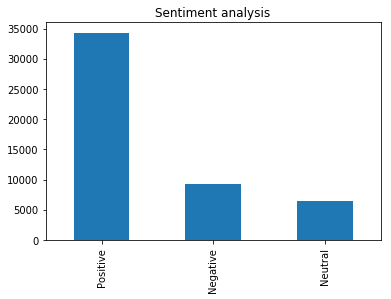

In [34]:
import matplotlib.pyplot as plt
%matplotlib inline
reviews.sentiment.value_counts().plot(kind='bar', title="Sentiment analysis")

In [35]:
neg_rev =  reviews['sentiment'] == 'Negative'
neg_rev = reviews[neg_rev]
print("Number of negative reviews : {}".format(len(neg_rev)))
print(neg_rev.Reviews.iloc[0])
print(neg_rev.Reviews.iloc[1])
print(neg_rev.Reviews.iloc[2])
print(neg_rev.Reviews.iloc[3])
print(neg_rev.Reviews.iloc[4])

Number of negative reviews : 9209
Was a gift for my husband and he loves it. Replaced a first gen droid so there was no place to go but up.The phone came in a plain white box with charging cable. It looked brand new and unused.So far it has performed as a new phone with no troubles whatsoever.
Basically in the condition described. However, with no SIM card it could not be used out of the box.
By mistake, I bought a wrong iPhone. It can not work outside America. The refund was 100%.
Purchased from CellMania. First phone spent 4 hours at Verizon and could not get activated. Verizon determined the antenna was bad. Returned to CellMania and they sent a new phone after 5 days. Second phone would activate but had no service at home only in town (my son and daughters iphone 5c and iphone 5s have no service issues). Returned second phone and requested a refund. Refund was received next day. Unhappy with the phone quality and the wasted time trying to activate. Refund was quick. Back to my old 

In [36]:
neg_rev.head(3)

,Reviews,polarity_score,neutral,negative,positive,sentiment
3081,Was a gift for my husband and he loves it. Rep...,-0.6836,0.765,0.159,0.076,Negative
3089,"Basically in the condition described. However,...",-0.2960,0.891,0.109,0.000,Negative
3091,"By mistake, I bought a wrong iPhone. It can no...",-0.6705,0.703,0.297,0.000,Negative


In [37]:
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import string
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn import preprocessing 

(array([2369., 3439., 1603.,  776.,  468.,  144.,  117.,  140.,   36.,
         117.]),
 array([0.018 , 0.1162, 0.2144, 0.3126, 0.4108, 0.509 , 0.6072, 0.7054,
        0.8036, 0.9018, 1.    ]),
 <a list of 10 Patch objects>)

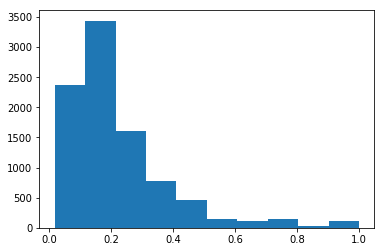

In [38]:
plt.hist(neg_rev.negative,bins =10)

In [40]:
reasons = neg_rev['Reviews'] 
reasons.head()

3081    Was a gift for my husband and he loves it. Rep...
3089    Basically in the condition described. However,...
3091    By mistake, I bought a wrong iPhone. It can no...
3092    Purchased from CellMania. First phone spent 4 ...
3100    Purchased phone SIM card missing and there was...
Name: Reviews, dtype: object

In [41]:
def preprocessing(text):
    words = word_tokenize(text)
    tokens = [w for w in words if w.lower() not in string.punctuation]
    stopw = stopwords.words('english')
    tokens = [token for token in tokens if token not in stopw]
    # remove words less than three letters
    tokens = [word for word in tokens if len(word)>=3]
    # lemmatize
    lemma = WordNetLemmatizer()
    tokens = [lemma.lemmatize(word) for word in tokens]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

l_data = str(reasons)
#l_data
list = [l_data]
word_list = []
for line in list:
    word_list.append(preprocessing(line))
word_list

["3081 Was gift husband love Rep ... 3089 Basically condition described However ... 3091 mistake bought wrong iPhone ... 3092 Purchased CellMania First phone spent ... 3100 Purchased phone SIM card missing ... 3101 After reviewing phone trying everythin ... 3102 Home button mind working spor ... 3111 Received phone time ready ... 3117 Minor annoying glitch texting Not ... 3118 Broke within two week could n't turn ... 3125 This phone advertised Verizon.. DOES ... 3131 Phone broken got 3140 glitch really bad charger ... 3161 When received n't come SIM ... 3179 The case beat expected ... 3184 This fine put descri ... 3185 Buttons broken le month 3188 talk phone minute ... 3193 Product arrived quickly described Defecti ... 3199 Phone severe hardware problem 3207 The phone type freeze 3210 Received phone time ready ... 3211 While packaging tact phone ... 3229 Received garbage defeated phone 3236 've month proble ... 3239 This phone NOT compatible Verizon ... 3253 ... The phone already messi

In [42]:
token = word_tokenize(l_data)
from nltk import FreqDist
freqd = FreqDist(token)
freqd.items()
import operator
sorted_freq = sorted(freqd.items(), key=operator.itemgetter(1))
sorted_freq
# converting into dictionary 
def listtodict(A, di): 
   di = dict(A) 
   return di 

# Driver Code  
A = sorted_freq 
di = {} 
print ("The Dictionary Is ::>",listtodict(A, di)) 

The Dictionary Is ::> {'3081': 1, 'Was': 1, 'gift': 1, 'husband': 1, 'he': 1, 'loves': 1, 'Rep': 1, '3089': 1, 'Basically': 1, 'condition': 1, 'However': 1, '3091': 1, 'By': 1, 'mistake': 1, 'wrong': 1, 'can': 1, '3092': 1, 'from': 1, 'CellMania': 1, 'spent': 1, '4': 1, '3100': 1, 'missing': 1, 'there': 1, '3101': 1, 'After': 1, 'reviewing': 1, 'trying': 1, 'everythin': 1, '3102': 1, 'Home': 1, 'button': 1, 'has': 1, 'mind': 1, 'own': 1, 'working': 1, 'spor': 1, '3111': 1, '3117': 1, 'Minor': 1, 'annoying': 1, 'glitch': 1, 'texting': 1, '3118': 1, 'Broke': 1, 'within': 1, 'two': 1, 'weeks': 1, 'could': 1, 'turn': 1, 'ba': 1, '3125': 1, 'Verizon..': 1, 'DOES': 1, '3131': 1, '3140': 1, 'glitches': 1, 'An': 1, '3161': 1, 'When': 1, 'come': 1, 'ca': 1, '3179': 1, 'case': 1, 'beat': 1, 'expected': 1, 'We': 1, 'ha': 1, '3184': 1, 'fine': 1, 'they': 1, 'should': 1, 'put': 1, 'descri': 1, '3185': 1, 'Buttons': 1, 'were': 1, 'less': 1, '3188': 1, 'If': 1, 'talk': 1, '10': 1, 'minute': 1, '3193'

In [63]:
dict_data = {'3081': 1, 'gift': 1, 'husband': 1, 'he': 1, 'loves': 1, 'Rep': 1, '3089': 1, 'Basically': 1, 'However': 1, '3091': 1, 'By': 1, 'mistake': 1, 'can': 1, '3092': 1, 'from': 1, 'CellMania': 1, 'First': 1, 'spent': 1, '4': 1, '3100': 1, 'there': 1, '3101': 1, 'After': 1, 'reviewing': 1, 'trying': 1, 'everythin': 1, '3102': 1, 'Home': 1, 'button': 1, 'mind': 1, 'own': 1, 'working': 1, 'spor': 1, '3111': 1, '3117': 1, 'Minor': 1, 'annoying': 1, 'glitch': 1, 'texting': 1, 'Not': 1, '3118': 1, 'Broke': 1, 'within': 1, 'turn': 1, 'ba': 1, '3125': 1, 'advertised': 1, 'Verizon..': 1, 'DOES': 1, '3131': 1, 'got': 1, '3140': 1, 'glitches': 1, 'really': 1, 'charger': 1, 'An': 1, '3161': 1, 'When': 1, 'received': 1, 'come': 1, 'ca': 1, '3179': 1, 'case': 1, 'beat': 1, 'We': 1, 'ha': 1, '3184': 1, 'fine': 1, 'they': 1, 'should': 1, 'put': 1, 'descri': 1, '3185': 1, 'Buttons': 1, 'were': 1, 'less': 1, '3188': 1, 'If': 1, 'talk': 1, '10': 1, 'minute': 1, '3193': 1, 'Product': 1, 'quickly': 1, 'Defecti': 1, '3199': 1, 'severe': 1, 'hardware': 1, '3207': 1, 'types': 1, 'by': 1, 'itself': 1, 'freezes': 1, '3210': 1, '3211': 1, 'While': 1, 'packaging': 1, 'tact': 1, '3229': 1, 'garbage': 1, 'defeated': 1, 'phones': 1, '3236': 1, 'about': 1, 'proble': 1, '3239': 1, 'compatible': 1, 'Verizon': 1, '3253': 1, 'No': 1, 'already': 1, 'messing': 1, 'ne': 1, '3257': 1, 'Update': 1, 'blaming': 1, 'vendor': 1, '3258': 1, 'Delivery': 1, 'great': 1, 'make': 1, '3264': 1, 'Like': 1, 'little': 1, 'Apple': 1, 'prog': 1, '206219': 1, '206224': 1, 'Starting': 1, 'having': 1, 'after': 1, 'owne': 1, '206225': 1, 'charge': 1, 'cable': 1, 'bad.I': 1, '206228': 1, 'Trouble Installed': 13, 'WhatsApp': 1, '206234': 1, 'fast': 1, 'comunication': 1, '206242': 1, 'WORST': 1, 'PIECE': 1, 'OF': 1, 'CRAP': 1, 'THAT': 1, "'VE": 1, 'EVER': 1, 'BOUGHT': 1, 'ON': 1, '206243': 1, 'does': 1, 'indicate': 1, 'low': 1, '206247': 1, 'few': 1, '206268': 1, 'Description': 1, '206269': 1, 'every': 1, 'side': 1, 'came': 1, 'scratchy screen': 14, 'dir': 1, '206270': 1, 'okay': 1, 'if': 1, 'noted': 1, '206272': 1, 'properly': 1, '206275': 1, 'DID': 1, 'say': 1, 'IMEI': 1, 'Can': 1, 'thi': 1, '206276': 1, 'Bought': 1, 'work': 1, '206277': 1, '206284': 1, 'AT': 1, '&': 1, 'T': 1, 'says': 1, 'reported': 1, 'sto': 1, '206294': 1, 'Available': 1, 'definitely': 1, '8GB': 1, '-': 1, '206300': 1, 'defective': 1, '!': 1, 'will': 1, 'hold': 1, '206301': 1, 'part': 1, 'holds': 1, 'simcard': 1, '206302': 1, 'allow': 1, 'me': 1, 'upload': 1, 'music..': 1, '206304': 1, 'Ca': 1, 'complain': 1, 'Best': 1, 'price': 1, 'find': 1, '206306': 1, '206308': 1, 'dislike': 1, 'product': 1, 'sent': 1, '258493': 1, 'item': 1, 'BUT': 1, '258500': 1, 'disappointed': 1, 'Others': 1, '258502': 1, 'give': 1, 'star': 1, 'because': 1, 'first': 1, '405033': 1, 'probably': 1, 'provider': 1, 's': 1, '405034': 1, 'far': 1, 'service': 1, 'here': 1, '405037': 1, 'HAD': 1, 'IT': 1, 'FOR': 1, 'MINUTE': 1, 'NOW': 1, 'SO': 1, 'COME': 1, '405038': 1, "'s": 1, 'best': 1, 'battery': 1, 'do': 1, 'last': 1, 'lo': 1, 'Name': 1, 'Reviews': 1, 'Length': 1, '9870': 1, 'dtype': 1, 'object': 1, 'Was': 2, 'my': 2, 'described': 2, 'bought': 2, 'wrong': 2, 'iPhone': 2, 'Purchased': 2, 'has': 2, 'ready': 2, 'be': 2, 'very': 2, 'two': 2, 'weeks': 2, 'could': 2, 'broken': 2, 'up': 2, 'expected': 2, 'arrived': 2, 'problems': 2, "'ve": 2, 'said': 2, 'tray': 2, 'cr': 2, 'one': 2, 'week': 2, 'memory': 2, 'Very': 2, 'good': 2, 'A': 2, 'that': 2, 'only': 2, 'been': 2, 'would': 2, 'HAVE': 2, 'condition': 3, 'no': 3, 'card': 3, 'its': 3, 'Received': 3, 'time': 3, 'when': 3, 'This': 3, 'bad': 3, 'did': 3, 'more': 3, 'month': 3, 'NOT': 3, 'am': 3, 'new': 3, 'worked': 3, 'use': 3, 'SIM': 4, 'missing': 4, 'of': 4, 'to': 4, 'with': 4, 'than': 4, ':': 4, 'for': 5, 'in': 5, 'It': 5, "n't": 5, 'as': 5, 'less Phone memory': 15, 'is': 6, 'had': 6, 'not': 6, 'this': 6, 'on': 7, 'but': 8}

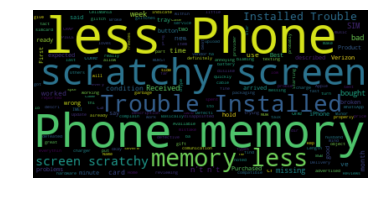

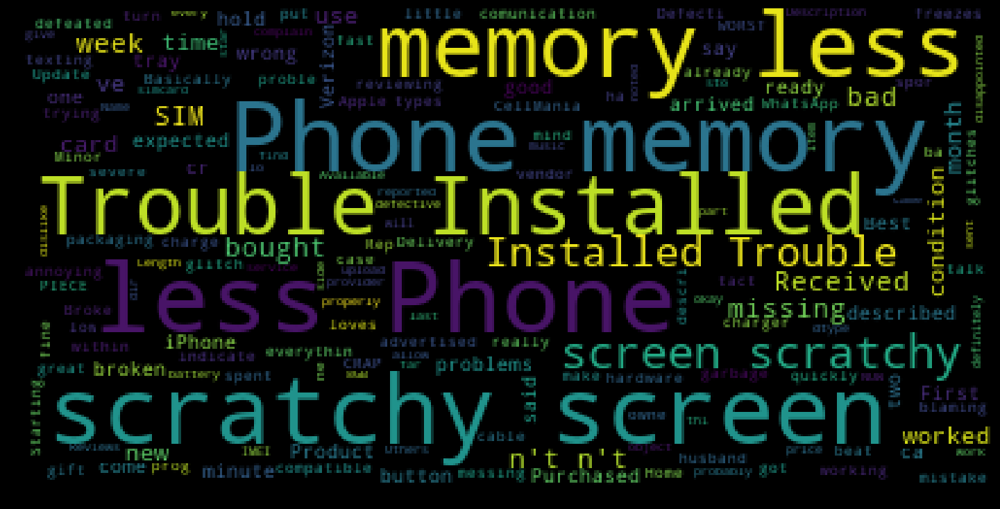

In [64]:
import os

from os import path
from wordcloud import WordCloud

# using word frequency list:
word_freq = dict_data
text = " ".join([(k + " ")*v for k,v in word_freq.items()])

# Generate a word cloud image
wordcloud = WordCloud().generate(text)


# Display the generated image:
# the matplotlib way:
import matplotlib.pyplot as plt
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

# lower max_font_size
wordcloud = WordCloud(max_font_size=40).generate(text)

plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [45]:
# state_data = str(neg_rev.Reviews)
# state_data
state_data = str(word_list)
state_data

'["3081 Was gift husband love Rep ... 3089 Basically condition described However ... 3091 mistake bought wrong iPhone ... 3092 Purchased CellMania First phone spent ... 3100 Purchased phone SIM card missing ... 3101 After reviewing phone trying everythin ... 3102 Home button mind working spor ... 3111 Received phone time ready ... 3117 Minor annoying glitch texting Not ... 3118 Broke within two week could n\'t turn ... 3125 This phone advertised Verizon.. DOES ... 3131 Phone broken got 3140 glitch really bad charger ... 3161 When received n\'t come SIM ... 3179 The case beat expected ... 3184 This fine put descri ... 3185 Buttons broken le month 3188 talk phone minute ... 3193 Product arrived quickly described Defecti ... 3199 Phone severe hardware problem 3207 The phone type freeze 3210 Received phone time ready ... 3211 While packaging tact phone ... 3229 Received garbage defeated phone 3236 \'ve month proble ... 3239 This phone NOT compatible Verizon ... 3253 ... The phone already m

In [46]:
token = word_tokenize(state_data)
from nltk import FreqDist
#tokens_state = ''.join([i for i in tokens_state if not i.isdigit()])
freqd = FreqDist(token)
freqd.items()

dict_items([('[', 1), ('``', 1), ('3081', 1), ('Was', 1), ('gift', 1), ('husband', 1), ('love', 1), ('Rep', 1), ('...', 52), ('3089', 1), ('Basically', 1), ('condition', 1), ('described', 2), ('However', 1), ('3091', 1), ('mistake', 1), ('bought', 2), ('wrong', 1), ('iPhone', 6), ('3092', 1), ('Purchased', 2), ('CellMania', 1), ('First', 3), ('phone', 16), ('spent', 1), ('3100', 1), ('SIM', 2), ('card', 2), ('missing', 1), ('3101', 1), ('After', 1), ('reviewing', 1), ('trying', 1), ('everythin', 1), ('3102', 1), ('Home', 1), ('button', 1), ('mind', 1), ('working', 1), ('spor', 1), ('3111', 1), ('Received', 3), ('time', 2), ('ready', 2), ('3117', 1), ('Minor', 1), ('annoying', 1), ('glitch', 2), ('texting', 1), ('Not', 3), ('3118', 1), ('Broke', 1), ('within', 1), ('two', 1), ('week', 1), ('could', 1), ("n't", 6), ('turn', 1), ('3125', 1), ('This', 4), ('advertised', 3), ('Verizon..', 1), ('DOES', 1), ('3131', 1), ('Phone', 7), ('broken', 2), ('got', 2), ('3140', 1), ('really', 2), ('ba

In [47]:
import operator
sorted_freq = sorted(freqd.items(), key=operator.itemgetter(1))
sorted_freq

[('[', 1),
 ('``', 1),
 ('3081', 1),
 ('Was', 1),
 ('gift', 1),
 ('husband', 1),
 ('love', 1),
 ('Rep', 1),
 ('3089', 1),
 ('Basically', 1),
 ('condition', 1),
 ('However', 1),
 ('3091', 1),
 ('mistake', 1),
 ('wrong', 1),
 ('3092', 1),
 ('CellMania', 1),
 ('spent', 1),
 ('3100', 1),
 ('missing', 1),
 ('3101', 1),
 ('After', 1),
 ('reviewing', 1),
 ('trying', 1),
 ('everythin', 1),
 ('3102', 1),
 ('Home', 1),
 ('button', 1),
 ('mind', 1),
 ('working', 1),
 ('spor', 1),
 ('3111', 1),
 ('3117', 1),
 ('Minor', 1),
 ('annoying', 1),
 ('texting', 1),
 ('3118', 1),
 ('Broke', 1),
 ('within', 1),
 ('two', 1),
 ('week', 1),
 ('could', 1),
 ('turn', 1),
 ('3125', 1),
 ('Verizon..', 1),
 ('DOES', 1),
 ('3131', 1),
 ('3140', 1),
 ('3161', 1),
 ('When', 1),
 ('come', 1),
 ('3179', 1),
 ('case', 1),
 ('beat', 1),
 ('expected', 1),
 ('3184', 1),
 ('fine', 1),
 ('put', 1),
 ('descri', 1),
 ('3185', 1),
 ('Buttons', 1),
 ('le', 1),
 ('3188', 1),
 ('talk', 1),
 ('minute', 1),
 ('3193', 1),
 ('Product',

In [48]:
token

['[',
 '``',
 '3081',
 'Was',
 'gift',
 'husband',
 'love',
 'Rep',
 '...',
 '3089',
 'Basically',
 'condition',
 'described',
 'However',
 '...',
 '3091',
 'mistake',
 'bought',
 'wrong',
 'iPhone',
 '...',
 '3092',
 'Purchased',
 'CellMania',
 'First',
 'phone',
 'spent',
 '...',
 '3100',
 'Purchased',
 'phone',
 'SIM',
 'card',
 'missing',
 '...',
 '3101',
 'After',
 'reviewing',
 'phone',
 'trying',
 'everythin',
 '...',
 '3102',
 'Home',
 'button',
 'mind',
 'working',
 'spor',
 '...',
 '3111',
 'Received',
 'phone',
 'time',
 'ready',
 '...',
 '3117',
 'Minor',
 'annoying',
 'glitch',
 'texting',
 'Not',
 '...',
 '3118',
 'Broke',
 'within',
 'two',
 'week',
 'could',
 "n't",
 'turn',
 '...',
 '3125',
 'This',
 'phone',
 'advertised',
 'Verizon..',
 'DOES',
 '...',
 '3131',
 'Phone',
 'broken',
 'got',
 '3140',
 'glitch',
 'really',
 'bad',
 'charger',
 '...',
 '3161',
 'When',
 'received',
 "n't",
 'come',
 'SIM',
 '...',
 '3179',
 'The',
 'case',
 'beat',
 'expected',
 '...',
 

In [49]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np

vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(token)

topics = 10
lda = LatentDirichletAllocation(n_components = topics,
                                max_iter=100,
                               learning_method='online',
                               learning_offset=50.,
                               random_state=2017)
lda.fit(X)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='online', learning_offset=50.0,
             max_doc_update_iter=100, max_iter=100, mean_change_tol=0.001,
             n_components=10, n_jobs=None, n_topics=None, perp_tol=0.1,
             random_state=2017, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

In [50]:
feature_names = np.array(vectorizer.get_feature_names())
feature_names

array(['3081', '3089', '3091', '3092', '3100', '3101', '3102', '3111',
       '3117', '3118', '3125', '3131', '3140', '3161', '3179', '3184',
       '3185', '3188', '3193', '3199', '3207', '3210', '3211', '3229',
       '3236', '3239', '3253', '3257', '3258', '3264', '70949', '70953',
       '70964', '70970', '70978', '70983', '70985', '70998', '71007',
       '71013', '71014', '71036', '71040', '71073', '71078', '71079',
       '71080', '71083', '71094', '71111', '71116', '71123', '71136',
       '71145', '71157', '71176', '71191', '71200', '71211', '71218',
       '800', '9209', 'advertised', 'amazing', 'amazon', 'annoying',
       'apple', 'arrived', 'bad', 'basically', 'beat', 'big', 'bit',
       'blaming', 'bot', 'bought', 'box', 'broke', 'broken', 'button',
       'buttons', 'buy', 'buying', 'cable', 'card', 'case', 'cellmania',
       'charger', 'color', 'come', 'coment', 'compatible', 'condition',
       'defeated', 'defecti', 'delivery', 'descri', 'described', 'does',
       

In [51]:
lda.components_

array([[0.10003   , 0.10003318, 0.10003224, ..., 0.10003234, 0.10002732,
        0.10003371],
       [0.10003717, 0.10003118, 0.10002556, ..., 0.10003528, 0.1000351 ,
        0.1000363 ],
       [0.10003766, 0.10002961, 0.10002744, ..., 0.10003007, 0.1000275 ,
        0.10003738],
       ...,
       [0.10003348, 0.10003121, 0.10002978, ..., 0.10003957, 0.10002894,
        0.10003271],
       [0.10003658, 0.10003498, 0.10002659, ..., 0.87451393, 0.88542539,
        0.10003384],
       [0.10003541, 0.10003914, 0.10003859, ..., 0.10003477, 0.10003204,
        0.10003571]])

In [52]:
for idx, topic in enumerate(lda.components_):
    print("Topic #%d:" % idx)
    print(" ".join([feature_names[i] for i in topic.argsort()[:-10 - 1:-1]]))

Topic #0:
fake iphone dtype pl took month right 71014 support read
Topic #1:
unlocked verif card bit far 71040 liar 71157 ve box
Topic #2:
switch today terrible 71073 rose flimsy freeze garbage easy proble
Topic #3:
send amazon bad bought glitch 71200 71083 buying story good
Topic #4:
great 71218 new sim receive charger 71123 71078 71116 horror
Topic #5:
phone reviews paid instead order problem scam 71079 3236 packaging
Topic #6:
received time broken fakes 71176 previous hearing bot 3229 3257
Topic #7:
9209 length advertised seller really got described purchased coment michaelm9
Topic #8:
like object buy listed verified 800 verizon ready 71111 negativ
Topic #9:
product gold 71094 cable 71211 hone 71145 reveived 70978 messing


# NMF(Non-negative Matrix Factorization) for topic modeling

In [53]:
from sklearn.decomposition import NMF
topics =20
nmf = NMF(n_components=topics,
         random_state=2017,
         alpha=.1,
         l1_ratio=.5)
nmf.fit(X)

NMF(alpha=0.1, beta_loss='frobenius', init=None, l1_ratio=0.5, max_iter=200,
  n_components=20, random_state=2017, shuffle=False, solver='cd',
  tol=0.0001, verbose=0)

In [54]:
from sklearn.decomposition import NMF
topics =20
nmf = NMF(n_components=topics,
         random_state=2017,
         alpha=.1,
         l1_ratio=.5)
nmf.fit(X)

NMF(alpha=0.1, beta_loss='frobenius', init=None, l1_ratio=0.5, max_iter=200,
  n_components=20, random_state=2017, shuffle=False, solver='cd',
  tol=0.0001, verbose=0)

In [55]:
for idx, topic in enumerate(nmf.components_):
    print("Topic #%d:" % idx)
    print(" ".join([feature_names[i] for i in topic.argsort()[:-10 - 1:-1]]))

Topic #0:
phone wrong amazing blaming bit big beat basically bad arrived
Topic #1:
iphone pl wrong amazon blaming bit big beat basically bad
Topic #2:
fake wrong amazon bot blaming bit big beat basically bad
Topic #3:
buy wrong box bot blaming bit big beat basically bad
Topic #4:
received wrong amazing blaming bit big beat basically bad arrived
Topic #5:
unlocked wrong amazing blaming bit big beat basically bad arrived
Topic #6:
new wrong amazing blaming bit big beat basically bad arrived
Topic #7:
advertised wrong amazon bot blaming bit big beat basically bad
Topic #8:
great wrong box bot blaming bit big beat basically bad
Topic #9:
like amazon bot blaming bit big beat basically bad arrived
Topic #10:
paid wrong amazing blaming bit big beat basically bad arrived
Topic #11:
instead wrong box bot blaming bit big beat basically bad
Topic #12:
product amazing blaming bit big beat basically bad arrived apple
Topic #13:
sim wrong 71116 blaming bit big beat basically bad arrived
Topic #14:
b

In [56]:
text = neg_rev
text.head()

,Reviews,polarity_score,neutral,negative,positive,sentiment
3081,Was a gift for my husband and he loves it. Rep...,-0.6836,0.765,0.159,0.076,Negative
3089,"Basically in the condition described. However,...",-0.2960,0.891,0.109,0.000,Negative
3091,"By mistake, I bought a wrong iPhone. It can no...",-0.6705,0.703,0.297,0.000,Negative
3092,Purchased from CellMania. First phone spent 4 ...,-0.9343,0.840,0.145,0.016,Negative
3100,Purchased phone SIM card missing and there was...,-0.7712,0.741,0.259,0.000,Negative


In [57]:
# Let's create a function to pull out nouns from a string of text
from nltk import word_tokenize, pos_tag

def nouns(text):
    '''Given a string of text, tokenize the text and pull out only the nouns.'''
    is_noun = lambda pos: pos[:2] == 'NN'
    tokenized = word_tokenize(text)
    all_nouns = [word for (word, pos) in pos_tag(tokenized) if is_noun(pos)] 
    return ' '.join(all_nouns)

In [58]:
# Apply the nouns function to the transcripts to filter only on nouns
data_nouns = pd.DataFrame(text.Reviews.apply(nouns))
data_nouns

,Reviews
3081,gift husband gen droid place phone plain box c...
3089,condition SIM card box
3091,mistake iPhone America refund %
3092,CellMania First phone hours Verizon Verizon an...
3100,phone SIM card sound Quality Response lot phones
3101,phone everything ywsteady phone sim Long story...
3102,Home button mind
3111,phone time Verizon.UPDATED months phone screen...
3117,Minor glitch purchase
3118,Broke weeks time zone Austria


In [59]:
# Create a new document-term matrix using only nouns
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

# Re-add the additional stop words since we are recreating the document-term matrix
add_stop_words = ['like', 'im', 'know', 'just', 'dont', 'thats', 'right', 'people',
                  'youre', 'got', 'gonna', 'time', 'think', 'yeah', 'said']
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate a document-term matrix with only nouns
cvn = CountVectorizer(stop_words=stop_words)
data_cvn = cvn.fit_transform(data_nouns.Reviews)
data_dtmn = pd.DataFrame(data_cvn.toarray(), columns=cvn.get_feature_names())
data_dtmn.index = data_nouns.index
data_dtmn

,04,15,1cons,2014,21,3mins,5th,8gb,90,a1241,...,yo,yoga,youngramseylord,yr,ywsteady,zero,zip,zone,zooming,买来三天就被偷了not
3081,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3089,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3091,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3092,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3100,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3101,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3102,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3111,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3118,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [60]:
from gensim import matutils, models
import scipy.sparse
# Create the gensim corpus
corpusn = matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmn.transpose()))

# Create the vocabulary dictionary
id2wordn = dict((v, k) for k, v in cvn.vocabulary_.items())
# Let's try 4 topics
ldan = models.LdaModel(corpus=corpusn, num_topics=10, id2word=id2wordn, passes=10)
ldan.print_topics()

[(0,
  '0.142*"phone" + 0.083*"problems" + 0.067*"verizon" + 0.048*"refund" + 0.031*"iphone" + 0.029*"screen" + 0.022*"brand" + 0.021*"charger" + 0.019*"scratches" + 0.016*"days"'),
 (1,
  '0.157*"iphone" + 0.071*"apple" + 0.045*"product" + 0.035*"phone" + 0.030*"fake" + 0.029*"plus" + 0.024*"problem" + 0.019*"days" + 0.018*"buy" + 0.015*"model"'),
 (2,
  '0.076*"phone" + 0.046*"purchase" + 0.037*"phones" + 0.037*"iphone" + 0.022*"apple" + 0.021*"amazon" + 0.021*"lot" + 0.017*"company" + 0.016*"card" + 0.015*"experience"'),
 (3,
  '0.162*"phone" + 0.053*"charger" + 0.038*"box" + 0.024*"apple" + 0.022*"cable" + 0.021*"button" + 0.021*"service" + 0.018*"power" + 0.017*"shipping" + 0.017*"speaker"'),
 (4,
  '0.122*"phone" + 0.081*"card" + 0.071*"sim" + 0.041*"money" + 0.040*"charger" + 0.028*"seller" + 0.024*"home" + 0.021*"button" + 0.021*"waste" + 0.019*"product"'),
 (5,
  '0.124*"sprint" + 0.068*"phone" + 0.059*"month" + 0.044*"mobile" + 0.024*"accessories" + 0.018*"product" + 0.018*"d